<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230514.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)

# 준비
+ synthetic data를 만든다.
+ 해당 data는 importance가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다. 

## synthetic data의 생성

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 importance

In [4]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [5]:
seed_everything()

y= (np.random.normal(0.5,0.5,100) > 0.5).astype(int)
sum(y)

40

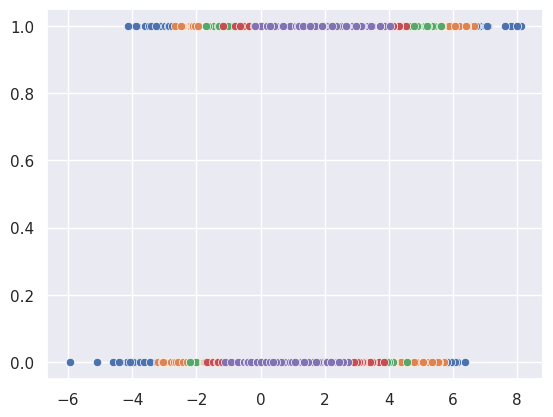

In [6]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    sns.scatterplot(x=x[:,ix],y=y)

<Axes: >

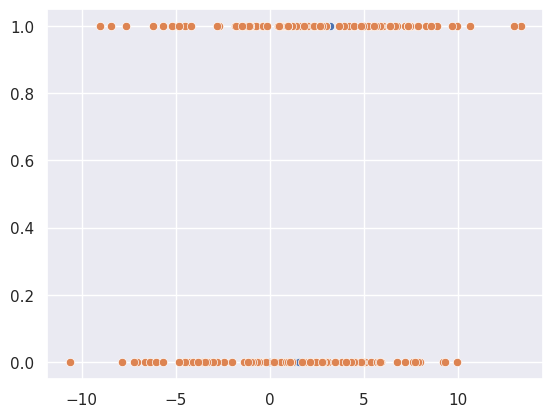

In [7]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)    
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
sns.scatterplot(x=x[0:200,4],y=y[0:200])
sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

## Mutual Information의 측정

In [8]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [9]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
mi_scores = make_mi_scores(X, y, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
x1    0.079411
x0    0.050887
z0    0.027068
Name: MI Scores, dtype: float64


### Bucket 별 MI 측정

+ Bucket을 10, 50, 100 으로 나눠서

Bucket size 10


100%|██████████| 10/10 [00:01<00:00,  8.86it/s]


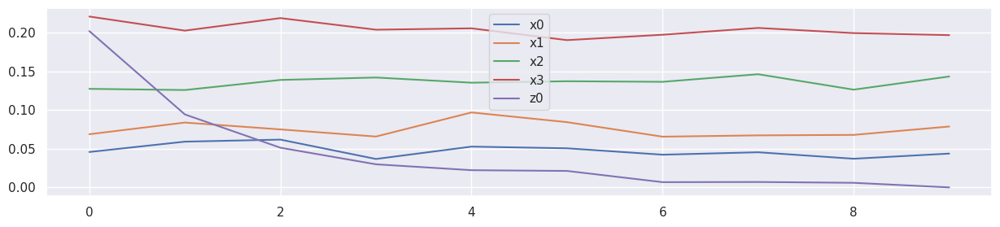

Bucket size 50


100%|██████████| 50/50 [00:01<00:00, 37.95it/s]


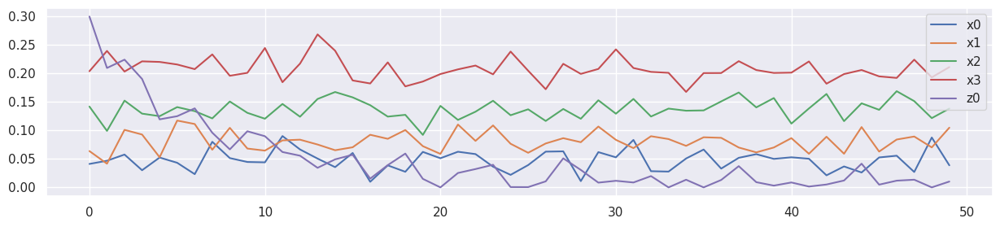

Bucket size 100


100%|██████████| 100/100 [00:01<00:00, 58.44it/s]


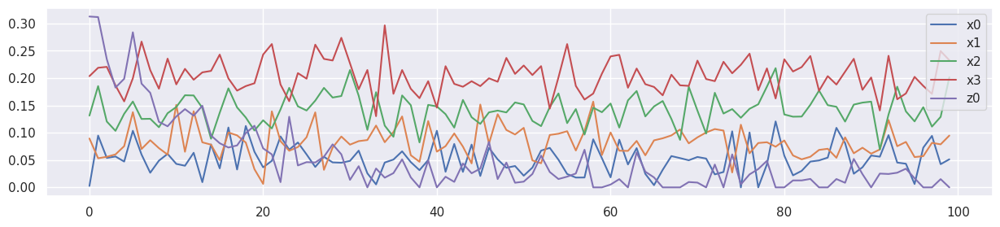

Bucket size 200


100%|██████████| 200/200 [00:02<00:00, 78.30it/s]


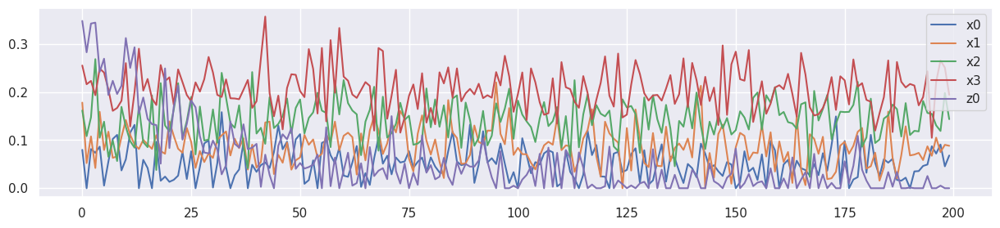

In [10]:
from tqdm import tqdm

bucket_size_array=[10,50,100,200]

for bucket_size in bucket_size_array:
    #bucket_size = 10
    print('Bucket size',bucket_size)
    MIS = {}
    for col in columns:
        MIS[col] = []

    step_size = int(x.shape[0]/bucket_size)
    for bk in tqdm(range(bucket_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X[bk*step_size:bk*step_size+step_size], y[bk*step_size:bk*step_size+step_size], discrete_features="auto")
        for col in columns:
            MIS[col].append(mi_scores[col]) 

    df_mis = pd.DataFrame(MIS)
    df_mis.plot(figsize=(15,3))
    plt.show()

+ 상기 실험에서, z0의 MI는 bucket의 증가에 따라, 낮아지는 것을 확인할 수 있다.

# Deep architecture에 의한 y의 추정 실험

+ 2000개를 학습하고, 이후 38000개를 추정한다.

## 학습데이터, 2000개 내 bucket 20개의 importance 변화

100%|██████████| 20/20 [00:00<00:00, 105.49it/s]


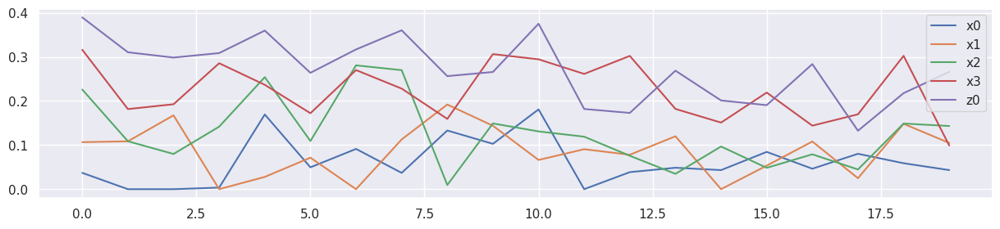

In [11]:
MIS = {}
for col in columns:
    MIS[col] = []
        
for bk in tqdm(range(20)):
    bx = X[bk*100:(bk+1)*100]
    by = y[bk*100:(bk+1)*100]
    mi_scores = make_mi_scores(bx, by, discrete_features="auto")
    for col in columns:
        MIS[col].append(mi_scores[col]) 

df_mis = pd.DataFrame(MIS)
df_mis.plot(figsize=(15,3))
plt.show()

## feature 5개를 모두 포함한 학습

100%|██████████| 1000/1000 [00:21<00:00, 47.04it/s]


MSE: 0.26
RMSE: 0.51


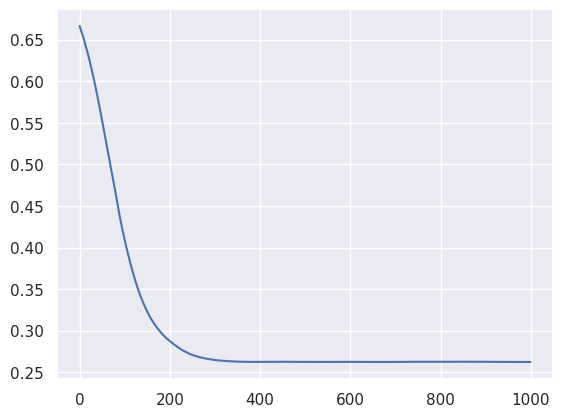

In [12]:
import copy
import torch.optim as optim
 
seed_everything()

# Convert to 2D PyTorch tensors
X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

+ F1 측정

+ 비교 대상의 측정치

In [13]:
result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

In [14]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

feature 5, test_f1 0.8685714285714285


+ 2000~40000까지의 R-squared score 측정 

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 524.14it/s]


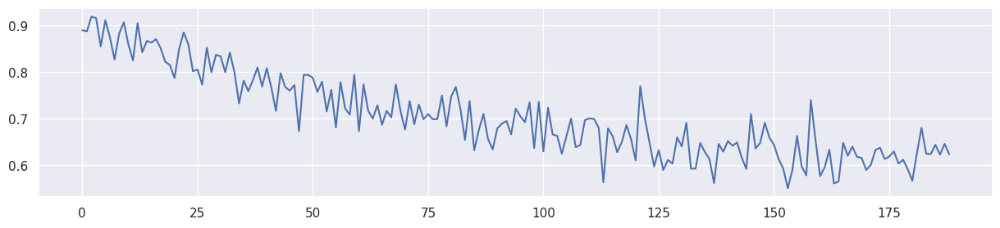

{'lambda': ['Feature 5'], 'test_f1': [0.8685714285714285], 'init_f1': [0.8899082568807338], 'mean_f1': [0.7058765598487894], 'last_f1': [0.6238532110091742], 'MI(y^,z)': [0.2622620324764773]}


In [15]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(pd.DataFrame(X_test[:,4],columns=['z0']), predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3','z0']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

print(result_table3)


## feature 5개 + bucket(B) = feature 6개를 학습

In [16]:
# bucket 하나의 크기는 100
# 2000개의 학습데이터에는 20개의 bucket이 있음.
# 학습데이터 100개당 +1의 bucket count를 증가 시킴
X['b'] = [int(b) for b in X.index.values/100]
X

,x0,x1,x2,x3,z0,b
0,2.231833,0.663053,2.160447,1.180836,1.125117,0
1,1.326272,2.285045,2.362769,2.638806,2.171340,0
2,1.845348,3.743190,3.310210,1.772473,2.576518,0
3,2.974414,-0.229197,1.024580,1.387895,0.873782,0
4,2.854022,3.102544,1.610779,1.774781,2.490660,0
...,...,...,...,...,...,...
39995,0.085122,-0.571732,1.527233,1.867146,-1.177338,399
39996,1.069521,-0.221247,1.324087,1.798258,4.045168,399
39997,0.429295,2.593988,2.329410,1.859496,1.785665,399
39998,1.611266,-0.588687,-0.591898,2.126287,9.291351,399


100%|██████████| 1000/1000 [00:21<00:00, 45.97it/s]


MSE: 0.30
RMSE: 0.54


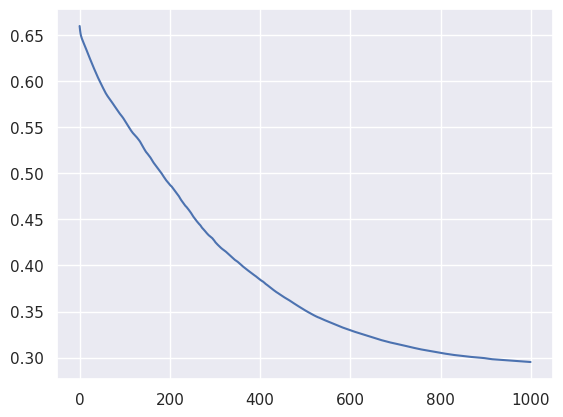

In [17]:
seed_everything()

X_train = torch.tensor(X[0:1800].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(6, 24),
    nn.ReLU(),
    nn.Linear(24, 6),
    nn.ReLU(),
    nn.Linear(6, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

In [18]:
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('F1 score',f1)

F1 score 0.875


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 510.36it/s]


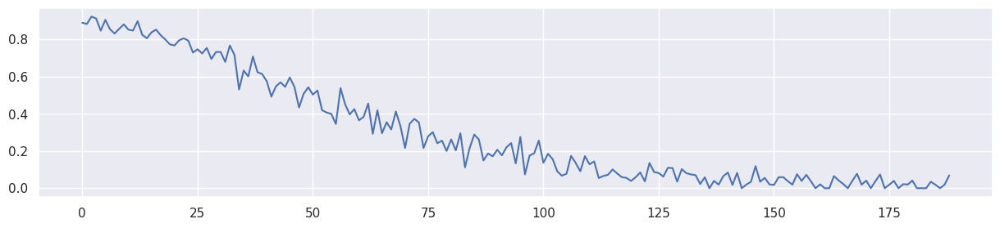

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467


In [19]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(pd.DataFrame(X_test[:,4],columns=['z0']), predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3','z0','b']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 6')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

## z0를 빼고, 4개 feature로 학습

100%|██████████| 1000/1000 [00:20<00:00, 47.88it/s]


MSE: 0.13
RMSE: 0.36


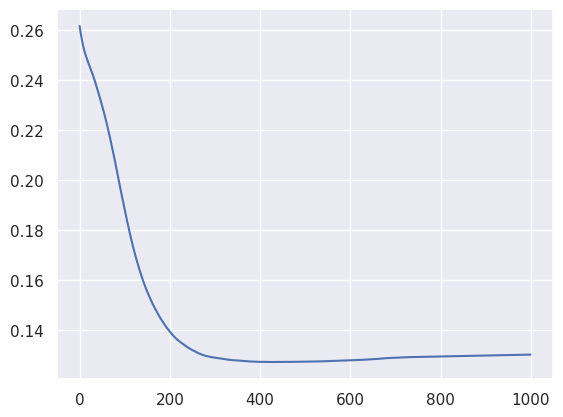

In [20]:
seed_everything()

X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3']].values, dtype=torch.float32)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3']].values, dtype=torch.float32)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1)
 
# Define the model
model = nn.Sequential(
    nn.Linear(4, 16),
    nn.ReLU(),
    nn.Linear(16, 4),
    nn.ReLU(),
    nn.Linear(4, 1),
    nn.Sigmoid()
)
 
# loss function and optimizer
loss_fn = nn.MSELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)
 
n_epochs = 1000   # number of epochs to run
batch_size = 100 # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)
 
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

In [21]:
predicted_y = model(X_test)
f1 = f1_score(y_test,(predicted_y.data.numpy()> 0.5).astype(float))
print('F1 score',f1)

F1 score 0.7657142857142858


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
100%|██████████| 189/189 [00:00<00:00, 531.77it/s]


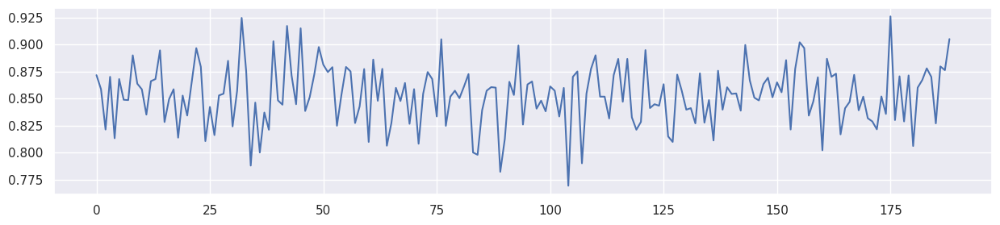

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596


In [22]:
predicted_y = model(X_test)
predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
f1 = f1_score(y_test, predicted_y)

mi_scores = make_mi_scores(X[1800:2000][['z0']], predicted_y, discrete_features="auto")

XT = X[2000:][['x0','x1','x2','x3']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=(15,3))
    plt.plot(f1s)
    plt.show()

result_table3['lambda'].append('Feature 4')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

+ 위에서 보면.... 학습과정에서, 현재는 학습에 효과가 있지만 향후 잠재적으로 성능을 저해할 수 있는 feature를 탐지하여 이의 효과를 경감 또는 (보정) 할 수 있는 학습 방법을 찾아야 하는 것!!!

## RF-Train의 적용

+ 위의 데이터에서, sensitive attribute는 z0에 대당된다.
+ 따라서, MI(y^|z0) = 0 이되어야 하고,
+ Fairness discriminator에서는  Y^과 z0의 loss가 커야 한다! 즉, 최대한 상관 없어야 한다.
+ OK, 일단 이렇게 구성해 본다!

In [23]:
!git clone https://github.com/yuji-roh/fr-train.git

Cloning into 'fr-train'...
remote: Enumerating objects: 31, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 31 (delta 9), reused 4 (delta 0), pack-reused 0
Unpacking objects: 100% (31/31), 168.32 KiB | 3.43 MiB/s, done.


In [24]:
%cd fr-train
!pwd

/content/fr-train
/content/fr-train


In [25]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

+ Generator의 구현 = 위에서 feature 5개의 model과 동일
+ DiscriminatorF = Y^과 z0가 같아지지 않게 학습 ??

In [26]:

def test_model(model_, tX, ty, s1):
    """Tests the performance of a model.

    Args:
        model_: A model to test.
        X: Input features of test data.
        y: True label (1-D) of test data.
        s1: Sensitive attribute (1-D) of test data.

    Returns:
        The test accuracy and disparate impact of the model.
    """
    
    model_.eval()
    
    y_hat = model_(tX)
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [27]:
# Define the Generator
class Generator(nn.Module):
    """FR-Train generator (classifier).
    
    This class is for defining the structure of FR-Train generator (classifier). 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes Generator with torch components."""
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(5, 20),
            nn.ReLU(),
            nn.Linear(20, 5),
            nn.ReLU(),
            nn.Linear(5, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted label (y_hat) for the given input data.
        """
        
        output = self.model(input_data)
        return output

# DiscriminatorF
# regression, Y^과 z0가 같아지지 않게 학습...??? (이거 쫌 아리까리!)
class DiscriminatorF(nn.Module):
    """FR-Train fairness discriminator.
    
    This class is for defining structure of FR-Train fairness discriminator. 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(DiscriminatorF, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(2, 8),
            nn.Linear(8, 1),
            nn.Sigmoid()            
        )

    def forward(self, x1, x2):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted sensitive attribute for the given input data.
        """
        
        predicted_z = self.model(torch.cat((x1, x2), 1))
        return predicted_z
    

# DiscriminatorF
# regression, Y^과 z0가 같아지지 않게 학습...??? (이거 쫌 아리까리!)
class DiscriminatorF2(nn.Module):
    """FR-Train fairness discriminator.
    
    This class is for defining structure of FR-Train fairness discriminator. 
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """
    
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(DiscriminatorF2, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(1, 4),
            nn.Linear(4, 1)       
        )

    def forward(self, x1):
        """Defines a forward operation of the model.
        
        Args: 
            input_data: The input data.
            
        Returns:
            The predicted sensitive attribute for the given input data.
        """
        
        predicted_z = self.model(x1)
        return predicted_z
    

In [28]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    #mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.SGD(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1))
        g_loss.backward()
        g_losses.append(g_loss)
        optimizer_G.step()

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1, mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1, mi, generator

In [29]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model2(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.Adam(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    real_label = 1
    fake_label = 0

    rlabel = torch.full((train_len,), real_label, dtype=torch.float32).reshape(-1,1)
    flabel = torch.full((train_len,), fake_label, dtype=torch.float32).reshape(-1,1)
    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        #g_loss = 0.000001*mse_loss(gen_y, y_train.reshape(-1,1))

        # -------------------------------
        #  Trains Fairness Discriminator
        # -------------------------------
        optimizer_D_F.zero_grad()
        # y과 z는 무관 (MI=0) 이면, True
        # y^과 z가 상관 (MI>0) 이면, False 로 정의 한다. 
        #r_loss = bce_loss(discriminator_F(y_train.reshape(-1,1), s1_train.reshape(-1,1)),rlabel)
        #f_loss = bce_loss(discriminator_F(gen_y, s1_train.reshape(-1,1)),flabel)

        r_loss = bce_loss(discriminator_F(y_train.reshape(-1,1), s1_train.reshape(-1,1)),rlabel)
        f_loss = bce_loss(discriminator_F(gen_y, s1_train.reshape(-1,1)),flabel)

        d_f_loss =  (r_loss + f_loss) 
        #d_f_loss.backward()
        d_f_losses.append(d_f_loss)
        #optimizer_D_F.step()        
        
        #loss = (1-lambda_f) * g_loss - lambda_f * d_f_loss 

        # -------------------
        #  Update Generator
        # -------------------
        g_cost = bce_loss(gen_y, y_train.reshape(-1,1))
        #f_cost = bce_loss(discriminator_F(gen_y.detach(), s1_train.reshape(-1,1)),rlabel)
        g_loss = (1-lambda_f)*g_cost + lambda_f*d_f_loss
        g_losses.append(g_loss)
        g_loss.backward()
        optimizer_G.step()
        optimizer_D_F.step()    

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [D_F loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, d_f_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1,mi,generator

In [30]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model22(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    d_f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()
    discriminator_F = DiscriminatorF2()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)
    discriminator_F.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)
    optimizer_D_F = torch.optim.Adam(discriminator_F.parameters(), lr=train_opt.lr_f)

    train_len = XS_train.shape[0]

    real_label = 1
    fake_label = 0

    rlabel = torch.full((train_len,), real_label, dtype=torch.float32).reshape(-1,1)
    flabel = torch.full((train_len,), fake_label, dtype=torch.float32).reshape(-1,1)
    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        optimizer_G.zero_grad()
        gen_y = generator(XS_train).reshape(-1,1)
        #g_loss = 0.000001*mse_loss(gen_y, y_train.reshape(-1,1))

        # -------------------------------
        #  Trains Fairness Discriminator
        # -------------------------------
        optimizer_D_F.zero_grad()
        # y과 z는 무관 (MI=0) 이면, True
        # y^과 z가 상관 (MI>0) 이면, False 로 정의 한다. 

        # y와 z는 상관관계가 있으므로... r_loss는 최소화 시키고...
        r_loss = mse_loss(discriminator_F(y_train.reshape(-1,1)), s1_train.reshape(-1,1))
        # y^와 z는 최대한 무관하게... f_loss 최대화 시킨다..
        f_loss = mse_loss(discriminator_F(gen_y), s1_train.reshape(-1,1)) * 0.3

        d_f_loss =  (r_loss - f_loss) 
        #d_f_loss.backward()
        d_f_losses.append(d_f_loss)
        #optimizer_D_F.step()        
        
        #loss = (1-lambda_f) * g_loss - lambda_f * d_f_loss 

        # -------------------
        #  Update Generator
        # -------------------
        g_cost = bce_loss(gen_y, y_train.reshape(-1,1))
        #f_cost = bce_loss(discriminator_F(gen_y.detach(), s1_train.reshape(-1,1)),rlabel)
        g_loss = (1-lambda_f)*g_cost + lambda_f*d_f_loss
        g_losses.append(g_loss)
        g_loss.backward()
        optimizer_G.step()
        optimizer_D_F.step()    

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [D_F loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, d_f_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return f1,mi,generator

In [31]:
def test_all_data(generator):

    XT = X[2000:][['x0','x1','x2','x3','z0']]
    yT = y[2000:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            predicted_y = generator(tmp_x)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297298]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279805]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265790]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 526.00it/s]


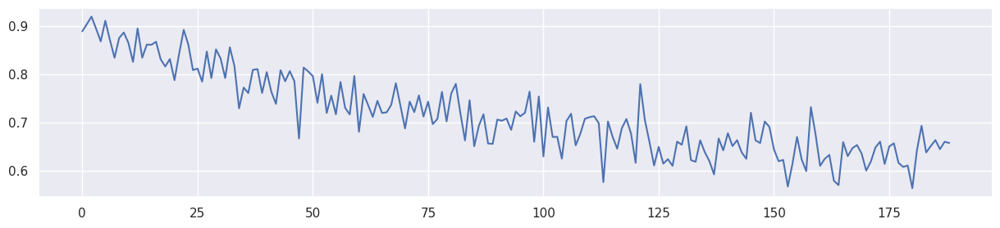

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.764362]
[Lambda: 0.100000] [Epoch 200/4000] [D_F loss: 1.385715] [G loss: 0.748424]
[Lambda: 0.100000] [Epoch 400/4000] [D_F loss: 1.379816] [G loss: 0.721642]
[Lambda: 0.100000] [Epoch 600/4000] [D_F loss: 1.369719] [G loss: 0.692447]
[Lambda: 0.100000] [Epoch 800/4000] [D_F loss: 1.361597] [G loss: 0.661667]
[Lambda: 0.100000] [Epoch 1000/4000] [D_F loss: 1.359293] [G loss: 0.629466]
[Lambda: 0.100000] [Epoch 1200/4000] [D_F loss: 1.361002] [G loss: 0.596741]
[Lambda: 0.100000] [Epoch 1400/4000] [D_F loss: 1.364284] [G loss: 0.563744]
[Lambda: 0.100000] [Epoch 1600/4000] [D_F loss: 1.368028] [G loss: 0.531376]
[Lambda: 0.100000] [Epoch 1800/4000] [D_F loss: 1.371693] [G loss: 0.499893]
[Lambda: 0.100000] [Epoch 2000/4000] [D_F loss: 1.375391] [G loss: 0.471105]
[Lambda: 0.100000] [Epoch 2200/4000] [D_F loss: 1.378541] [G loss: 0.446026]
[Lambda: 0.100000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 537.04it/s]


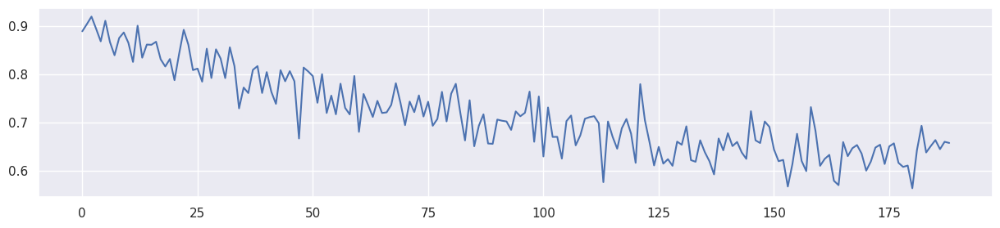

Mean F1 for all data: 0.7170752811002495
[Lambda: 0.200000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.833470]
[Lambda: 0.200000] [Epoch 200/4000] [D_F loss: 1.385707] [G loss: 0.819187]
[Lambda: 0.200000] [Epoch 400/4000] [D_F loss: 1.379258] [G loss: 0.794397]
[Lambda: 0.200000] [Epoch 600/4000] [D_F loss: 1.366871] [G loss: 0.767057]
[Lambda: 0.200000] [Epoch 800/4000] [D_F loss: 1.356213] [G loss: 0.738834]
[Lambda: 0.200000] [Epoch 1000/4000] [D_F loss: 1.352614] [G loss: 0.710249]
[Lambda: 0.200000] [Epoch 1200/4000] [D_F loss: 1.354325] [G loss: 0.681624]
[Lambda: 0.200000] [Epoch 1400/4000] [D_F loss: 1.358530] [G loss: 0.652855]
[Lambda: 0.200000] [Epoch 1600/4000] [D_F loss: 1.363280] [G loss: 0.624683]
[Lambda: 0.200000] [Epoch 1800/4000] [D_F loss: 1.367942] [G loss: 0.597248]
[Lambda: 0.200000] [Epoch 2000/4000] [D_F loss: 1.372622] [G loss: 0.572237]
[Lambda: 0.200000] [Epoch 2200/4000] [D_F loss: 1.376530] [G loss: 0.550379]
[Lambda: 0.200000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 535.77it/s]


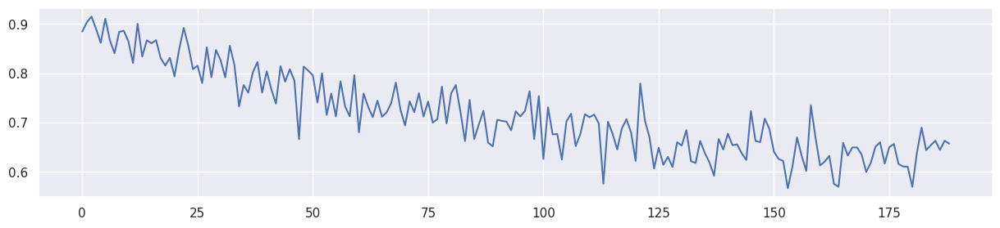

Mean F1 for all data: 0.7177536471118247
[Lambda: 0.300000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.902577]
[Lambda: 0.300000] [Epoch 200/4000] [D_F loss: 1.385694] [G loss: 0.889952]
[Lambda: 0.300000] [Epoch 400/4000] [D_F loss: 1.378446] [G loss: 0.867016]
[Lambda: 0.300000] [Epoch 600/4000] [D_F loss: 1.362389] [G loss: 0.841007]
[Lambda: 0.300000] [Epoch 800/4000] [D_F loss: 1.346843] [G loss: 0.814998]
[Lambda: 0.300000] [Epoch 1000/4000] [D_F loss: 1.340970] [G loss: 0.789855]
[Lambda: 0.300000] [Epoch 1200/4000] [D_F loss: 1.342740] [G loss: 0.765414]
[Lambda: 0.300000] [Epoch 1400/4000] [D_F loss: 1.347966] [G loss: 0.741052]
[Lambda: 0.300000] [Epoch 1600/4000] [D_F loss: 1.354571] [G loss: 0.717223]
[Lambda: 0.300000] [Epoch 1800/4000] [D_F loss: 1.361213] [G loss: 0.694208]
[Lambda: 0.300000] [Epoch 2000/4000] [D_F loss: 1.367933] [G loss: 0.672915]
[Lambda: 0.300000] [Epoch 2200/4000] [D_F loss: 1.373050] [G loss: 0.654382]
[Lambda: 0.300000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 535.11it/s]


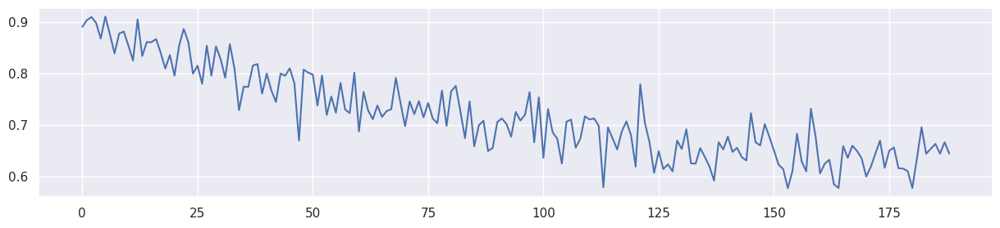

Mean F1 for all data: 0.7185592664472374
[Lambda: 0.400000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 0.971684]
[Lambda: 0.400000] [Epoch 200/4000] [D_F loss: 1.385651] [G loss: 0.960716]
[Lambda: 0.400000] [Epoch 400/4000] [D_F loss: 1.377058] [G loss: 0.939390]
[Lambda: 0.400000] [Epoch 600/4000] [D_F loss: 1.354234] [G loss: 0.913654]
[Lambda: 0.400000] [Epoch 800/4000] [D_F loss: 1.329526] [G loss: 0.888927]
[Lambda: 0.400000] [Epoch 1000/4000] [D_F loss: 1.318447] [G loss: 0.867104]
[Lambda: 0.400000] [Epoch 1200/4000] [D_F loss: 1.319638] [G loss: 0.847040]
[Lambda: 0.400000] [Epoch 1400/4000] [D_F loss: 1.326624] [G loss: 0.827322]
[Lambda: 0.400000] [Epoch 1600/4000] [D_F loss: 1.335307] [G loss: 0.808169]
[Lambda: 0.400000] [Epoch 1800/4000] [D_F loss: 1.345256] [G loss: 0.790188]
[Lambda: 0.400000] [Epoch 2000/4000] [D_F loss: 1.355976] [G loss: 0.773465]
[Lambda: 0.400000] [Epoch 2200/4000] [D_F loss: 1.364480] [G loss: 0.758701]
[Lambda: 0.400000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 533.33it/s]


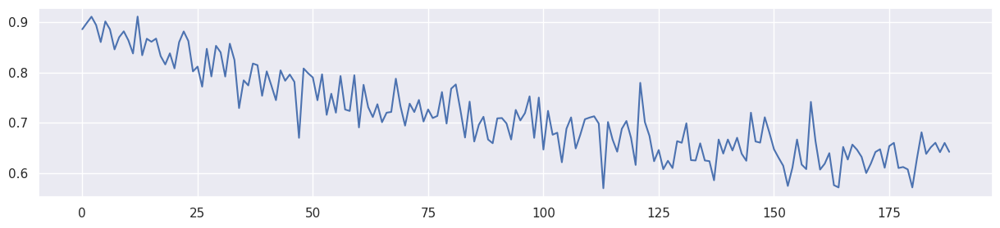

Mean F1 for all data: 0.7168101027214345
[Lambda: 0.500000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.040792]
[Lambda: 0.500000] [Epoch 200/4000] [D_F loss: 1.385086] [G loss: 1.031416]
[Lambda: 0.500000] [Epoch 400/4000] [D_F loss: 1.365266] [G loss: 1.010256]
[Lambda: 0.500000] [Epoch 600/4000] [D_F loss: 1.314786] [G loss: 0.982919]
[Lambda: 0.500000] [Epoch 800/4000] [D_F loss: 1.272525] [G loss: 0.960884]
[Lambda: 0.500000] [Epoch 1000/4000] [D_F loss: 1.258222] [G loss: 0.943746]
[Lambda: 0.500000] [Epoch 1200/4000] [D_F loss: 1.258625] [G loss: 0.928427]
[Lambda: 0.500000] [Epoch 1400/4000] [D_F loss: 1.265445] [G loss: 0.913316]
[Lambda: 0.500000] [Epoch 1600/4000] [D_F loss: 1.274768] [G loss: 0.899293]
[Lambda: 0.500000] [Epoch 1800/4000] [D_F loss: 1.288391] [G loss: 0.886958]
[Lambda: 0.500000] [Epoch 2000/4000] [D_F loss: 1.305203] [G loss: 0.875826]
[Lambda: 0.500000] [Epoch 2200/4000] [D_F loss: 1.322695] [G loss: 0.865882]
[Lambda: 0.500000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 533.16it/s]


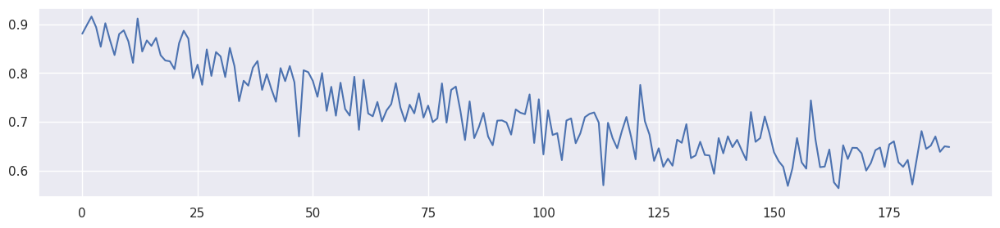

Mean F1 for all data: 0.7167127527365508
[Lambda: 0.600000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.109899]
[Lambda: 0.600000] [Epoch 200/4000] [D_F loss: 1.384624] [G loss: 1.101906]
[Lambda: 0.600000] [Epoch 400/4000] [D_F loss: 1.359386] [G loss: 1.078351]
[Lambda: 0.600000] [Epoch 600/4000] [D_F loss: 1.286432] [G loss: 1.040596]
[Lambda: 0.600000] [Epoch 800/4000] [D_F loss: 1.209705] [G loss: 1.013610]
[Lambda: 0.600000] [Epoch 1000/4000] [D_F loss: 1.178470] [G loss: 1.000641]
[Lambda: 0.600000] [Epoch 1200/4000] [D_F loss: 1.171645] [G loss: 0.989958]
[Lambda: 0.600000] [Epoch 1400/4000] [D_F loss: 1.170897] [G loss: 0.979577]
[Lambda: 0.600000] [Epoch 1600/4000] [D_F loss: 1.171883] [G loss: 0.970391]
[Lambda: 0.600000] [Epoch 1800/4000] [D_F loss: 1.174340] [G loss: 0.963218]
[Lambda: 0.600000] [Epoch 2000/4000] [D_F loss: 1.180550] [G loss: 0.957646]
[Lambda: 0.600000] [Epoch 2200/4000] [D_F loss: 1.187490] [G loss: 0.953297]
[Lambda: 0.600000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 528.22it/s]


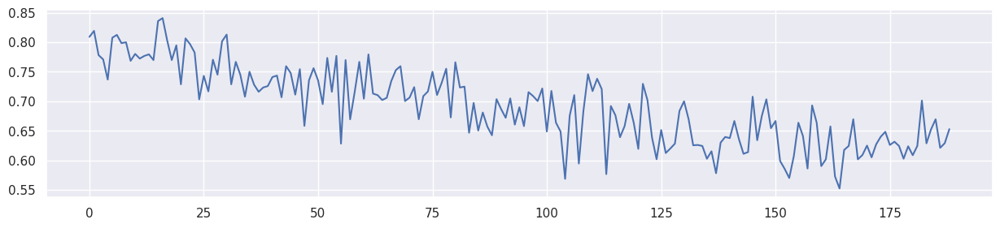

Mean F1 for all data: 0.6920651744572759
[Lambda: 0.700000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.179006]
[Lambda: 0.700000] [Epoch 200/4000] [D_F loss: 1.384364] [G loss: 1.172318]
[Lambda: 0.700000] [Epoch 400/4000] [D_F loss: 1.352243] [G loss: 1.144222]
[Lambda: 0.700000] [Epoch 600/4000] [D_F loss: 1.258362] [G loss: 1.089530]
[Lambda: 0.700000] [Epoch 800/4000] [D_F loss: 1.159982] [G loss: 1.048332]
[Lambda: 0.700000] [Epoch 1000/4000] [D_F loss: 1.106515] [G loss: 1.033059]
[Lambda: 0.700000] [Epoch 1200/4000] [D_F loss: 1.087655] [G loss: 1.025751]
[Lambda: 0.700000] [Epoch 1400/4000] [D_F loss: 1.081860] [G loss: 1.018616]
[Lambda: 0.700000] [Epoch 1600/4000] [D_F loss: 1.079074] [G loss: 1.012758]
[Lambda: 0.700000] [Epoch 1800/4000] [D_F loss: 1.078933] [G loss: 1.008386]
[Lambda: 0.700000] [Epoch 2000/4000] [D_F loss: 1.079953] [G loss: 1.005193]
[Lambda: 0.700000] [Epoch 2200/4000] [D_F loss: 1.082166] [G loss: 1.002946]
[Lambda: 0.700000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 531.56it/s]


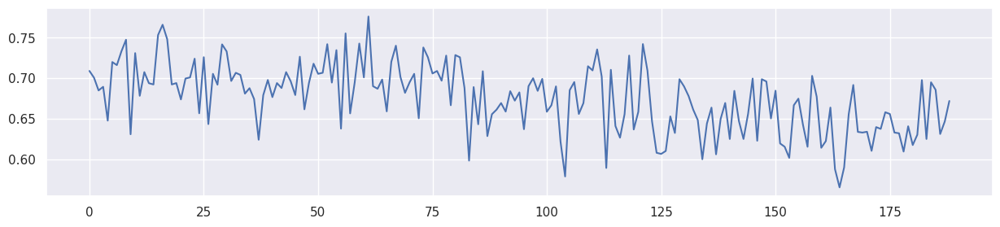

Mean F1 for all data: 0.6753591073839086
[Lambda: 0.800000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.248114]
[Lambda: 0.800000] [Epoch 200/4000] [D_F loss: 1.383965] [G loss: 1.242565]
[Lambda: 0.800000] [Epoch 400/4000] [D_F loss: 1.342603] [G loss: 1.206555]
[Lambda: 0.800000] [Epoch 600/4000] [D_F loss: 1.228619] [G loss: 1.127630]
[Lambda: 0.800000] [Epoch 800/4000] [D_F loss: 1.110432] [G loss: 1.062805]
[Lambda: 0.800000] [Epoch 1000/4000] [D_F loss: 1.041892] [G loss: 1.037911]
[Lambda: 0.800000] [Epoch 1200/4000] [D_F loss: 1.013064] [G loss: 1.031554]
[Lambda: 0.800000] [Epoch 1400/4000] [D_F loss: 1.004443] [G loss: 1.028972]
[Lambda: 0.800000] [Epoch 1600/4000] [D_F loss: 1.003139] [G loss: 1.026490]
[Lambda: 0.800000] [Epoch 1800/4000] [D_F loss: 1.004279] [G loss: 1.024115]
[Lambda: 0.800000] [Epoch 2000/4000] [D_F loss: 1.005393] [G loss: 1.021932]
[Lambda: 0.800000] [Epoch 2200/4000] [D_F loss: 1.006182] [G loss: 1.019991]
[Lambda: 0.800000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 533.49it/s]


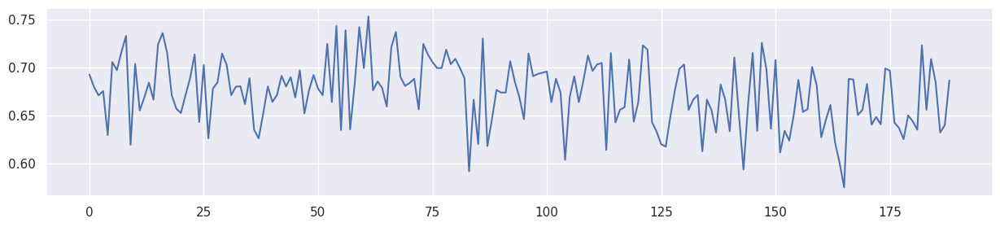

Mean F1 for all data: 0.6738530529835562
[Lambda: 0.900000] [Epoch 0/4000] [D_F loss: 1.386329] [G loss: 1.317221]
[Lambda: 0.900000] [Epoch 200/4000] [D_F loss: 1.383212] [G loss: 1.312479]
[Lambda: 0.900000] [Epoch 400/4000] [D_F loss: 1.329523] [G loss: 1.263401]
[Lambda: 0.900000] [Epoch 600/4000] [D_F loss: 1.193671] [G loss: 1.150553]
[Lambda: 0.900000] [Epoch 800/4000] [D_F loss: 1.067594] [G loss: 1.057277]
[Lambda: 0.900000] [Epoch 1000/4000] [D_F loss: 0.996381] [G loss: 1.015475]
[Lambda: 0.900000] [Epoch 1200/4000] [D_F loss: 0.963312] [G loss: 1.003049]
[Lambda: 0.900000] [Epoch 1400/4000] [D_F loss: 0.951129] [G loss: 1.000448]
[Lambda: 0.900000] [Epoch 1600/4000] [D_F loss: 0.947176] [G loss: 0.999522]
[Lambda: 0.900000] [Epoch 1800/4000] [D_F loss: 0.946042] [G loss: 0.998793]
[Lambda: 0.900000] [Epoch 2000/4000] [D_F loss: 0.945847] [G loss: 0.998031]
[Lambda: 0.900000] [Epoch 2200/4000] [D_F loss: 0.945854] [G loss: 0.997296]
[Lambda: 0.900000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 529.02it/s]


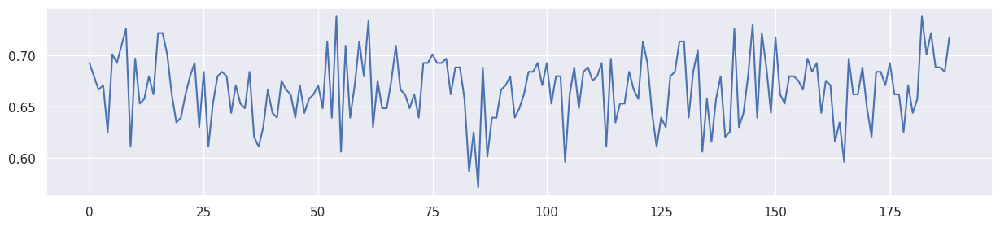

Mean F1 for all data: 0.6673744009113316


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,2.622620e-01
1,Feature 6,0.875000,0.889908,0.299320,0.068966,2.304670e-01
2,Feature 4,0.765714,0.871560,0.853043,0.904977,7.959555e-02
0,0.0,0.875000,0.888889,0.716996,0.657407,2.616669e-01
1,0.1,0.875000,0.888889,0.717075,0.657407,2.616669e-01
2,0.2,0.881356,0.884793,0.717754,0.657407,2.598196e-01
3,0.3,0.868571,0.890909,0.718559,0.644860,2.455515e-01
4,0.4,0.865169,0.885845,0.716810,0.642202,2.771431e-01
5,0.5,0.876404,0.880734,0.716713,0.648402,2.707110e-01
6,0.6,0.744589,0.809160,0.692065,0.652893,2.988178e-01


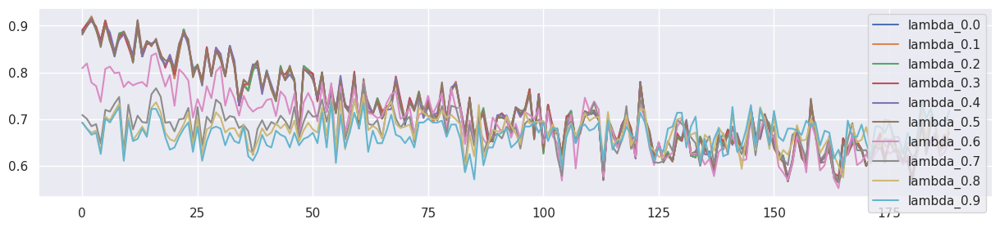

In [32]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] # Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.00, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30] # Lambda value for the fairness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model2(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result2_df = pd.DataFrame(result_table2)

result3_df = pd.DataFrame(result_table3)


pd.concat([result3_df, result2_df])


[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297298]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279805]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265790]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 523.36it/s]


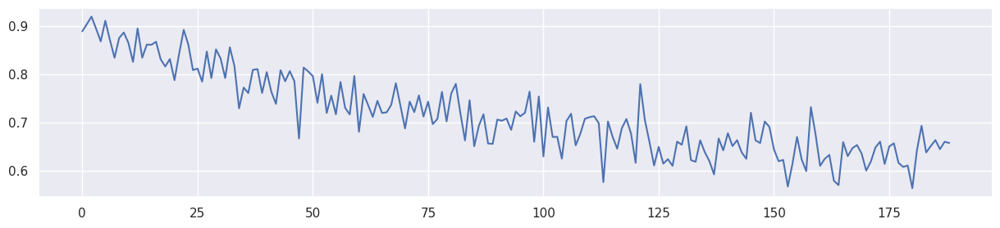

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 0.832770]
[Lambda: 0.100000] [Epoch 200/4000] [D_F loss: 0.833585] [G loss: 0.693393]
[Lambda: 0.100000] [Epoch 400/4000] [D_F loss: 0.213729] [G loss: 0.605726]
[Lambda: 0.100000] [Epoch 600/4000] [D_F loss: 0.195657] [G loss: 0.575629]
[Lambda: 0.100000] [Epoch 800/4000] [D_F loss: 0.201150] [G loss: 0.545888]
[Lambda: 0.100000] [Epoch 1000/4000] [D_F loss: 0.207711] [G loss: 0.514309]
[Lambda: 0.100000] [Epoch 1200/4000] [D_F loss: 0.215046] [G loss: 0.481998]
[Lambda: 0.100000] [Epoch 1400/4000] [D_F loss: 0.222711] [G loss: 0.449595]
[Lambda: 0.100000] [Epoch 1600/4000] [D_F loss: 0.230764] [G loss: 0.417634]
[Lambda: 0.100000] [Epoch 1800/4000] [D_F loss: 0.238594] [G loss: 0.386567]
[Lambda: 0.100000] [Epoch 2000/4000] [D_F loss: 0.245515] [G loss: 0.357748]
[Lambda: 0.100000] [Epoch 2200/4000] [D_F loss: 0.251275] [G loss: 0.332950]
[Lambda: 0.100000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 540.18it/s]


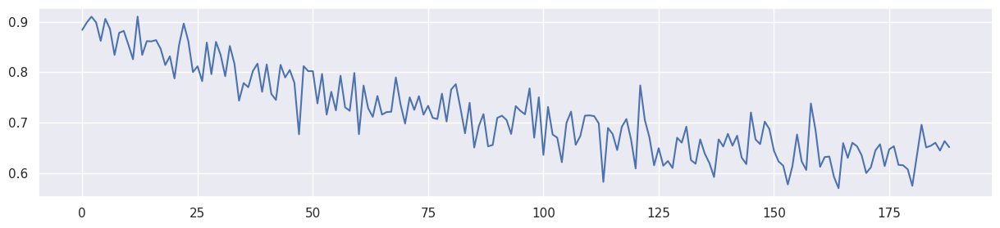

Mean F1 for all data: 0.7185566609919494
[Lambda: 0.200000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 0.970285]
[Lambda: 0.200000] [Epoch 200/4000] [D_F loss: 0.833493] [G loss: 0.709108]
[Lambda: 0.200000] [Epoch 400/4000] [D_F loss: 0.213596] [G loss: 0.562590]
[Lambda: 0.200000] [Epoch 600/4000] [D_F loss: 0.195530] [G loss: 0.533671]
[Lambda: 0.200000] [Epoch 800/4000] [D_F loss: 0.200930] [G loss: 0.507758]
[Lambda: 0.200000] [Epoch 1000/4000] [D_F loss: 0.207242] [G loss: 0.480435]
[Lambda: 0.200000] [Epoch 1200/4000] [D_F loss: 0.214180] [G loss: 0.452573]
[Lambda: 0.200000] [Epoch 1400/4000] [D_F loss: 0.221563] [G loss: 0.424577]
[Lambda: 0.200000] [Epoch 1600/4000] [D_F loss: 0.229084] [G loss: 0.397316]
[Lambda: 0.200000] [Epoch 1800/4000] [D_F loss: 0.236730] [G loss: 0.370483]
[Lambda: 0.200000] [Epoch 2000/4000] [D_F loss: 0.243735] [G loss: 0.345590]
[Lambda: 0.200000] [Epoch 2200/4000] [D_F loss: 0.249563] [G loss: 0.323893]
[Lambda: 0.200000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 372.69it/s]


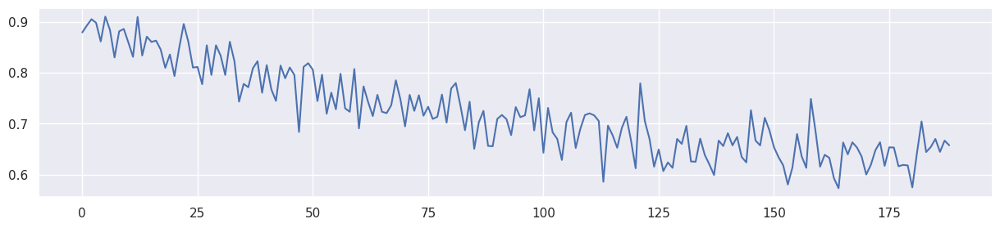

Mean F1 for all data: 0.7216342598590664
[Lambda: 0.300000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.107801]
[Lambda: 0.300000] [Epoch 200/4000] [D_F loss: 0.833361] [G loss: 0.724797]
[Lambda: 0.300000] [Epoch 400/4000] [D_F loss: 0.213414] [G loss: 0.519434]
[Lambda: 0.300000] [Epoch 600/4000] [D_F loss: 0.195383] [G loss: 0.491674]
[Lambda: 0.300000] [Epoch 800/4000] [D_F loss: 0.200621] [G loss: 0.469555]
[Lambda: 0.300000] [Epoch 1000/4000] [D_F loss: 0.206596] [G loss: 0.446452]
[Lambda: 0.300000] [Epoch 1200/4000] [D_F loss: 0.213078] [G loss: 0.422978]
[Lambda: 0.300000] [Epoch 1400/4000] [D_F loss: 0.219985] [G loss: 0.399436]
[Lambda: 0.300000] [Epoch 1600/4000] [D_F loss: 0.226841] [G loss: 0.376687]
[Lambda: 0.300000] [Epoch 1800/4000] [D_F loss: 0.234318] [G loss: 0.354236]
[Lambda: 0.300000] [Epoch 2000/4000] [D_F loss: 0.241239] [G loss: 0.333451]
[Lambda: 0.300000] [Epoch 2200/4000] [D_F loss: 0.247466] [G loss: 0.314807]
[Lambda: 0.300000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 522.85it/s]


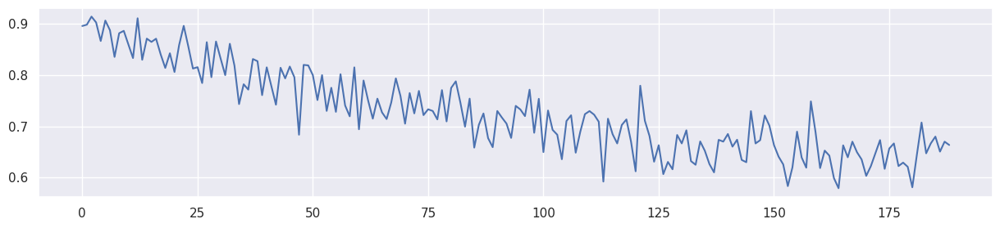

Mean F1 for all data: 0.7269675778448235
[Lambda: 0.400000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.245316]
[Lambda: 0.400000] [Epoch 200/4000] [D_F loss: 0.833172] [G loss: 0.740447]
[Lambda: 0.400000] [Epoch 400/4000] [D_F loss: 0.213155] [G loss: 0.476251]
[Lambda: 0.400000] [Epoch 600/4000] [D_F loss: 0.195186] [G loss: 0.449649]
[Lambda: 0.400000] [Epoch 800/4000] [D_F loss: 0.200202] [G loss: 0.431314]
[Lambda: 0.400000] [Epoch 1000/4000] [D_F loss: 0.205708] [G loss: 0.412349]
[Lambda: 0.400000] [Epoch 1200/4000] [D_F loss: 0.211479] [G loss: 0.393117]
[Lambda: 0.400000] [Epoch 1400/4000] [D_F loss: 0.217769] [G loss: 0.374099]
[Lambda: 0.400000] [Epoch 1600/4000] [D_F loss: 0.224006] [G loss: 0.355630]
[Lambda: 0.400000] [Epoch 1800/4000] [D_F loss: 0.230661] [G loss: 0.337730]
[Lambda: 0.400000] [Epoch 2000/4000] [D_F loss: 0.237457] [G loss: 0.321210]
[Lambda: 0.400000] [Epoch 2200/4000] [D_F loss: 0.243866] [G loss: 0.305842]
[Lambda: 0.400000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 523.65it/s]


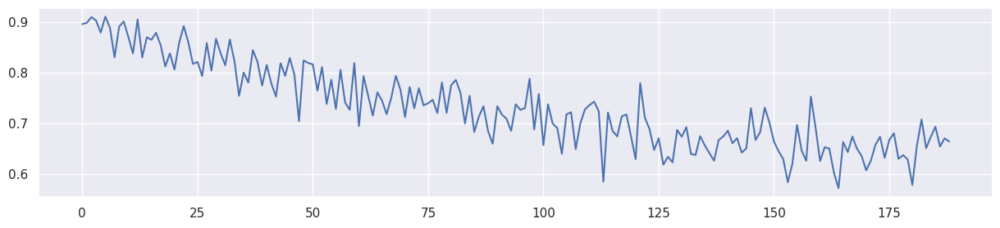

Mean F1 for all data: 0.7320298736591394
[Lambda: 0.500000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.382831]
[Lambda: 0.500000] [Epoch 200/4000] [D_F loss: 0.832889] [G loss: 0.756029]
[Lambda: 0.500000] [Epoch 400/4000] [D_F loss: 0.212725] [G loss: 0.433048]
[Lambda: 0.500000] [Epoch 600/4000] [D_F loss: 0.194867] [G loss: 0.407642]
[Lambda: 0.500000] [Epoch 800/4000] [D_F loss: 0.199480] [G loss: 0.393084]
[Lambda: 0.500000] [Epoch 1000/4000] [D_F loss: 0.204273] [G loss: 0.378121]
[Lambda: 0.500000] [Epoch 1200/4000] [D_F loss: 0.209030] [G loss: 0.363057]
[Lambda: 0.500000] [Epoch 1400/4000] [D_F loss: 0.214099] [G loss: 0.348410]
[Lambda: 0.500000] [Epoch 1600/4000] [D_F loss: 0.219668] [G loss: 0.334297]
[Lambda: 0.500000] [Epoch 1800/4000] [D_F loss: 0.225353] [G loss: 0.320795]
[Lambda: 0.500000] [Epoch 2000/4000] [D_F loss: 0.231430] [G loss: 0.308606]
[Lambda: 0.500000] [Epoch 2200/4000] [D_F loss: 0.237384] [G loss: 0.297326]
[Lambda: 0.500000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 530.00it/s]


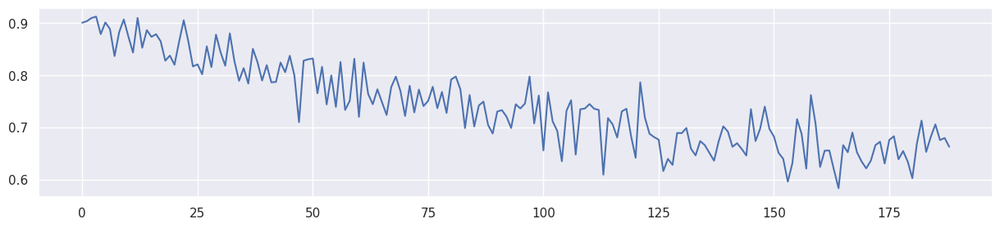

Mean F1 for all data: 0.7423196223512352
[Lambda: 0.600000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.520346]
[Lambda: 0.600000] [Epoch 200/4000] [D_F loss: 0.832396] [G loss: 0.771489]
[Lambda: 0.600000] [Epoch 400/4000] [D_F loss: 0.211923] [G loss: 0.389839]
[Lambda: 0.600000] [Epoch 600/4000] [D_F loss: 0.194212] [G loss: 0.365749]
[Lambda: 0.600000] [Epoch 800/4000] [D_F loss: 0.198079] [G loss: 0.354855]
[Lambda: 0.600000] [Epoch 1000/4000] [D_F loss: 0.201653] [G loss: 0.343617]
[Lambda: 0.600000] [Epoch 1200/4000] [D_F loss: 0.204925] [G loss: 0.332331]
[Lambda: 0.600000] [Epoch 1400/4000] [D_F loss: 0.208073] [G loss: 0.321580]
[Lambda: 0.600000] [Epoch 1600/4000] [D_F loss: 0.211207] [G loss: 0.311396]
[Lambda: 0.600000] [Epoch 1800/4000] [D_F loss: 0.214972] [G loss: 0.302308]
[Lambda: 0.600000] [Epoch 2000/4000] [D_F loss: 0.219893] [G loss: 0.294440]
[Lambda: 0.600000] [Epoch 2200/4000] [D_F loss: 0.225597] [G loss: 0.287040]
[Lambda: 0.600000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 518.89it/s]


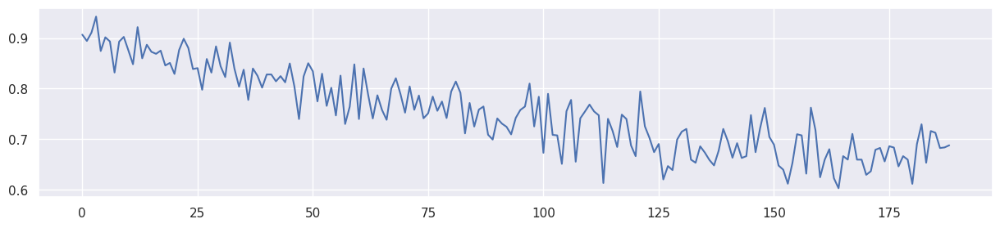

Mean F1 for all data: 0.7527013346805801
[Lambda: 0.700000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.657862]
[Lambda: 0.700000] [Epoch 200/4000] [D_F loss: 0.831427] [G loss: 0.786655]
[Lambda: 0.700000] [Epoch 400/4000] [D_F loss: 0.210112] [G loss: 0.346536]
[Lambda: 0.700000] [Epoch 600/4000] [D_F loss: 0.192568] [G loss: 0.324029]
[Lambda: 0.700000] [Epoch 800/4000] [D_F loss: 0.194762] [G loss: 0.316384]
[Lambda: 0.700000] [Epoch 1000/4000] [D_F loss: 0.195838] [G loss: 0.308375]
[Lambda: 0.700000] [Epoch 1200/4000] [D_F loss: 0.196137] [G loss: 0.300295]
[Lambda: 0.700000] [Epoch 1400/4000] [D_F loss: 0.195451] [G loss: 0.292440]
[Lambda: 0.700000] [Epoch 1600/4000] [D_F loss: 0.194416] [G loss: 0.285362]
[Lambda: 0.700000] [Epoch 1800/4000] [D_F loss: 0.194357] [G loss: 0.279568]
[Lambda: 0.700000] [Epoch 2000/4000] [D_F loss: 0.195843] [G loss: 0.275178]
[Lambda: 0.700000] [Epoch 2200/4000] [D_F loss: 0.198861] [G loss: 0.271833]
[Lambda: 0.700000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 510.39it/s]


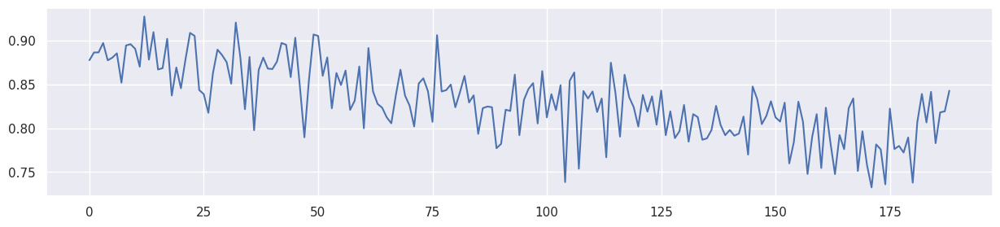

Mean F1 for all data: 0.8317323691735345
[Lambda: 0.800000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.795377]
[Lambda: 0.800000] [Epoch 200/4000] [D_F loss: 0.829699] [G loss: 0.801038]
[Lambda: 0.800000] [Epoch 400/4000] [D_F loss: 0.205401] [G loss: 0.301996]
[Lambda: 0.800000] [Epoch 600/4000] [D_F loss: 0.186129] [G loss: 0.281527]
[Lambda: 0.800000] [Epoch 800/4000] [D_F loss: 0.185560] [G loss: 0.276170]
[Lambda: 0.800000] [Epoch 1000/4000] [D_F loss: 0.180609] [G loss: 0.269275]
[Lambda: 0.800000] [Epoch 1200/4000] [D_F loss: 0.168396] [G loss: 0.259846]
[Lambda: 0.800000] [Epoch 1400/4000] [D_F loss: 0.153192] [G loss: 0.250935]
[Lambda: 0.800000] [Epoch 1600/4000] [D_F loss: 0.138238] [G loss: 0.244367]
[Lambda: 0.800000] [Epoch 1800/4000] [D_F loss: 0.126286] [G loss: 0.240322]
[Lambda: 0.800000] [Epoch 2000/4000] [D_F loss: 0.118502] [G loss: 0.238091]
[Lambda: 0.800000] [Epoch 2200/4000] [D_F loss: 0.113226] [G loss: 0.236786]
[Lambda: 0.800000] [Epoch 2400/4000] [D_F 

100%|██████████| 189/189 [00:00<00:00, 523.25it/s]


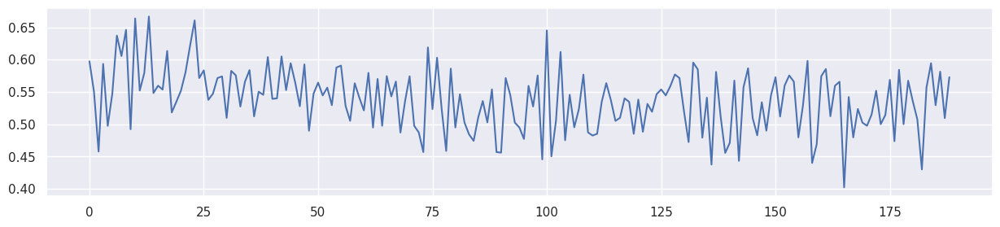

Mean F1 for all data: 0.5379492848216061
[Lambda: 0.900000] [Epoch 0/4000] [D_F loss: 2.070407] [G loss: 1.932892]
[Lambda: 0.900000] [Epoch 200/4000] [D_F loss: 0.826662] [G loss: 0.813539]
[Lambda: 0.900000] [Epoch 400/4000] [D_F loss: 0.199632] [G loss: 0.251200]
[Lambda: 0.900000] [Epoch 600/4000] [D_F loss: 0.174581] [G loss: 0.230232]
[Lambda: 0.900000] [Epoch 800/4000] [D_F loss: 0.165154] [G loss: 0.224741]
[Lambda: 0.900000] [Epoch 1000/4000] [D_F loss: 0.148569] [G loss: 0.214766]
[Lambda: 0.900000] [Epoch 1200/4000] [D_F loss: 0.124850] [G loss: 0.198967]
[Lambda: 0.900000] [Epoch 1400/4000] [D_F loss: 0.095280] [G loss: 0.179875]
[Lambda: 0.900000] [Epoch 1600/4000] [D_F loss: 0.062169] [G loss: 0.161178]
[Lambda: 0.900000] [Epoch 1800/4000] [D_F loss: 0.031256] [G loss: 0.146792]
[Lambda: 0.900000] [Epoch 2000/4000] [D_F loss: 0.006739] [G loss: 0.137536]
[Lambda: 0.900000] [Epoch 2200/4000] [D_F loss: -0.010526] [G loss: 0.131840]
[Lambda: 0.900000] [Epoch 2400/4000] [D_F

100%|██████████| 189/189 [00:00<00:00, 534.69it/s]


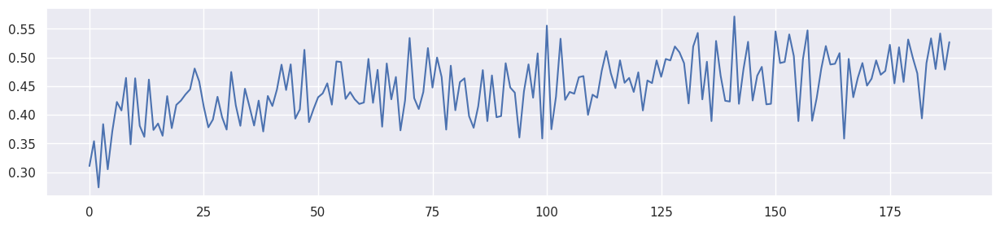

Mean F1 for all data: 0.4473343509454414


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


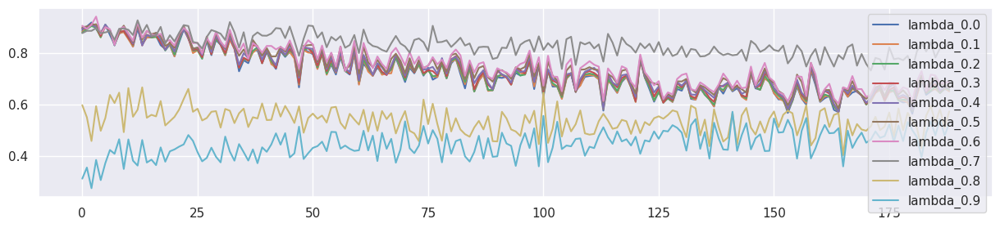

In [33]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] # Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.00, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30] # Lambda value for the fairness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model22(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result2_df = pd.DataFrame(result_table2)

result3_df = pd.DataFrame(result_table3)


pd.concat([result3_df, result2_df])


## MINE를 통해 I(y^,z) 측정

(40000, 5)
(40000,)


100%|██████████| 300/300 [00:00<00:00, 509.43it/s]


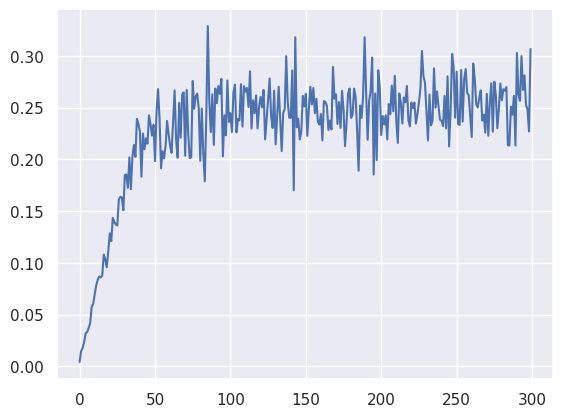

In [34]:
from tqdm import tqdm

H=20
n_epoch = 300
minibatch = 1000

x1 = X[0:1800][['z0']].values
y1 = y_train.data.numpy()

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, H)
        self.fc2 = nn.Linear(1, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2  

model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

print(x.shape)
print(y.shape)
plot_loss = []
for epoch in tqdm(range(n_epoch)):
    s = np.random.choice(x1.shape[0],minibatch)
    x_sample = Variable(torch.from_numpy(x1[s].reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
    y_sample = Variable(torch.from_numpy(y1[s]).type(torch.FloatTensor), requires_grad = True)
    y_shuffle = Variable(torch.from_numpy(np.random.permutation(y1[s])).type(torch.FloatTensor), requires_grad = True)    
    ret = torch.mean(model(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(model(x_sample, y_shuffle))))
    loss = - ret  # maximize
    model.zero_grad()
    loss.backward()
    optimizer.step()
    plot_loss.append(ret.data.numpy())


    #back_loss = loss

print('')

plot_loss = np.asarray(plot_loss)

plt.plot(plot_loss)

In [35]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model3(train_tensors, test_tensors, train_opt, lambda_f, seed):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    mine = Net()
    optimizer = torch.optim.Adam(mine.parameters(), lr=0.01)
    minibatch = 1000

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  MINE
        # -------------------------------
        s = np.random.choice(XS_train.shape[0],minibatch)
        #y1 = gen_y[s].data.numpy()
        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = gen_y[s] #Variable(torch.from_numpy(y1).type(torch.FloatTensor), requires_grad = True)
        y_shuffle = gen_y[np.random.permutation(s)] # # #Variable(torch.from_numpy(np.random.permutation(y1)).type(torch.FloatTensor), requires_grad = True)    
        ret = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = torch.abs(ret)  # maximize

        #mi_loss = mse_loss(torch.mean(mine(x_sample, y_sample)), torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle)))))
        #mi_loss = mse_loss(mine(x_sample, y_sample), mine(x_sample, y_shuffle))

        mine.zero_grad()
        #loss.backward()
        mi_losses.append(mi_loss)
        #optimizer_D_F.step()
        '''
        if epoch > int(n_epochs* lambda_f):
            optimizer_G.zero_grad()
            loss = (1-lambda_f) * g_loss * 0.1  + lambda_f * mi_loss 
            #loss = 0 * g_loss + lambda_f * mi_loss 
            loss.backward()
            optimizer_G.step()

        else:
            mi_loss.backward()
        '''
        optimizer_G.zero_grad()
        loss = (1-lambda_f) * g_loss   + lambda_f * (mi_loss * 1000) 
        #loss = 0 * g_loss + lambda_f * mi_loss 
        loss.backward()
        optimizer_G.step()
        
        optimizer.step()            


        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297298]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279805]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265790]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 535.56it/s]


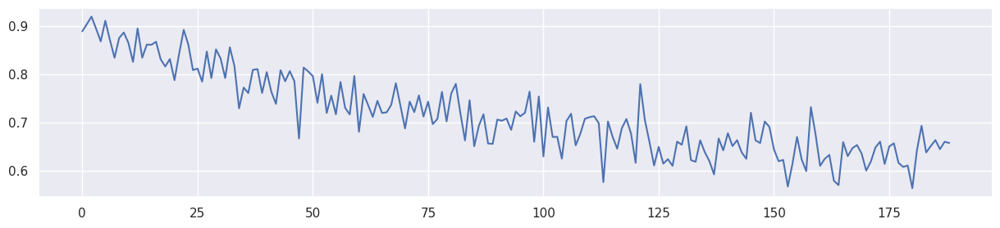

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 0.001382] [G loss: 0.695255]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 0.000025] [G loss: 0.690548]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 0.000011] [G loss: 0.682612]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 0.000043] [G loss: 0.664013]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 0.000011] [G loss: 0.640518]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 0.000010] [G loss: 0.613413]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 0.000004] [G loss: 0.582708]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 0.000004] [G loss: 0.548838]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 0.000054] [G loss: 0.514040]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 0.000000] [G loss: 0.478783]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 0.000001] [G loss: 0.443058]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 0.000000] [G loss: 0.408355]
[Lambda: 0.100000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 535.07it/s]


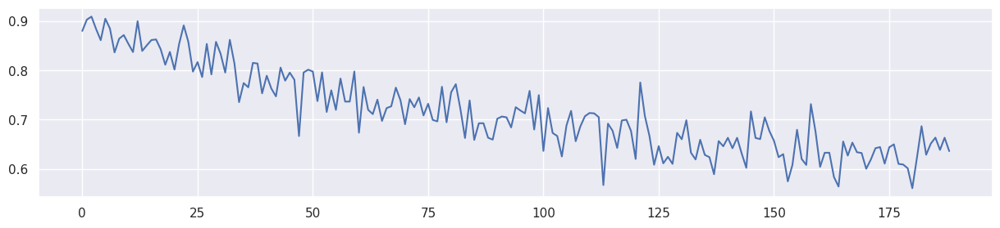

Mean F1 for all data: 0.7157684989720534
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 0.001319] [G loss: 0.695255]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 0.000022] [G loss: 0.693582]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 0.000010] [G loss: 0.690076]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 0.000004] [G loss: 0.685974]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 0.000005] [G loss: 0.676657]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 0.000028] [G loss: 0.662190]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 0.000010] [G loss: 0.643870]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 0.000005] [G loss: 0.622106]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 0.000011] [G loss: 0.595718]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 0.000001] [G loss: 0.565188]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 0.000040] [G loss: 0.533309]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 0.000007] [G loss: 0.500591]
[Lambda: 0.200000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 532.55it/s]


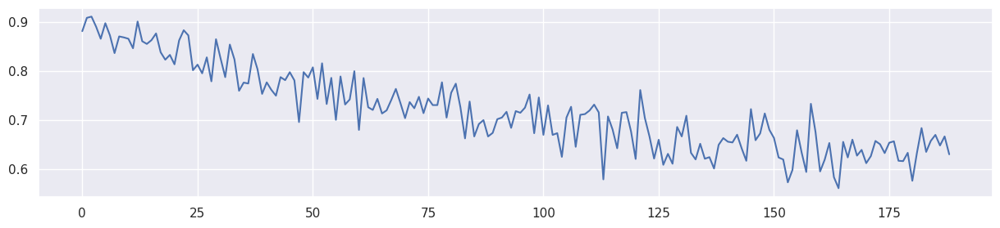

Mean F1 for all data: 0.7202311094646826
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 0.001269] [G loss: 0.695255]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 0.000168] [G loss: 0.694156]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 0.000013] [G loss: 0.692771]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 0.000011] [G loss: 0.689500]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 0.000005] [G loss: 0.685449]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 0.000000] [G loss: 0.677952]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 0.000001] [G loss: 0.667007]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 0.000054] [G loss: 0.652202]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 0.000006] [G loss: 0.636789]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 0.000016] [G loss: 0.619291]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 0.000099] [G loss: 0.598844]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 0.000017] [G loss: 0.574671]
[Lambda: 0.300000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 529.96it/s]


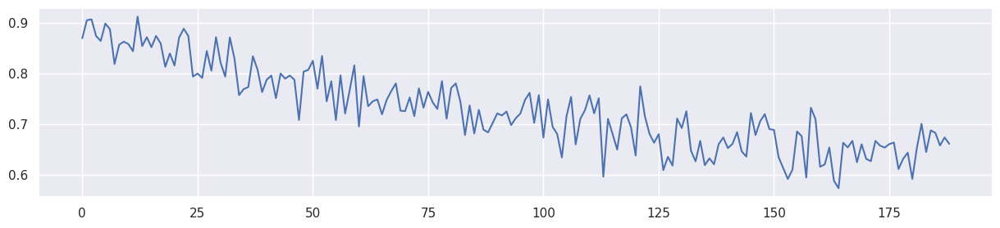

Mean F1 for all data: 0.7299554249496744
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 0.001424] [G loss: 0.695255]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 0.000007] [G loss: 0.694696]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 0.000013] [G loss: 0.693841]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 0.000004] [G loss: 0.691595]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 0.000001] [G loss: 0.688563]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 0.000004] [G loss: 0.683831]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 0.000007] [G loss: 0.676863]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 0.000018] [G loss: 0.670770]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 0.000008] [G loss: 0.663617]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 0.000014] [G loss: 0.658451]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 0.000006] [G loss: 0.651243]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 0.000001] [G loss: 0.641981]
[Lambda: 0.400000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 528.32it/s]


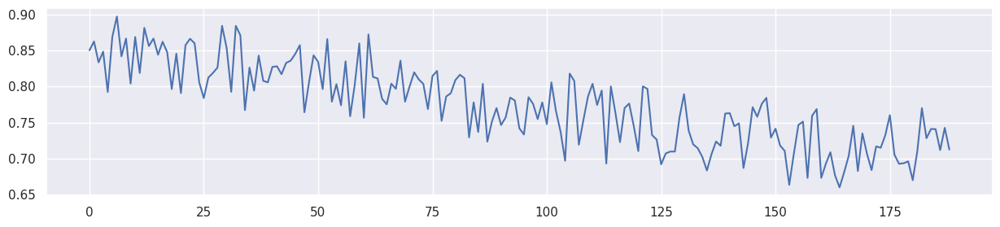

Mean F1 for all data: 0.7746091652660357
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 0.001455] [G loss: 0.695255]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 0.000035] [G loss: 0.694919]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 0.000035] [G loss: 0.694322]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 0.000016] [G loss: 0.693268]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 0.000004] [G loss: 0.691506]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 0.000004] [G loss: 0.690089]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 0.000001] [G loss: 0.686112]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 0.000035] [G loss: 0.678489]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 0.000002] [G loss: 0.675402]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 0.000000] [G loss: 0.670907]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 0.000026] [G loss: 0.664170]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 0.000003] [G loss: 0.655705]
[Lambda: 0.500000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 521.50it/s]


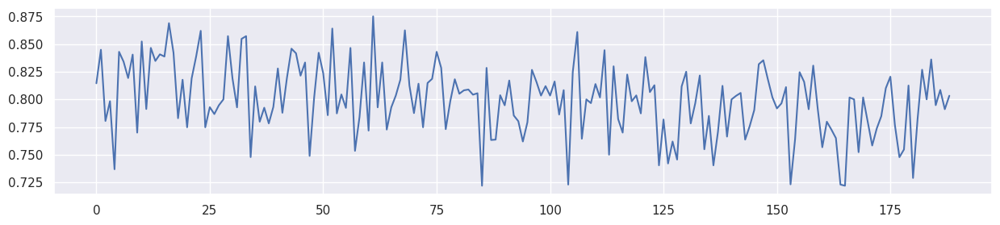

Mean F1 for all data: 0.7998722420991711
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 0.001429] [G loss: 0.695255]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 0.000016] [G loss: 0.695152]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 0.000103] [G loss: 0.694985]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 0.000060] [G loss: 0.694488]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 0.000007] [G loss: 0.693717]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 0.000002] [G loss: 0.692528]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 0.000004] [G loss: 0.690393]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 0.000003] [G loss: 0.688030]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 0.000006] [G loss: 0.685352]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 0.000005] [G loss: 0.680398]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 0.000007] [G loss: 0.674992]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 0.000035] [G loss: 0.670071]
[Lambda: 0.600000] [Epoch 2400/4000] [mi loss: 0.00003

100%|██████████| 189/189 [00:00<00:00, 529.59it/s]


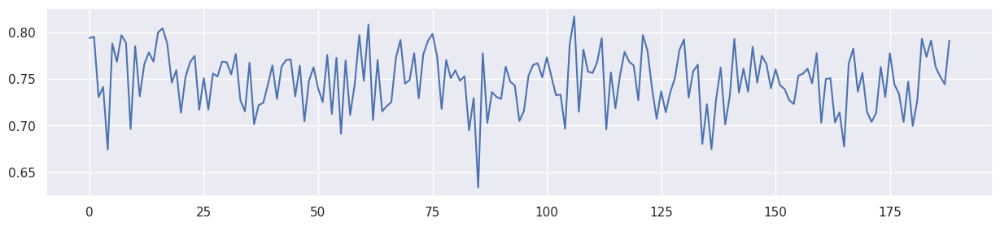

Mean F1 for all data: 0.7483360252593079
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 0.001458] [G loss: 0.695255]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 0.000008] [G loss: 0.695000]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 0.000011] [G loss: 0.694759]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 0.000009] [G loss: 0.694389]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 0.000001] [G loss: 0.693901]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 0.000006] [G loss: 0.693117]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 0.000009] [G loss: 0.691705]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 0.000003] [G loss: 0.689603]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 0.000006] [G loss: 0.686410]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 0.000008] [G loss: 0.682023]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 0.000015] [G loss: 0.679647]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 0.000010] [G loss: 0.678619]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 506.78it/s]


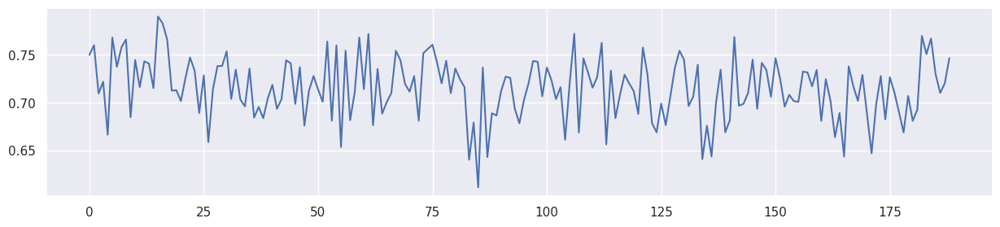

Mean F1 for all data: 0.7151921046766143
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 0.001429] [G loss: 0.695255]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 0.000001] [G loss: 0.695323]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 0.000025] [G loss: 0.694980]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 0.000001] [G loss: 0.694747]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 0.000003] [G loss: 0.694538]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 0.000004] [G loss: 0.694129]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 0.000002] [G loss: 0.693855]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 0.000009] [G loss: 0.693148]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 0.000003] [G loss: 0.692136]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 0.000004] [G loss: 0.690731]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 0.000005] [G loss: 0.688877]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 0.000006] [G loss: 0.686614]
[Lambda: 0.800000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 524.91it/s]


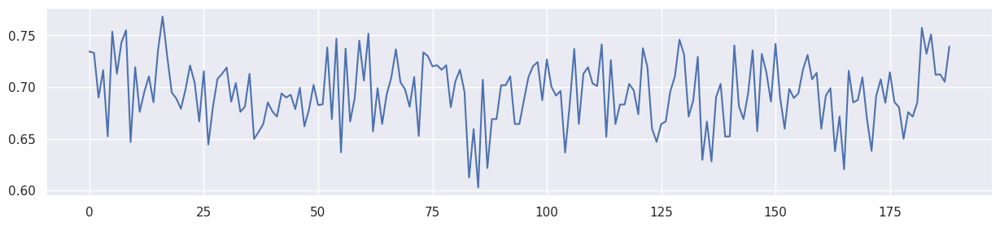

Mean F1 for all data: 0.6943734882363506
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 0.001462] [G loss: 0.695255]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 0.000073] [G loss: 0.695183]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 0.000016] [G loss: 0.695119]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 0.000028] [G loss: 0.694851]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 0.000001] [G loss: 0.694670]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 0.000014] [G loss: 0.694641]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 0.000007] [G loss: 0.694445]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 0.000054] [G loss: 0.694667]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 0.000021] [G loss: 0.695049]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 0.000005] [G loss: 0.694815]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 0.000002] [G loss: 0.694617]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 0.000005] [G loss: 0.694272]
[Lambda: 0.900000] [Epoch 2400/4000] [mi loss: 0.00000

100%|██████████| 189/189 [00:00<00:00, 509.90it/s]


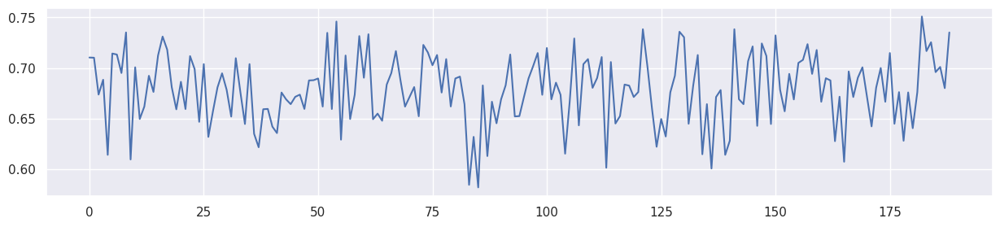

Mean F1 for all data: 0.6783840796811786


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


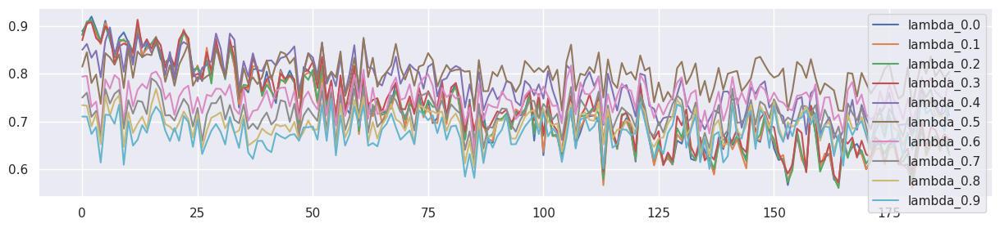

In [36]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]# Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.4,0.8]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model3(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



In [37]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model4(train_tensors, test_tensors, train_opt, lambda_f, seed,alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    mine = Net()
    optimizer = torch.optim.Adam(mine.parameters(), lr=0.01)
    minibatch = 1000

    for epoch in range(n_epochs):

        # -------------------
        #  Forwards Generator
        # -------------------
        gen_y = generator(XS_train).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  MINE
        # -------------------------------
        s = np.random.choice(XS_train.shape[0],minibatch)
        #y1 = gen_y[s].data.numpy()  # y^의 샘플
        #y2 = y_train[s].data.numpy().reshape(-1,1) # y의 샘플
        #print('y1',y1.shape)
        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = gen_y[s] #Variable(torch.from_numpy(y1).type(torch.FloatTensor), requires_grad = True)
        y_shuffle = gen_y[np.random.permutation(s)] # # #Variable(torch.from_numpy(np.random.permutation(y1)).type(torch.FloatTensor), requires_grad = True)    
        y2_sample = y_train[s].reshape(-1,1) #Variable(torch.from_numpy(y2).type(torch.FloatTensor), requires_grad = True)
        y2_shuffle = y_train[np.random.permutation(s)].reshape(-1,1) #Variable(torch.from_numpy(np.random.permutation(y2)).type(torch.FloatTensor), requires_grad = True)    

        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        ret2 = torch.mean(mine(x_sample, y2_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y2_shuffle))))

        # ret2(y의 샘플)는 maximize 하야 하고
        # ret1(y^의 샘플)는 0으로 minimize 해야 한다.!!! 
        mi_loss = - ret2 + torch.abs(ret1)

        #mi_loss = mse_loss(torch.mean(mine(x_sample, y_sample)), torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle)))))
        #mi_loss = mse_loss(mine(x_sample, y_sample), mine(x_sample, y_shuffle))

        mine.zero_grad()
        #loss.backward()
        mi_losses.append(-ret2)
        #optimizer_D_F.step()
        '''
        if epoch > int(n_epochs* lambda_f):
            optimizer_G.zero_grad()
            loss = (1-lambda_f) * g_loss * 0.1  + lambda_f * mi_loss 
            #loss = 0 * g_loss + lambda_f * mi_loss 
            loss.backward()
            optimizer_G.step()

        else:
            mi_loss.backward()
        '''
        optimizer_G.zero_grad()
        loss = (1-lambda_f) * g_loss  + lambda_f * mi_loss * alpha
        #loss = 0 * g_loss + lambda_f * mi_loss 
        loss.backward()
        optimizer_G.step()
        
        optimizer.step()            


        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model(generator, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator

[Lambda: 0.000000] [Epoch 0/4000] [G loss: 0.695255]
[Lambda: 0.000000] [Epoch 200/4000] [G loss: 0.677657]
[Lambda: 0.000000] [Epoch 400/4000] [G loss: 0.648799]
[Lambda: 0.000000] [Epoch 600/4000] [G loss: 0.617496]
[Lambda: 0.000000] [Epoch 800/4000] [G loss: 0.583921]
[Lambda: 0.000000] [Epoch 1000/4000] [G loss: 0.548074]
[Lambda: 0.000000] [Epoch 1200/4000] [G loss: 0.511307]
[Lambda: 0.000000] [Epoch 1400/4000] [G loss: 0.474272]
[Lambda: 0.000000] [Epoch 1600/4000] [G loss: 0.437780]
[Lambda: 0.000000] [Epoch 1800/4000] [G loss: 0.402507]
[Lambda: 0.000000] [Epoch 2000/4000] [G loss: 0.369966]
[Lambda: 0.000000] [Epoch 2200/4000] [G loss: 0.341809]
[Lambda: 0.000000] [Epoch 2400/4000] [G loss: 0.317957]
[Lambda: 0.000000] [Epoch 2600/4000] [G loss: 0.297298]
[Lambda: 0.000000] [Epoch 2800/4000] [G loss: 0.279805]
[Lambda: 0.000000] [Epoch 3000/4000] [G loss: 0.265790]
[Lambda: 0.000000] [Epoch 3200/4000] [G loss: 0.255069]
[Lambda: 0.000000] [Epoch 3400/4000] [G loss: 0.247021]

100%|██████████| 189/189 [00:00<00:00, 527.27it/s]


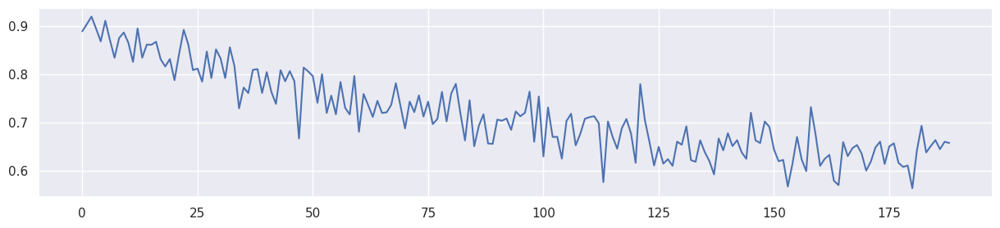

Mean F1 for all data: 0.7169960936024915
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: -0.000739] [G loss: 0.695255]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: -0.222515] [G loss: 0.678300]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: -0.237044] [G loss: 0.650690]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: -0.239886] [G loss: 0.619795]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: -0.264777] [G loss: 0.586380]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: -0.244470] [G loss: 0.551089]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: -0.281748] [G loss: 0.515163]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: -0.232901] [G loss: 0.479169]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: -0.226977] [G loss: 0.443696]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: -0.291030] [G loss: 0.409431]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: -0.260417] [G loss: 0.377442]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: -0.256080] [G loss: 0.349518]
[Lambda: 0.100000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 522.08it/s]


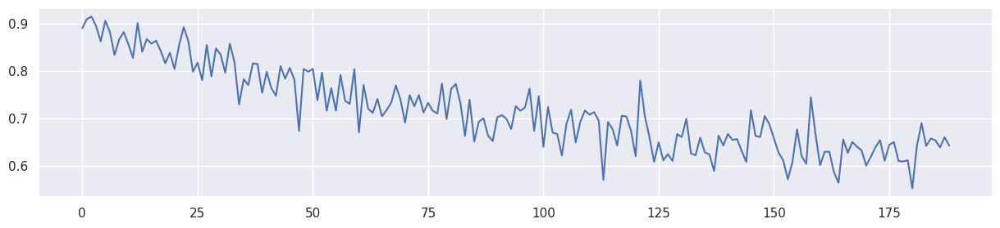

Mean F1 for all data: 0.7166221775983053
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: -0.000677] [G loss: 0.695255]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: -0.245025] [G loss: 0.679519]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: -0.281497] [G loss: 0.653975]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: -0.242437] [G loss: 0.624520]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: -0.250983] [G loss: 0.592295]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: -0.280654] [G loss: 0.558639]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: -0.230927] [G loss: 0.524603]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: -0.212511] [G loss: 0.490709]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: -0.212753] [G loss: 0.457004]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: -0.267463] [G loss: 0.424062]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: -0.284199] [G loss: 0.392816]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: -0.253407] [G loss: 0.364744]
[Lambda: 0.200000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 531.42it/s]


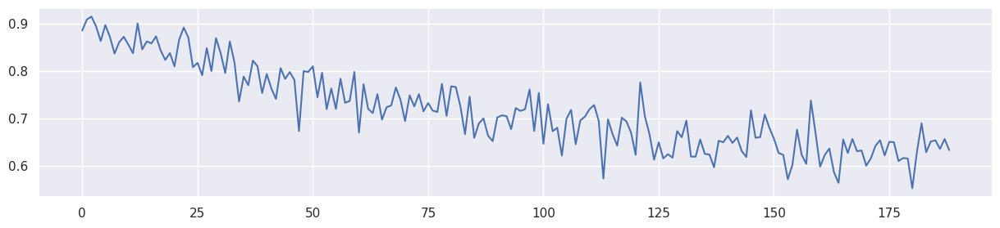

Mean F1 for all data: 0.7174196149747
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: -0.000742] [G loss: 0.695255]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: -0.248328] [G loss: 0.681439]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: -0.271689] [G loss: 0.659835]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: -0.178160] [G loss: 0.632550]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: -0.279653] [G loss: 0.602561]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: -0.259094] [G loss: 0.571255]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: -0.269224] [G loss: 0.539999]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: -0.300718] [G loss: 0.509264]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: -0.265170] [G loss: 0.479416]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: -0.218511] [G loss: 0.450434]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: -0.185812] [G loss: 0.422386]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: -0.227926] [G loss: 0.395727]
[Lambda: 0.300000] [Epoch 2400/4000] [mi loss

100%|██████████| 189/189 [00:00<00:00, 530.42it/s]


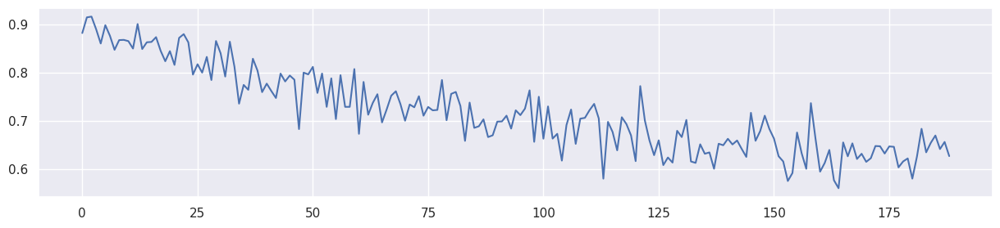

Mean F1 for all data: 0.718721586754695
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: -0.000893] [G loss: 0.695255]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: -0.276093] [G loss: 0.682707]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: -0.278798] [G loss: 0.668227]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: -0.213361] [G loss: 0.645862]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: -0.208533] [G loss: 0.620770]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: -0.241046] [G loss: 0.593402]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: -0.237640] [G loss: 0.565298]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: -0.269522] [G loss: 0.537446]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: -0.286446] [G loss: 0.510107]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: -0.218378] [G loss: 0.484037]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: -0.236719] [G loss: 0.458794]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: -0.243992] [G loss: 0.434043]
[Lambda: 0.400000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 526.08it/s]


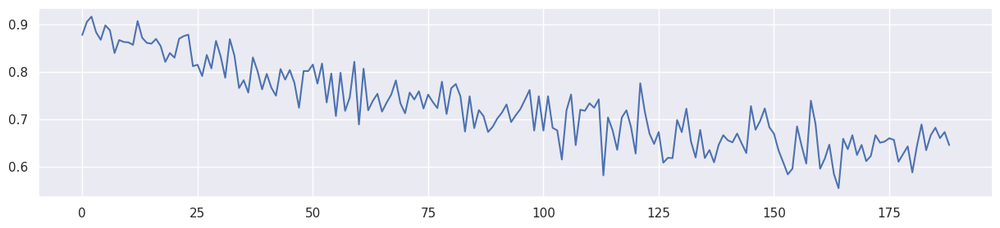

Mean F1 for all data: 0.726769720483711
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: -0.000846] [G loss: 0.695255]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: -0.279569] [G loss: 0.683624]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: -0.261512] [G loss: 0.674199]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: -0.269303] [G loss: 0.661789]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: -0.227663] [G loss: 0.643147]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: -0.269627] [G loss: 0.621416]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: -0.254956] [G loss: 0.597928]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: -0.281447] [G loss: 0.573684]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: -0.267888] [G loss: 0.549640]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: -0.194577] [G loss: 0.526467]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: -0.248579] [G loss: 0.504335]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: -0.242023] [G loss: 0.484239]
[Lambda: 0.500000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 523.32it/s]


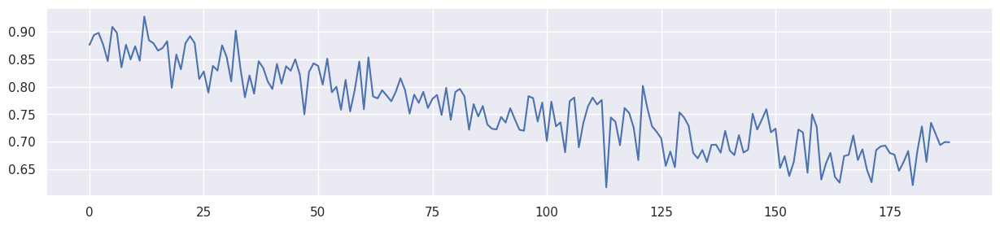

Mean F1 for all data: 0.7594694788152205
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: -0.000558] [G loss: 0.695255]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: -0.234997] [G loss: 0.684400]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: -0.261834] [G loss: 0.678472]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: -0.268175] [G loss: 0.671480]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: -0.271456] [G loss: 0.662165]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: -0.259521] [G loss: 0.651160]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: -0.229584] [G loss: 0.635377]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: -0.301756] [G loss: 0.617241]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: -0.279027] [G loss: 0.597891]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: -0.242591] [G loss: 0.578299]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: -0.307637] [G loss: 0.558638]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: -0.274647] [G loss: 0.539773]
[Lambda: 0.600000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 525.69it/s]


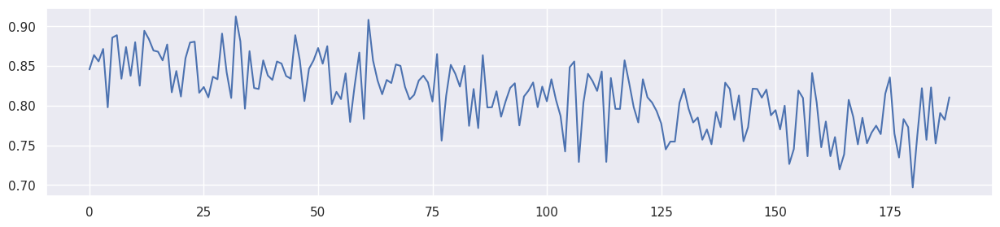

Mean F1 for all data: 0.813992875293297
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: -0.000891] [G loss: 0.695255]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: -0.269531] [G loss: 0.685702]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: -0.253462] [G loss: 0.682056]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: -0.293174] [G loss: 0.677455]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: -0.265045] [G loss: 0.672288]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: -0.226977] [G loss: 0.666171]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: -0.275295] [G loss: 0.659397]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: -0.231414] [G loss: 0.651456]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: -0.221992] [G loss: 0.642067]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: -0.221949] [G loss: 0.632179]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: -0.305082] [G loss: 0.620625]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: -0.248313] [G loss: 0.607815]
[Lambda: 0.700000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 521.30it/s]


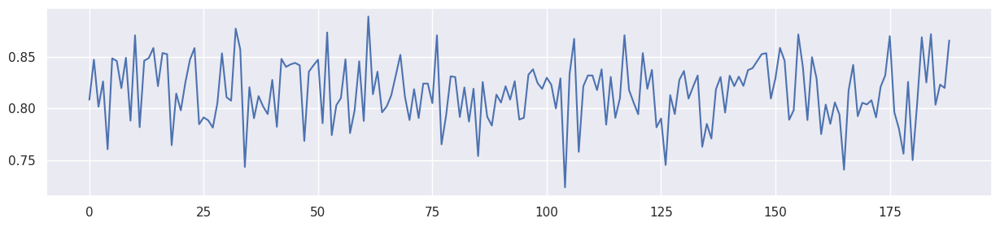

Mean F1 for all data: 0.8161895427414835
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: -0.000439] [G loss: 0.695255]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: -0.286648] [G loss: 0.686193]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: -0.251613] [G loss: 0.684166]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: -0.258449] [G loss: 0.682536]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: -0.238377] [G loss: 0.681625]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: -0.244182] [G loss: 0.679507]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: -0.224267] [G loss: 0.677713]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: -0.254188] [G loss: 0.675610]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: -0.224985] [G loss: 0.673243]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: -0.285370] [G loss: 0.670629]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: -0.310158] [G loss: 0.667232]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: -0.266681] [G loss: 0.663434]
[Lambda: 0.800000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 528.30it/s]


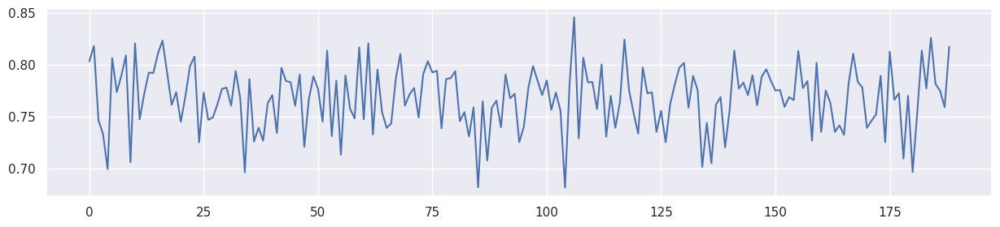

Mean F1 for all data: 0.7674484253251664
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: -0.000790] [G loss: 0.695255]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: -0.239394] [G loss: 0.687140]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: -0.262882] [G loss: 0.686942]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: -0.274371] [G loss: 0.686701]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: -0.220771] [G loss: 0.686024]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: -0.274581] [G loss: 0.685925]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: -0.221749] [G loss: 0.685803]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: -0.263408] [G loss: 0.685001]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: -0.261075] [G loss: 0.685002]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: -0.243621] [G loss: 0.684552]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: -0.241836] [G loss: 0.684583]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: -0.207015] [G loss: 0.683953]
[Lambda: 0.900000] [Epoch 2400/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 516.24it/s]


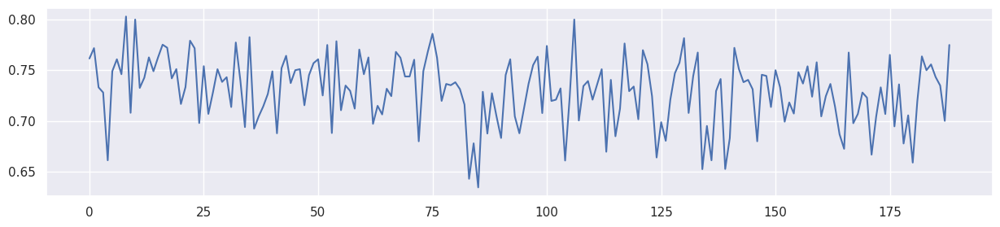

Mean F1 for all data: 0.729651351122676


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


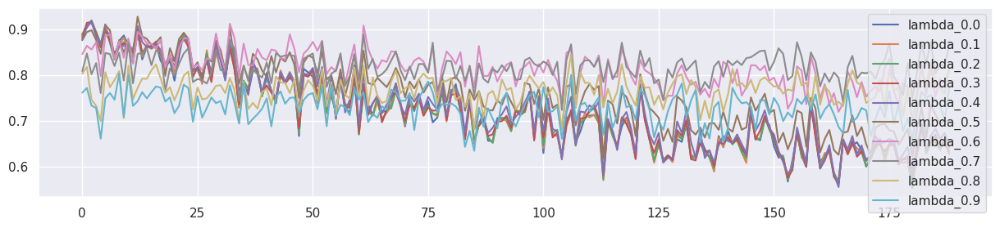

In [38]:
seed_everything()

train_result = []
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]# Lambda value for the fairness discriminator of FR-Train.
#lambda_f_set = [0.4,0.8]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
        f1,mi,last_generator= train_model4(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed,alpha=1.2)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



# GAN 기반의 RF-Train이 아닌, G(Z,B) 모델에서 전처리 학습 방법 적용
+ GAN 기번의 RF-Train 응용 방법은 일종의 orver-fitting을 막는 방법론에 해당한다.
+ 즉, trainset의 z에 over-fitting되어 이후 live data에 대해 성능이 저하되는 현상을 막도록하는 방법이다.
+ 따라서 이 방법은 결정적으로 test_f1 및 init_f1을 낮게 (z를 포함한 모든 feature을 학습하는 일반적인 학습방법에 비하여) 하는 결점을 갖는다.
+ 그렇다면, 이를 극복하며 live data의 성능도 떨어지지 않게 하는 방법은 무엇인가?
+ 본 chapter에서는 G(Z,B)를 입력으로 갖는 구조. 즉, bucket number와 z의 관계를 학습하여 전처리의 개념으로 새로 생성된 g를 z에 대신하여 D(x,g)에 입력하여 학습하는 모델을 제안한다.

## D(x,G(z,b)) 구조


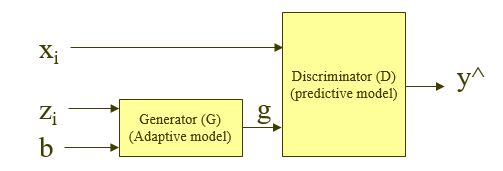

<pre>
x0 -------------------------------------> |                        |
x1 -------------------------------------> |                        |
x2 -------------------------------------> | Discriminator (D(x,g)) | -> y^
x3 -------------------------------------> | predictive model       |
z0 ------>| Generator (G(z,b)) | -- g --> |                        |
b  ------>| adaptive model     |
</pre>

+ 상기 구조의 loss function

$$
L_1 = H(y,\hat{y}) = H(y,D(x,G(z,b)))=\mathbb{E}_{y}[-log(D(x,G(z,b)))]
$$

$$
L_2 = MSE(G(z,b),z)
$$

$$
\min_{G(.)} (1-λ) L_1 + λ L_2
$$


+ 위의 loss function에서, lambda가 0이면 $L_1$의 backward 에서 D를 거쳐 G까지 학습이 이루어 진다. 
+ lambda가 0~1 사이의 값인 경우, G의 생성이 b의 값을 무시하는 방향으로 학습된다. 즉, feature 5개 입력의 특성에 근접, 다시말해 over-fitting의 효과로 학습된다.

In [39]:
X

,x0,x1,x2,x3,z0,b
0,2.231833,0.663053,2.160447,1.180836,1.125117,0
1,1.326272,2.285045,2.362769,2.638806,2.171340,0
2,1.845348,3.743190,3.310210,1.772473,2.576518,0
3,2.974414,-0.229197,1.024580,1.387895,0.873782,0
4,2.854022,3.102544,1.610779,1.774781,2.490660,0
...,...,...,...,...,...,...
39995,0.085122,-0.571732,1.527233,1.867146,-1.177338,399
39996,1.069521,-0.221247,1.324087,1.798258,4.045168,399
39997,0.429295,2.593988,2.329410,1.859496,1.785665,399
39998,1.611266,-0.588687,-0.591898,2.126287,9.291351,399


In [40]:
mi_scores = make_mi_scores(X[['x0','x1','x2','x3','z0']], X['b'], discrete_features="auto")
print(mi_scores)

z0    0.163087
x0    0.000000
x1    0.000000
x2    0.000000
x3    0.000000
Name: MI Scores, dtype: float64


+ I(Z,B) 만 0.16의 수치가 나오는 것을 확인 할 수 있음!!!!
+ 즉, Z는 시간에 따라 importance가 변하고 있음.... -> Concept drift의 발생 요소  

In [41]:
# 학습셋에서의 I(Z,B)

mi_scores = make_mi_scores(X[0:2000][['x0','x1','x2','x3','z0']], X[0:2000]['b'], discrete_features="auto")
print(mi_scores)

x3    0.020639
x2    0.010275
x0    0.000000
x1    0.000000
z0    0.000000
Name: MI Scores, dtype: float64


+ 감지 안됨!!!!

(40000, 5)
(40000,)


100%|██████████| 5000/5000 [00:09<00:00, 509.52it/s]



0.0059679546


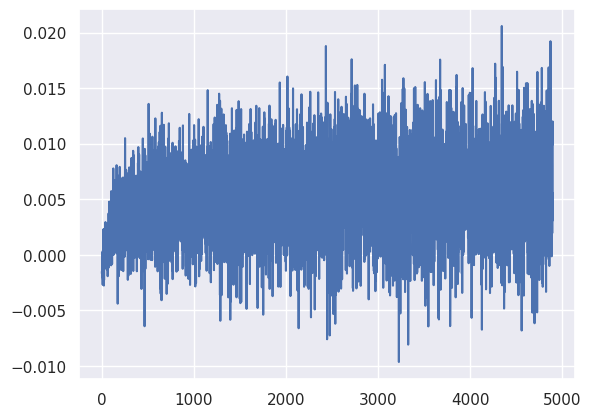

In [42]:
from tqdm import tqdm

H=20
n_epoch = 5000
minibatch = 1000

x1 = X[0:2000][['z0']].values
y1 = X[0:2000][['b']].values #y_train.data.numpy()

#x1 = X[['z0']].values
#y1 = X[['b']].values #y_train.data.numpy()

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(1, H)
        self.fc2 = nn.Linear(1, H)
        self.fc3 = nn.Linear(H, 1)

    def forward(self, x, y):
        h1 = F.relu(self.fc1(x)+self.fc2(y))
        h2 = self.fc3(h1)
        return h2  

model = Net()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

print(x.shape)
print(y.shape)
plot_loss = []
for epoch in tqdm(range(n_epoch)):
    s = np.random.choice(x1.shape[0],minibatch)
    x_sample = Variable(torch.from_numpy(x1[s].reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
    y_sample = Variable(torch.from_numpy(y1[s]).type(torch.FloatTensor), requires_grad = True)
    y_shuffle = Variable(torch.from_numpy(np.random.permutation(y1[s])).type(torch.FloatTensor), requires_grad = True)    
    ret = torch.mean(model(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(model(x_sample, y_shuffle))))
    loss = - ret  # maximize
    model.zero_grad()
    loss.backward()
    optimizer.step()
    plot_loss.append(ret.data.numpy())


    #back_loss = loss

print('')

plot_loss = np.asarray(plot_loss)

plt.plot(plot_loss[100:])
print(np.mean(plot_loss[4000:]))

+ 유의미하게 감지되지 않음.....
+ 잘 안될거 같은데...

In [43]:
avaible_range = 400

In [44]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):
   
    def __init__(self):
        """Initializes DiscriminatorF with torch components."""
        
        super(Sensitivity_Adapter, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(2, 40),
            nn.ReLU(),
            nn.Linear(40, 1),
            #nn.ReLU(),
            #nn.Linear(5, 1)          
        )

    def forward(self, z0,b):

        adjusted_z = self.model(torch.cat((z0,b), 1))
        return adjusted_z

In [45]:

def test_model2(model_,model2_, tX, ty, s1):
    model_.eval()
    model2_.eval()

    a_z = model2_(tX[:,4].reshape(-1,1),tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(torch.cat((tX[:,0:4],a_z.reshape(-1,1)),1))
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [46]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model5(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter()
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        '''
        s = np.random.choice(XS_train.shape[0],minibatch)

        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = XS_train[s][:,5].reshape(-1,1) # bucket number.. B
        y_shuffle = XS_train[np.random.permutation(s)][:,5].reshape(-1,1) #permute bucket number.. B
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1

        ibz = torch.full((XS_train.shape[0],1), ret1.data.numpy())
        '''
        a_z = adapter(XS_train[:,4].reshape(-1,1) ,XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = mse_loss(a_z, XS_train[:,5].reshape(-1,1)) 

        # -------------------
        #  Forwards Generator
        # -------------------
        xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model2(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

In [47]:
def test_all_data3(generator,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0']]
    yT = y[train_size:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            #xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)).reshape(-1,1)
            predicted_y = generator(tmp_x)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

In [48]:
def test_all_data2(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]

    bucket_size_array=[200]

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)/avaible_range).reshape(-1,1)
            predicted_y = generator(torch.cat((tmp_x[:,0:4],xs),1))
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 154.804932] [G loss: 0.640260]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 203.462219] [G loss: 0.533527]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 278.247437] [G loss: 0.437779]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 346.442780] [G loss: 0.399958]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 325.892029] [G loss: 0.372151]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 305.271118] [G loss: 0.347426]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 269.389313] [G loss: 0.323220]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 231.249420] [G loss: 0.293667]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 242.911514] [G loss: 0.267781]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 265.530518] [G loss: 0.251787]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 284.307159] [G loss: 0.242797]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 301.299469] [G loss: 0.23

100%|██████████| 189/189 [00:00<00:00, 451.51it/s]


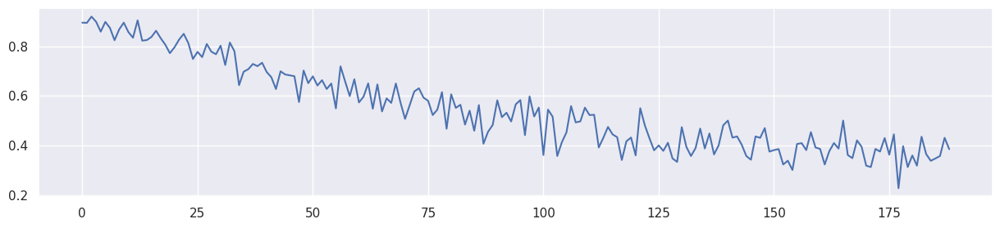

Mean F1 for all data: 0.549057497876003
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 131.352264] [G loss: 0.640011]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 184.306702] [G loss: 0.524523]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 253.155716] [G loss: 0.432456]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 295.470062] [G loss: 0.397127]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 259.958282] [G loss: 0.370439]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 219.520142] [G loss: 0.341331]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 174.436325] [G loss: 0.314733]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 150.755569] [G loss: 0.280810]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 147.583069] [G loss: 0.257989]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 139.738449] [G loss: 0.245759]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 130.605133] [G loss: 0.237968]
[Lambda: 0.100000] [Epoch 2400/4

100%|██████████| 189/189 [00:00<00:00, 450.26it/s]


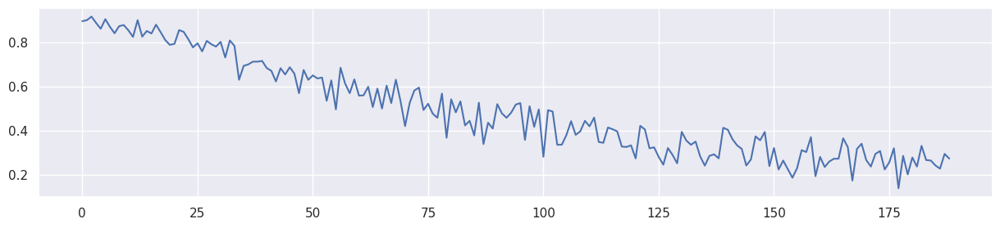

Mean F1 for all data: 0.4916035425434105
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 126.287186] [G loss: 0.639769]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 178.539490] [G loss: 0.523637]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 241.331879] [G loss: 0.432446]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 261.676727] [G loss: 0.396141]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 216.549744] [G loss: 0.366731]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 176.178925] [G loss: 0.338054]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 129.003418] [G loss: 0.307878]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 109.197632] [G loss: 0.274658]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 101.980934] [G loss: 0.254512]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 93.928474] [G loss: 0.242364]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 85.502594] [G loss: 0.235031]
[Lambda: 0.200000] [Epoch 2400/40

100%|██████████| 189/189 [00:00<00:00, 448.87it/s]


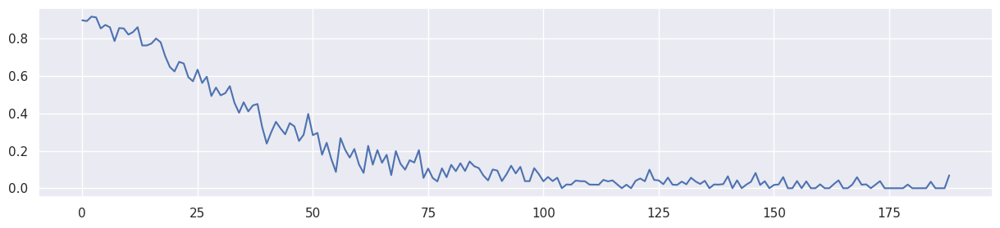

Mean F1 for all data: 0.20373869026489982
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 121.858131] [G loss: 0.639732]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 172.853302] [G loss: 0.523426]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 216.170258] [G loss: 0.435653]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 219.095657] [G loss: 0.395346]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 177.464264] [G loss: 0.362663]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 140.610794] [G loss: 0.333472]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 99.581223] [G loss: 0.299854]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 83.501816] [G loss: 0.268666]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 77.605415] [G loss: 0.250649]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 71.277481] [G loss: 0.240344]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 64.655785] [G loss: 0.234571]
[Lambda: 0.300000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 442.43it/s]


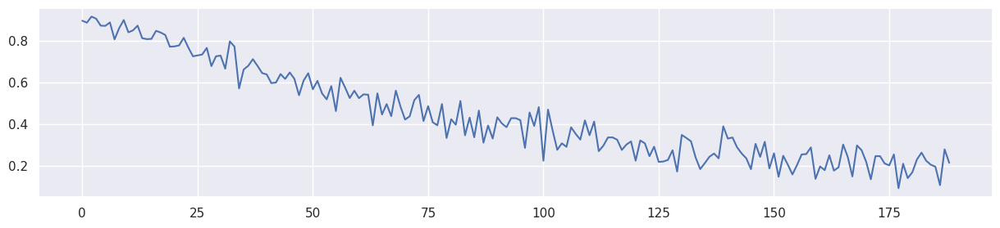

Mean F1 for all data: 0.44209538952316774
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 111.426186] [G loss: 0.640696]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 167.626816] [G loss: 0.521251]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 202.745377] [G loss: 0.435549]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 189.956818] [G loss: 0.393499]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 154.177155] [G loss: 0.359844]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 113.839233] [G loss: 0.329361]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 81.938629] [G loss: 0.293833]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 70.570061] [G loss: 0.264964]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 64.126167] [G loss: 0.248769]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 58.673302] [G loss: 0.239863]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 53.626644] [G loss: 0.234474]
[Lambda: 0.400000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 459.63it/s]


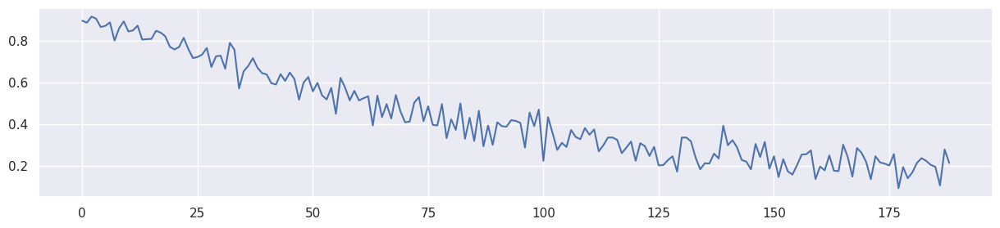

Mean F1 for all data: 0.43582195666873885
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 95.357796] [G loss: 0.646381]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 149.844986] [G loss: 0.524621]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 183.241455] [G loss: 0.435598]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 161.155319] [G loss: 0.389929]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 126.669983] [G loss: 0.353909]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 88.949486] [G loss: 0.319217]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 67.532837] [G loss: 0.282767]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 59.885925] [G loss: 0.259284]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 53.485302] [G loss: 0.246942]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 48.187553] [G loss: 0.239574]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 43.534435] [G loss: 0.233865]
[Lambda: 0.500000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 451.61it/s]


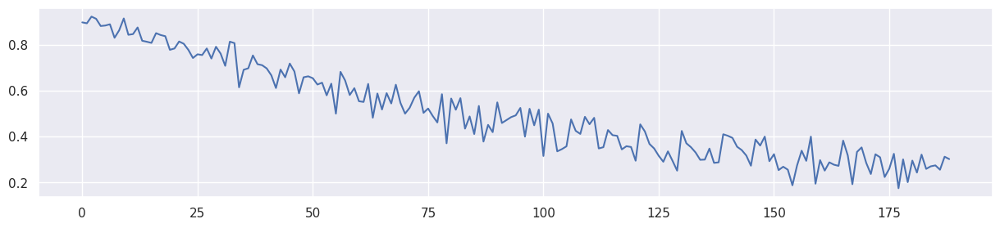

Mean F1 for all data: 0.5009820841680166
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 1.405430] [G loss: 0.673815]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 80.082954] [G loss: 0.580669]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 121.790390] [G loss: 0.467498]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 117.922798] [G loss: 0.394636]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 99.772064] [G loss: 0.342591]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 84.453087] [G loss: 0.299885]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 73.038864] [G loss: 0.271719]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 62.957764] [G loss: 0.254838]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 55.277409] [G loss: 0.244594]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 49.513756] [G loss: 0.237785]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 45.452122] [G loss: 0.232667]
[Lambda: 0.600000] [Epoch 2400/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 443.17it/s]


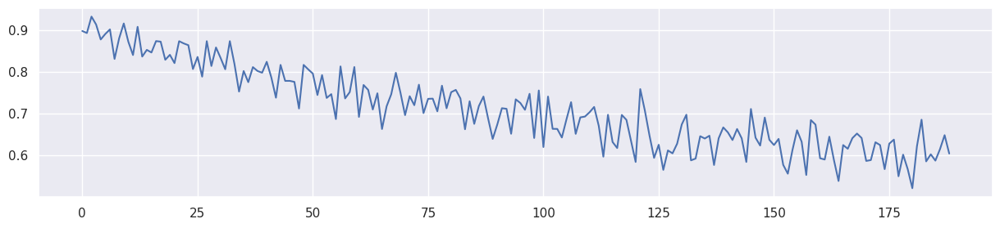

Mean F1 for all data: 0.7122043360021552
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 0.777711] [G loss: 0.674546]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 40.618130] [G loss: 0.600847]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 97.816490] [G loss: 0.474618]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 95.024872] [G loss: 0.394656]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 78.485710] [G loss: 0.339309]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 67.059166] [G loss: 0.297394]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 57.602291] [G loss: 0.270407]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 51.006039] [G loss: 0.254439]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 45.967186] [G loss: 0.244589]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 42.137627] [G loss: 0.238033]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 39.610535] [G loss: 0.233229]
[Lambda: 0.700000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 446.30it/s]


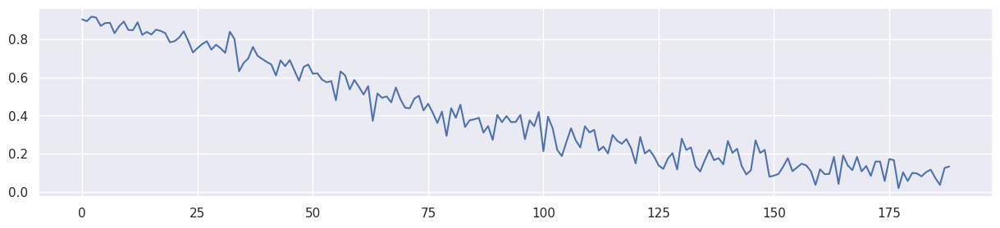

Mean F1 for all data: 0.4051771320945448
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 0.322217] [G loss: 0.675282]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 14.438746] [G loss: 0.625845]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 64.835869] [G loss: 0.492642]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 65.550339] [G loss: 0.399843]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 58.698940] [G loss: 0.337931]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 50.290504] [G loss: 0.296617]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 44.443161] [G loss: 0.270863]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 40.494583] [G loss: 0.255451]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 37.465000] [G loss: 0.245699]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 35.511791] [G loss: 0.238844]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 34.205959] [G loss: 0.233858]
[Lambda: 0.800000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 450.05it/s]


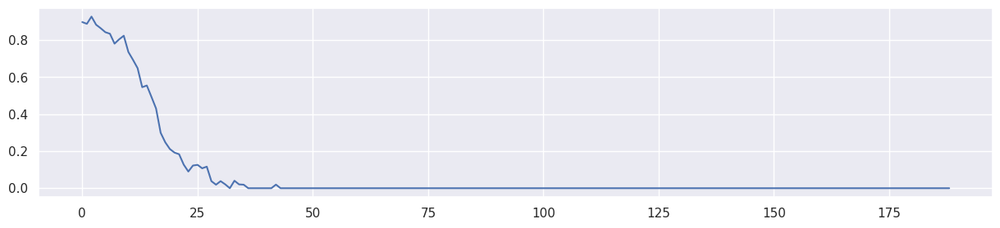

Mean F1 for all data: 0.07769931828658172
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 89.152664] [G loss: 0.687443]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 0.132350] [G loss: 0.675668]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 1.136044] [G loss: 0.646215]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 16.646324] [G loss: 0.546899]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 33.582684] [G loss: 0.419377]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 35.837284] [G loss: 0.344489]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 34.485249] [G loss: 0.300263]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 32.713062] [G loss: 0.273870]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 31.469805] [G loss: 0.258072]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 30.567270] [G loss: 0.247662]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 30.030270] [G loss: 0.240293]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 29.719414] [G loss: 0.234962]
[Lambda: 0.900000] [Epoch 2400/4000] [mi lo

100%|██████████| 189/189 [00:00<00:00, 454.27it/s]


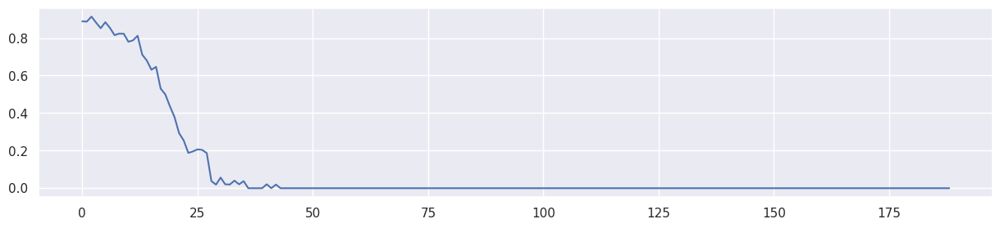

Mean F1 for all data: 0.09177201483665841


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


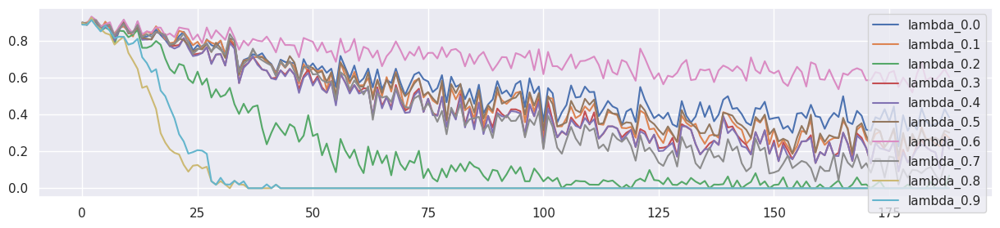

In [49]:
seed_everything()

train_result = []

avaible_range = 1

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.3]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.00015) #0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



+ bucket number를 normalize하면 모델의 유효기간을 설정할 수 있다.
+ 즉, 유효기간까지는 model의 성능을 보전 시킬 수 있는 개념
+ 상기 모든 처리를 그대로 두고 bucket number를 normalize 하여 실험 한다.

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 136.299149] [G loss: 0.641753]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 188.237122] [G loss: 0.546020]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 214.804932] [G loss: 0.441682]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 254.903152] [G loss: 0.402109]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 254.935364] [G loss: 0.378705]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 221.291870] [G loss: 0.348392]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 189.317123] [G loss: 0.320971]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 149.363358] [G loss: 0.289374]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 153.348389] [G loss: 0.264810]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 167.908478] [G loss: 0.251533]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 183.124512] [G loss: 0.242845]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 196.580597] [G loss: 0.2

100%|██████████| 189/189 [00:00<00:00, 447.27it/s]


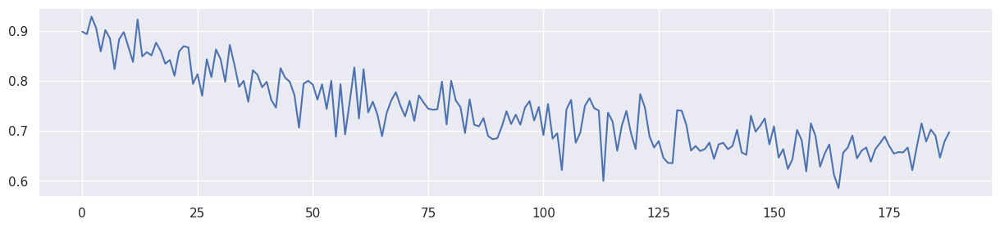

Mean F1 for all data: 0.737938542706048
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 134.600143] [G loss: 0.641765]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 186.253036] [G loss: 0.545518]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 210.978409] [G loss: 0.441354]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 237.751129] [G loss: 0.401625]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 221.569534] [G loss: 0.376984]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 186.729736] [G loss: 0.346191]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 155.139603] [G loss: 0.318168]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 122.756798] [G loss: 0.286403]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 119.833046] [G loss: 0.264084]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 118.593864] [G loss: 0.251052]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 117.840225] [G loss: 0.242675]
[Lambda: 0.100000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 451.46it/s]


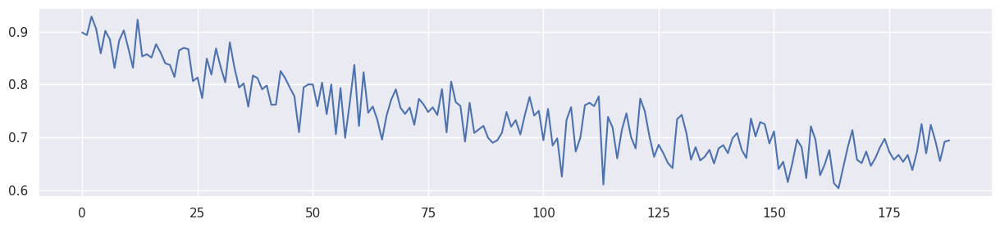

Mean F1 for all data: 0.741925257023743
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 129.147476] [G loss: 0.642712]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 180.690521] [G loss: 0.542233]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 204.941559] [G loss: 0.437109]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 219.065765] [G loss: 0.399894]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 191.132095] [G loss: 0.375097]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 154.258408] [G loss: 0.343583]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 121.343697] [G loss: 0.314515]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 98.834152] [G loss: 0.283315]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 91.740669] [G loss: 0.262438]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 87.393166] [G loss: 0.249783]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 81.136948] [G loss: 0.241298]
[Lambda: 0.200000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 450.25it/s]


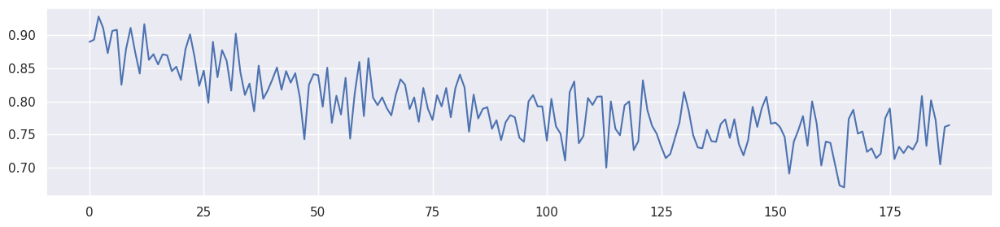

Mean F1 for all data: 0.7920055598030398
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 115.009117] [G loss: 0.646592]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 169.854630] [G loss: 0.543879]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 193.335739] [G loss: 0.438127]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 196.801773] [G loss: 0.399296]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 163.410553] [G loss: 0.372681]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 130.357910] [G loss: 0.340680]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 102.162483] [G loss: 0.309628]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 83.484665] [G loss: 0.278802]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 75.880760] [G loss: 0.259766]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 67.314461] [G loss: 0.246677]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 64.953545] [G loss: 0.238397]
[Lambda: 0.300000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 451.02it/s]


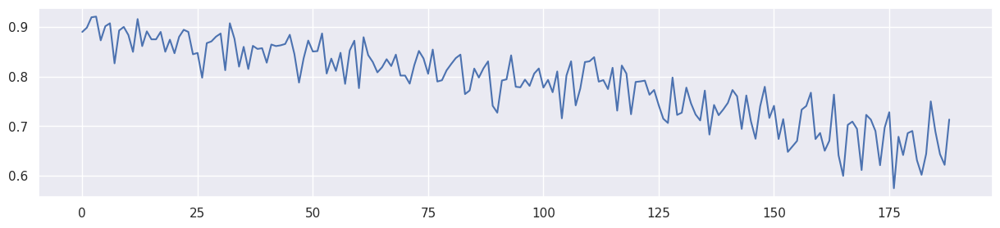

Mean F1 for all data: 0.7868290377918918
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 101.771461] [G loss: 0.648996]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 149.454880] [G loss: 0.543335]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 177.577271] [G loss: 0.435808]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 176.586517] [G loss: 0.397360]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 142.432190] [G loss: 0.368361]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 113.323990] [G loss: 0.335720]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 89.530060] [G loss: 0.304124]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 76.074471] [G loss: 0.274897]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 65.833344] [G loss: 0.255448]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 60.018116] [G loss: 0.244467]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 54.542366] [G loss: 0.236988]
[Lambda: 0.400000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 447.87it/s]


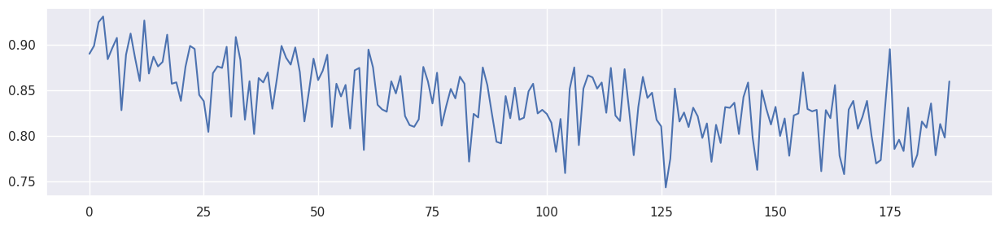

Mean F1 for all data: 0.8384831518142256
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 96.166519] [G loss: 0.650447]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 139.715851] [G loss: 0.545293]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 162.737747] [G loss: 0.436339]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 147.460770] [G loss: 0.397007]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 113.870804] [G loss: 0.363024]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 88.148117] [G loss: 0.327548]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 68.744751] [G loss: 0.292654]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 56.950756] [G loss: 0.264401]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 52.479591] [G loss: 0.248821]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 48.113796] [G loss: 0.239922]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 43.586769] [G loss: 0.234236]
[Lambda: 0.500000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 453.50it/s]


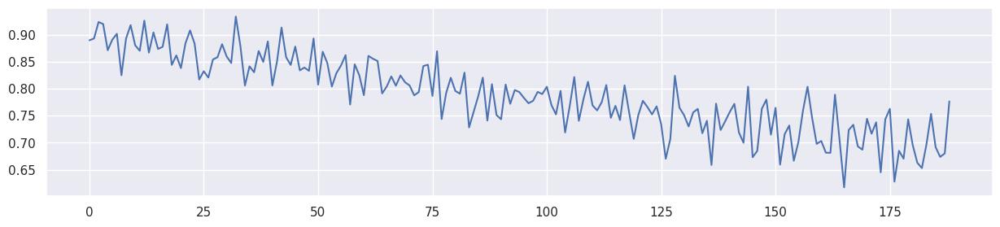

Mean F1 for all data: 0.7884228464093388
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 92.417160] [G loss: 0.651363]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 129.712463] [G loss: 0.547791]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 148.317215] [G loss: 0.438198]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 128.867981] [G loss: 0.395519]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 97.200920] [G loss: 0.360185]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 75.466148] [G loss: 0.324653]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 54.899609] [G loss: 0.290011]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 47.695503] [G loss: 0.262686]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 43.833572] [G loss: 0.248098]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 40.126457] [G loss: 0.239562]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 37.714333] [G loss: 0.233624]
[Lambda: 0.600000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 444.28it/s]


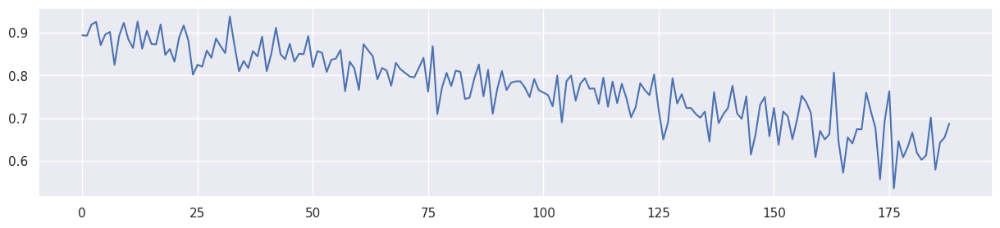

Mean F1 for all data: 0.7739563401681119
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 86.432831] [G loss: 0.654072]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 110.461380] [G loss: 0.558806]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 125.818756] [G loss: 0.441991]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 108.319931] [G loss: 0.393955]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 82.578842] [G loss: 0.357349]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 63.269943] [G loss: 0.322975]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 47.868309] [G loss: 0.288726]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 42.071014] [G loss: 0.262602]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 38.895634] [G loss: 0.247968]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 36.594723] [G loss: 0.238060]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 35.260128] [G loss: 0.230565]
[Lambda: 0.700000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 453.89it/s]


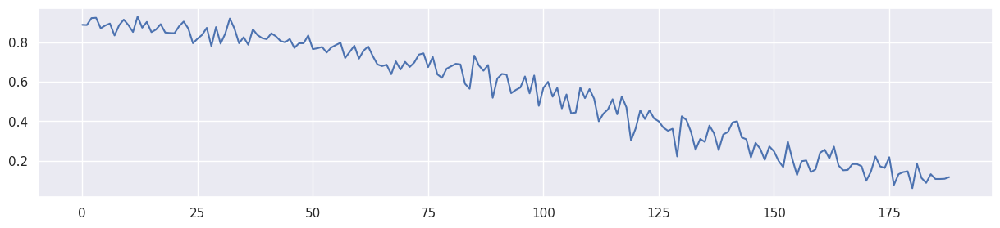

Mean F1 for all data: 0.5454770139932502
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 73.701653] [G loss: 0.663924]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 58.944050] [G loss: 0.601297]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 52.556351] [G loss: 0.470991]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 56.953163] [G loss: 0.378221]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 51.377037] [G loss: 0.324752]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 45.791615] [G loss: 0.289659]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 41.346397] [G loss: 0.266598]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 37.794376] [G loss: 0.250985]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 35.336250] [G loss: 0.240877]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 33.845459] [G loss: 0.234528]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 32.903183] [G loss: 0.230335]
[Lambda: 0.800000] [Epoch 2400/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 454.90it/s]


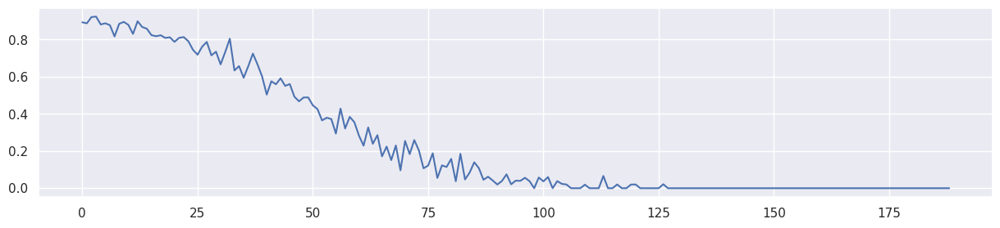

Mean F1 for all data: 0.2446419033578117
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 39.490662] [G loss: 0.677135]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 30.691410] [G loss: 0.650238]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 29.528477] [G loss: 0.624120]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 25.686039] [G loss: 0.561237]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 40.808121] [G loss: 0.401314]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 40.661697] [G loss: 0.317957]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 37.168114] [G loss: 0.282754]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 34.415726] [G loss: 0.264122]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 32.569786] [G loss: 0.252912]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 31.325113] [G loss: 0.245557]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 30.525070] [G loss: 0.240323]
[Lambda: 0.900000] [Epoch 2400/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 459.79it/s]


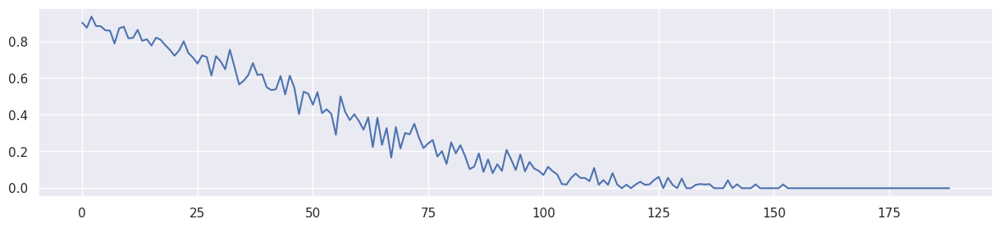

Mean F1 for all data: 0.26332900590581526


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


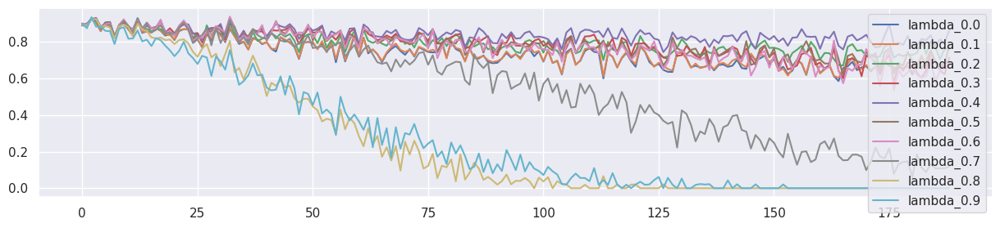

In [50]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.00015)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



+ lambda 0.4 에서, I(z,b)와 I(g,b)를 비교하기

In [51]:
def test_all_data5(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]
    print('XT.shape',XT.shape)
    bucket_size_array=[200]
    gs = torch.tensor([])
    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,4].reshape(-1,1),tmp_x[:,5].reshape(-1,1)/avaible_range).reshape(-1,1)
            gs = torch.cat((gs,xs),0)
            predicted_y = generator(torch.cat((tmp_x[:,0:4],xs),1))
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s,gs

[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 86.164993] [G loss: 0.654207]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 109.399551] [G loss: 0.559565]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 124.947968] [G loss: 0.442193]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 107.506630] [G loss: 0.393877]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 81.940636] [G loss: 0.357169]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 63.009033] [G loss: 0.322675]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 47.912205] [G loss: 0.288527]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 42.005184] [G loss: 0.262648]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 38.814346] [G loss: 0.247769]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 36.506138] [G loss: 0.237439]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 35.191223] [G loss: 0.230430]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 34.322449] [G loss: 0.226783]
[L

100%|██████████| 190/190 [00:00<00:00, 451.16it/s]


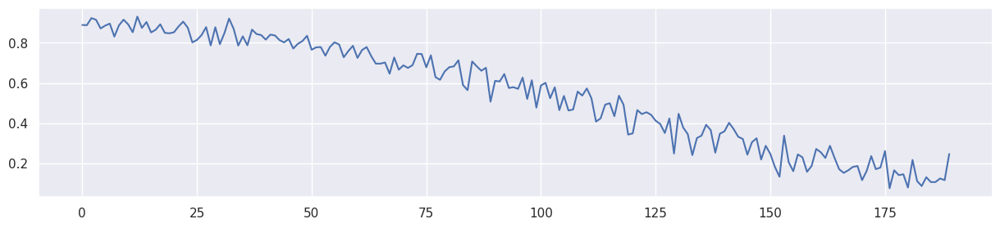

Mean F1 for all data: 0.5506627440503044
gs.shape torch.Size([38000, 1])
I(z,b) b     5.932748
z0    0.140249
x1    0.000640
x0    0.000000
x2    0.000000
x3    0.000000
Name: MI Scores, dtype: float64
I(g,b) 1.1984181818576793


In [52]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.7]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'],gs = test_all_data5(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

print('gs.shape',gs.shape)
mi_scores = make_mi_scores(X[2000:], X[2000:]['b'], discrete_features="auto")
print('I(z,b)',mi_scores)
mi_scores = make_mi_scores(pd.DataFrame(gs.data.numpy(),columns=['g']), X[2000:]['b'], discrete_features="auto")
print('I(g,b)',mi_scores['g'])



# D(x,G(z,b)) + MINE 구조

+ D(x,G(z,b)) 구조에서 보면, I(z,y), I(g,y) 를 최대로 만들때 성능이 향상됨을 확인 함.
+ 이는 I(z,y^)을 최소화 해서 over-fitting 을 막는 것이 아닌, b와의 관계성을 더 증폭시켜서 b에 적응한 학습을 하게하는 효과라고 해석함.
+ 따라서, 학습 알고리즘 상에서 I(z,y) 또는 I(g,y) 를 최대로

In [53]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model55(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):
    """
      Trains FR-Train by using the classes in FRTrain_arch.py.
      
      Args:
        train_tensors: Training data.
        test_tensors: Test data.
        train_opt: Options for the training. It currently contains size of validation set, 
                number of epochs, generator/discriminator update ratio, and learning rates.
        lambda_f: The tuning knob for L_2 (ref: FR-Train paper, Section 3.3).
        seed: An integer value for specifying torch random seed.
        
      Returns:
        Information about the tuning knobs (lambda_f),
        the test accuracy of the trained model, and disparate impact of the trained model.
    """
    
    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter()
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        '''
        s = np.random.choice(XS_train.shape[0],minibatch)

        x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        y_sample = XS_train[s][:,5].reshape(-1,1) # bucket number.. B
        y_shuffle = XS_train[np.random.permutation(s)][:,5].reshape(-1,1) #permute bucket number.. B
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1

        ibz = torch.full((XS_train.shape[0],1), ret1.data.numpy())
        '''
        a_z = adapter(XS_train[:,4].reshape(-1,1) ,XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = mse_loss(a_z, XS_train[:,5].reshape(-1,1)) 

        # -------------------
        #  Forwards Generator
        # -------------------
        xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  I(g,y)의 MINE loss
        # -------------------------------
        
        s = np.random.choice(XS_train.shape[0],minibatch)

        #x_sample = Variable(torch.from_numpy(s1_train[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        x_sample = a_z[s] #Variable(torch.from_numpy(a_z[s].data.numpy().reshape(-1,1)).type(torch.FloatTensor), requires_grad = True)
        #y_sample = gen_y[s]
        #y_shuffle = gen_y[np.random.permutation(s)]
        y_sample = y_train[s].reshape(-1,1)
        y_shuffle = y_train[np.random.permutation(s)].reshape(-1,1)
        #y_sample = XS_train[s,5].reshape(-1,1)
        #y_shuffle = XS_train[np.random.permutation(s),5].reshape(-1,1)
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1

        optimizer_A.zero_grad()
        optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha + mi_loss * lambda_a2 #* 0.05

        loss.backward()
        optimizer_G.step()
        optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model2(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 136.265686] [G loss: 0.641764]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 188.233444] [G loss: 0.546018]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 214.795090] [G loss: 0.441670]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 255.127182] [G loss: 0.402102]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 254.988510] [G loss: 0.378698]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 221.362289] [G loss: 0.348381]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 189.227829] [G loss: 0.320960]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 149.322968] [G loss: 0.289368]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 153.784500] [G loss: 0.264827]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 169.109802] [G loss: 0.251497]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 184.155884] [G loss: 0.242835]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 198.235367] [G loss: 0.2

100%|██████████| 189/189 [00:00<00:00, 455.66it/s]


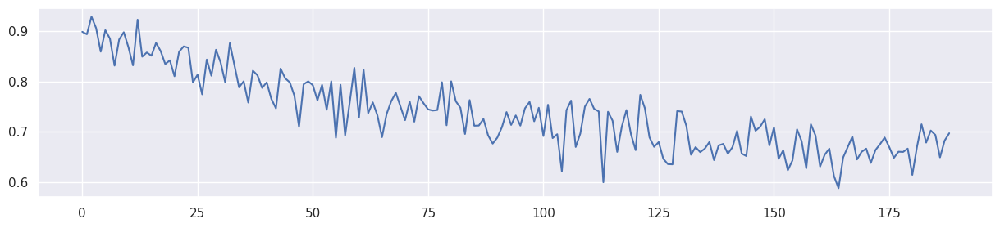

Mean F1 for all data: 0.738152306012405
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 134.628860] [G loss: 0.641759]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 186.233505] [G loss: 0.545541]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 210.942108] [G loss: 0.441385]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 237.709976] [G loss: 0.401645]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 221.429276] [G loss: 0.376978]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 186.659607] [G loss: 0.346203]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 155.057846] [G loss: 0.318166]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 122.716507] [G loss: 0.286367]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 120.022430] [G loss: 0.264106]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 118.963776] [G loss: 0.250987]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 118.045532] [G loss: 0.242623]
[Lambda: 0.100000] [Epoch 2400/

100%|██████████| 189/189 [00:00<00:00, 453.55it/s]


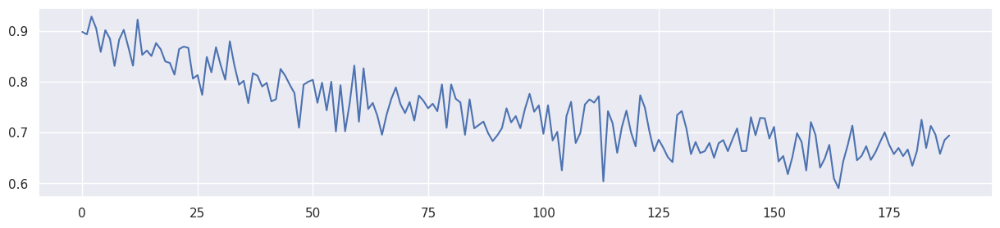

Mean F1 for all data: 0.7414821148199061
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 129.196182] [G loss: 0.642706]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 180.686829] [G loss: 0.542269]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 204.988281] [G loss: 0.437130]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 218.956726] [G loss: 0.399902]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 190.982910] [G loss: 0.375071]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 153.748856] [G loss: 0.343599]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 120.751930] [G loss: 0.314421]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 98.430573] [G loss: 0.283112]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 91.439941] [G loss: 0.262246]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 86.860176] [G loss: 0.249729]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 80.083351] [G loss: 0.240599]
[Lambda: 0.200000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 450.13it/s]


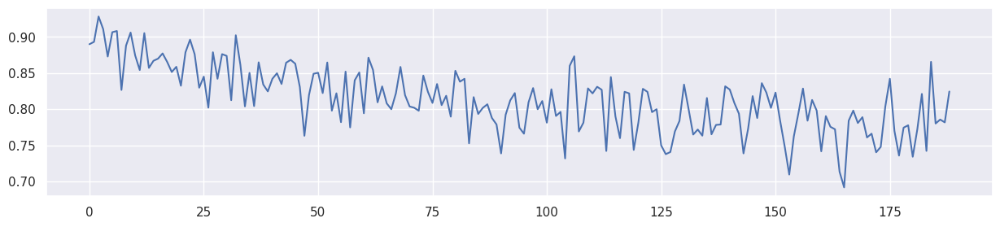

Mean F1 for all data: 0.8135175515378548
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 115.077438] [G loss: 0.646595]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 170.037628] [G loss: 0.543856]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 193.630966] [G loss: 0.438130]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 196.840454] [G loss: 0.399310]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 163.419006] [G loss: 0.372705]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 130.280045] [G loss: 0.340771]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 101.782448] [G loss: 0.309716]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 83.506233] [G loss: 0.278971]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 75.845764] [G loss: 0.259740]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 67.221909] [G loss: 0.246735]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 65.055313] [G loss: 0.238296]
[Lambda: 0.300000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 446.47it/s]


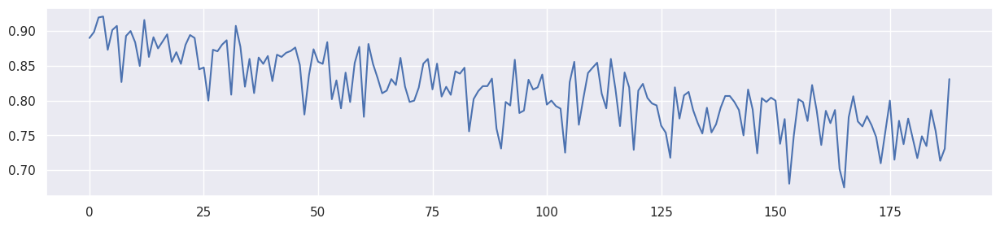

Mean F1 for all data: 0.8138024671084146
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 101.755241] [G loss: 0.649000]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 149.444229] [G loss: 0.543321]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 177.664856] [G loss: 0.435782]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 176.544830] [G loss: 0.397352]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 142.441605] [G loss: 0.368336]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 113.292824] [G loss: 0.335708]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 89.470909] [G loss: 0.304107]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 75.972916] [G loss: 0.274898]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 65.239906] [G loss: 0.255267]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 59.967731] [G loss: 0.243997]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 53.784721] [G loss: 0.236775]
[Lambda: 0.400000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 440.94it/s]


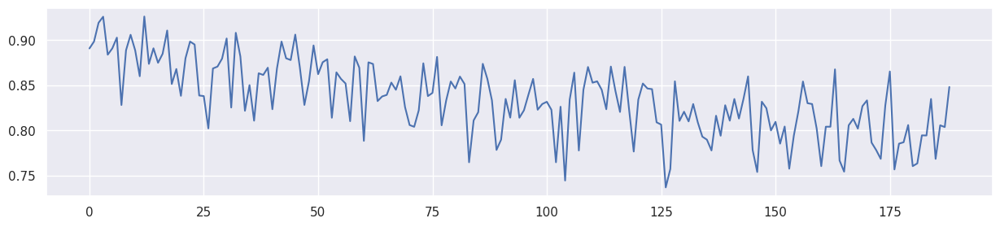

Mean F1 for all data: 0.8349031580512546
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 96.113289] [G loss: 0.650482]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 139.623718] [G loss: 0.545348]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 162.696152] [G loss: 0.436333]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 147.421539] [G loss: 0.396997]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 113.806084] [G loss: 0.363023]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 88.145248] [G loss: 0.327527]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 68.171684] [G loss: 0.292648]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 55.840782] [G loss: 0.264195]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 51.969524] [G loss: 0.248221]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 47.451008] [G loss: 0.239660]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 43.131924] [G loss: 0.234032]
[Lambda: 0.500000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 445.53it/s]


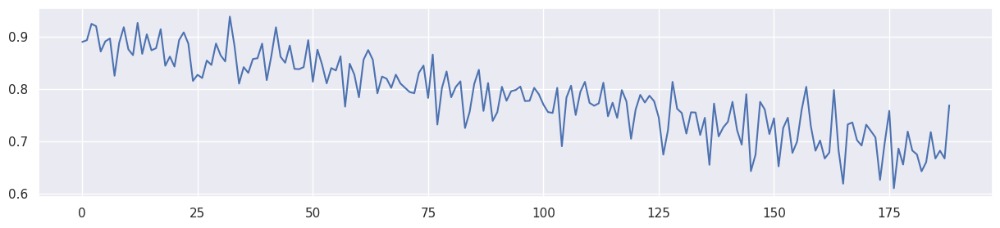

Mean F1 for all data: 0.7870298608410218
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 92.356880] [G loss: 0.651408]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 129.514587] [G loss: 0.547913]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 148.286011] [G loss: 0.438182]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 128.825104] [G loss: 0.395491]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 97.220238] [G loss: 0.360160]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 75.462135] [G loss: 0.324654]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 54.899475] [G loss: 0.290025]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 47.654026] [G loss: 0.262694]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 43.803799] [G loss: 0.248116]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 40.097969] [G loss: 0.239581]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 37.688473] [G loss: 0.233650]
[Lambda: 0.600000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 450.45it/s]


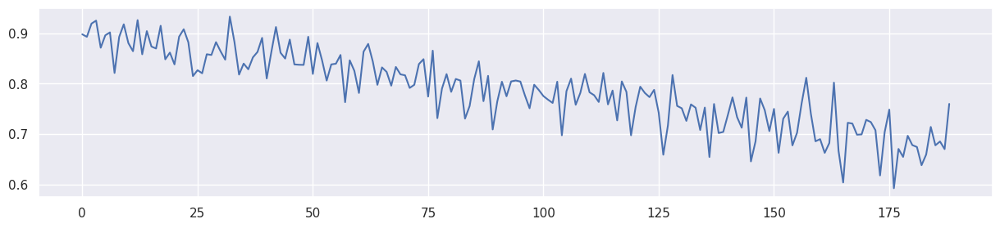

Mean F1 for all data: 0.786989400117047
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 86.390472] [G loss: 0.654118]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 110.218750] [G loss: 0.559023]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 125.881805] [G loss: 0.441937]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 108.137115] [G loss: 0.393962]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 82.505089] [G loss: 0.357333]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 63.012852] [G loss: 0.322929]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 48.028225] [G loss: 0.288674]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 42.021240] [G loss: 0.262618]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 38.886906] [G loss: 0.247891]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 36.575188] [G loss: 0.237915]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 35.252308] [G loss: 0.230534]
[Lambda: 0.700000] [Epoch 2400/4000] [m

100%|██████████| 189/189 [00:00<00:00, 443.30it/s]


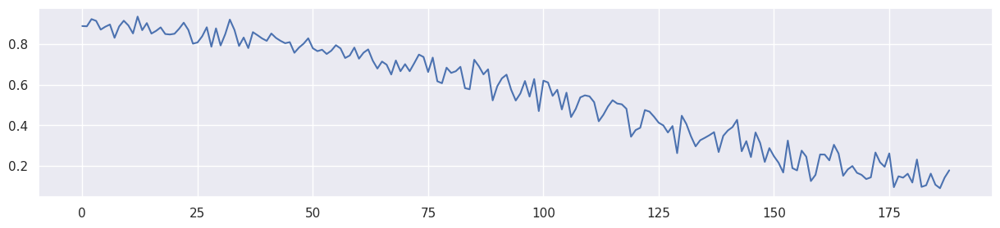

Mean F1 for all data: 0.5539235296565017
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 75.103432] [G loss: 0.662747]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 59.624840] [G loss: 0.600596]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 52.323067] [G loss: 0.471220]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 56.633568] [G loss: 0.378276]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 51.271923] [G loss: 0.324734]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 45.533428] [G loss: 0.289744]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 41.349022] [G loss: 0.266617]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 37.763367] [G loss: 0.250938]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 35.388760] [G loss: 0.240869]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 33.862324] [G loss: 0.234561]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 32.922325] [G loss: 0.230422]
[Lambda: 0.800000] [Epoch 2400/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 444.96it/s]


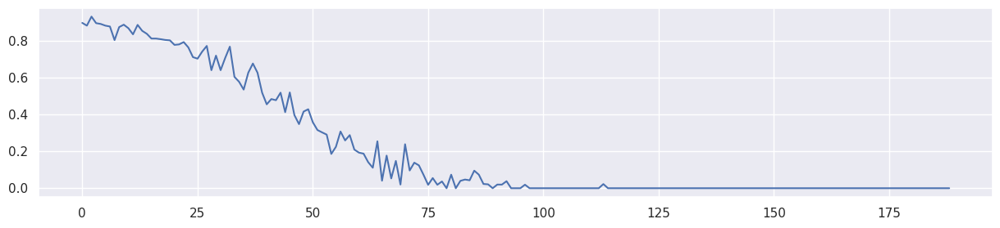

Mean F1 for all data: 0.21530153250937137
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 100.029007] [G loss: 0.686119]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 39.492054] [G loss: 0.677135]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 30.683796] [G loss: 0.650256]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 29.514093] [G loss: 0.624135]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 25.703249] [G loss: 0.561325]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 40.819592] [G loss: 0.401280]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 40.665207] [G loss: 0.317986]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 37.168465] [G loss: 0.282792]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 34.387600] [G loss: 0.264198]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 32.544411] [G loss: 0.252990]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 31.364561] [G loss: 0.245151]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 30.589006] [G loss: 0.239750]
[Lambda: 0.900000] [Epoch 2400/4000] [mi

100%|██████████| 189/189 [00:00<00:00, 453.05it/s]


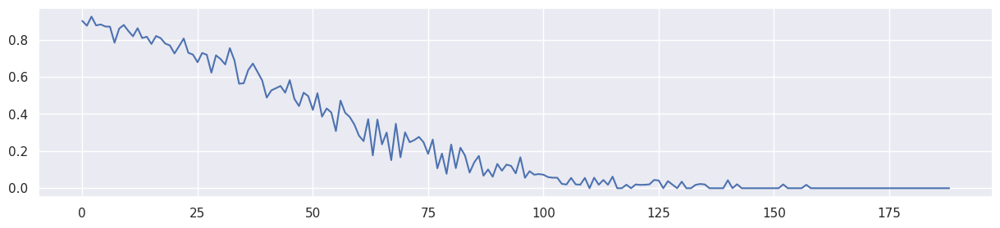

Mean F1 for all data: 0.2538332654645058


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


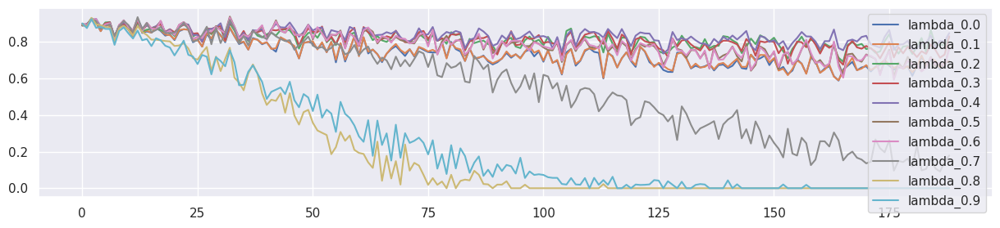

In [54]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.7]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.


lambda_f_set2 = [0.0001478] #,0.000001,0.000002,0.000003,0.000004]
#lambda_f_set2 = [0.00503] #,0.00502,0.00503] #,0.000001,0.000002,0.000003,0.000004]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    lambda_a2 = lambda_f2
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]

    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter = train_model55(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.00015)
        result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

        result_table2['lambda'].append(lambda_f)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
        result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
        result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
        result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])


+ 유효기간을 더 연장하다.

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 136.499283] [G loss: 0.641798]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 188.938370] [G loss: 0.546369]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 215.002930] [G loss: 0.441890]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 254.396454] [G loss: 0.401941]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 255.433929] [G loss: 0.378943]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 221.259338] [G loss: 0.348475]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 189.271667] [G loss: 0.321004]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 149.015579] [G loss: 0.289689]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 152.777222] [G loss: 0.265015]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 168.338089] [G loss: 0.251555]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 184.168976] [G loss: 0.242847]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 197.314804] [G loss: 0.2

100%|██████████| 189/189 [00:00<00:00, 454.02it/s]


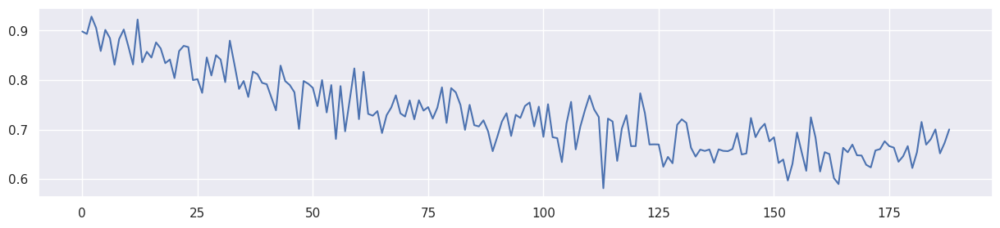

Mean F1 for all data: 0.7320914450080135
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 134.917404] [G loss: 0.641777]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 187.092194] [G loss: 0.545896]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 210.780991] [G loss: 0.441627]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 237.938019] [G loss: 0.401485]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 222.461792] [G loss: 0.377215]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 186.652710] [G loss: 0.346394]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 153.995285] [G loss: 0.318252]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 121.051651] [G loss: 0.286477]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 117.718353] [G loss: 0.264146]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 117.163055] [G loss: 0.251194]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 116.496750] [G loss: 0.242802]
[Lambda: 0.100000] [Epoch 2400

100%|██████████| 189/189 [00:00<00:00, 454.77it/s]


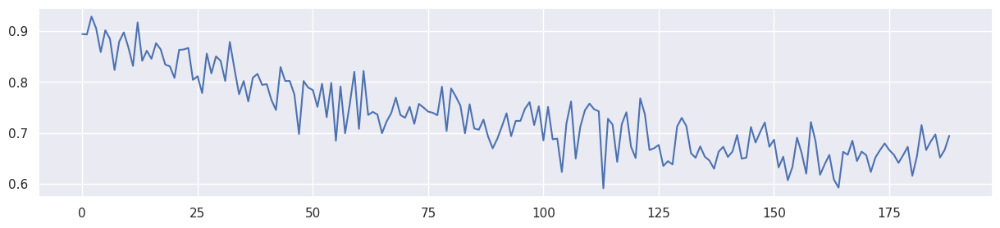

Mean F1 for all data: 0.7336472360324378
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 129.139832] [G loss: 0.642819]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 181.367691] [G loss: 0.542593]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 203.181808] [G loss: 0.437260]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 220.455734] [G loss: 0.399755]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 193.527084] [G loss: 0.375370]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 154.422852] [G loss: 0.343719]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 121.515709] [G loss: 0.314944]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 97.673592] [G loss: 0.283779]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 90.517113] [G loss: 0.262616]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 86.348793] [G loss: 0.249828]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 80.268501] [G loss: 0.241319]
[Lambda: 0.200000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 448.31it/s]


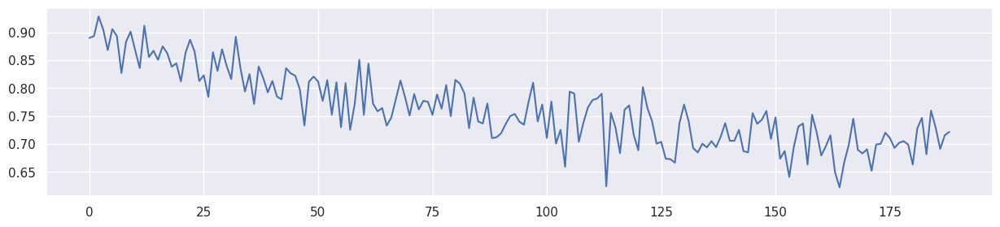

Mean F1 for all data: 0.7628394087203021
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 114.555344] [G loss: 0.646776]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 169.981506] [G loss: 0.544363]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 192.540100] [G loss: 0.438279]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 196.313599] [G loss: 0.399192]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 163.848907] [G loss: 0.372917]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 129.439423] [G loss: 0.340830]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 101.241753] [G loss: 0.309908]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 82.930298] [G loss: 0.279320]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 75.300034] [G loss: 0.259891]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 66.317207] [G loss: 0.246929]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 64.795227] [G loss: 0.238396]
[Lambda: 0.300000] [Epoch 2400/400

100%|██████████| 189/189 [00:00<00:00, 447.85it/s]


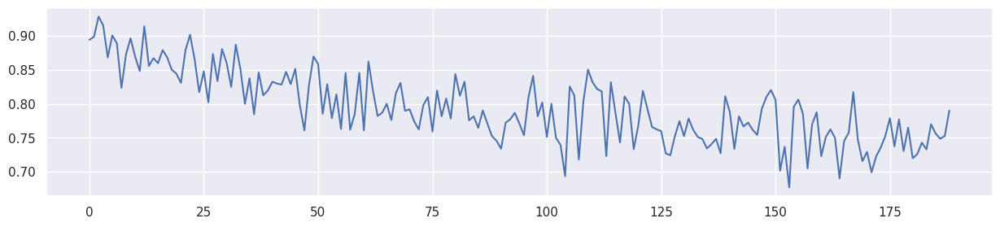

Mean F1 for all data: 0.7945545560574274
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 101.764221] [G loss: 0.649083]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 149.729446] [G loss: 0.543622]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 178.069931] [G loss: 0.435824]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 176.175522] [G loss: 0.397264]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 141.985870] [G loss: 0.368307]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 113.304581] [G loss: 0.335573]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 89.609398] [G loss: 0.304184]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 75.581932] [G loss: 0.275043]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 65.320374] [G loss: 0.255663]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 59.472378] [G loss: 0.244732]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 53.762447] [G loss: 0.237172]
[Lambda: 0.400000] [Epoch 2400/4000

100%|██████████| 189/189 [00:00<00:00, 442.15it/s]


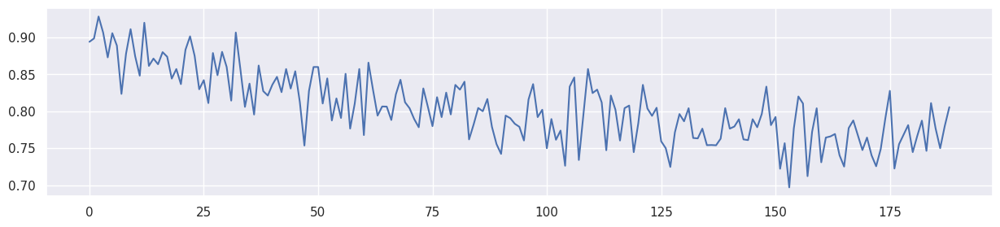

Mean F1 for all data: 0.8052334760232402
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 96.290749] [G loss: 0.650419]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 140.203583] [G loss: 0.545522]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 163.749344] [G loss: 0.436342]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 147.197174] [G loss: 0.396910]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 113.604500] [G loss: 0.362940]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 88.234016] [G loss: 0.327503]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 68.055779] [G loss: 0.292759]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 57.090843] [G loss: 0.264592]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 51.889172] [G loss: 0.249084]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 47.881485] [G loss: 0.240132]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 43.410271] [G loss: 0.234495]
[Lambda: 0.500000] [Epoch 2400/4000] 

100%|██████████| 189/189 [00:00<00:00, 454.82it/s]


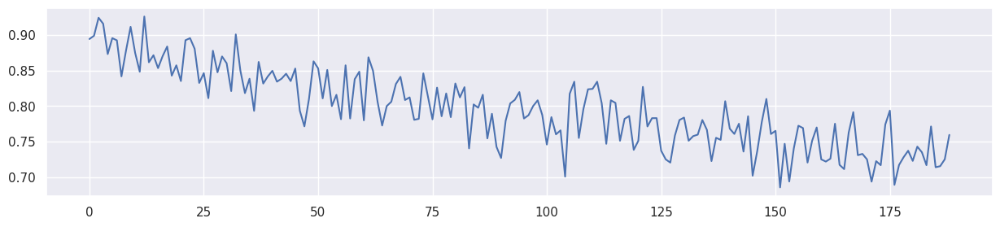

Mean F1 for all data: 0.7959257281840068
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 92.344864] [G loss: 0.651459]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 129.602478] [G loss: 0.548299]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 147.327515] [G loss: 0.438456]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 128.194016] [G loss: 0.395465]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 97.442490] [G loss: 0.360144]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 75.836418] [G loss: 0.324676]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 55.688099] [G loss: 0.290247]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 47.738350] [G loss: 0.263022]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 43.942001] [G loss: 0.248359]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 40.223377] [G loss: 0.239843]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 37.824608] [G loss: 0.233923]
[Lambda: 0.600000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 448.38it/s]


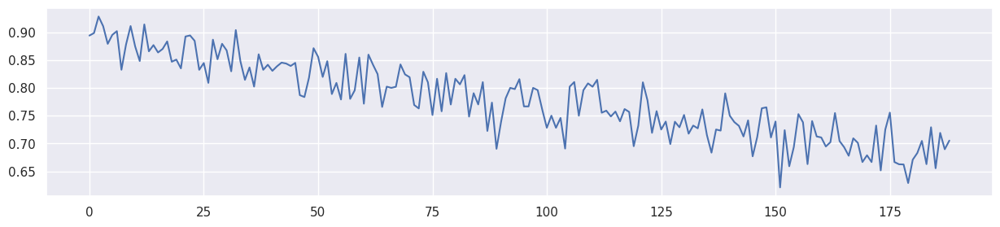

Mean F1 for all data: 0.7785962829628155
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 86.331238] [G loss: 0.654242]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 109.577393] [G loss: 0.560045]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 125.657181] [G loss: 0.442239]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 108.268715] [G loss: 0.393774]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 82.428322] [G loss: 0.357211]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 63.499157] [G loss: 0.322895]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 48.329060] [G loss: 0.288762]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 42.390507] [G loss: 0.262733]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 39.168453] [G loss: 0.247806]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 36.877010] [G loss: 0.237609]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 35.476688] [G loss: 0.230592]
[Lambda: 0.700000] [Epoch 2400/4000] [

100%|██████████| 189/189 [00:00<00:00, 442.81it/s]


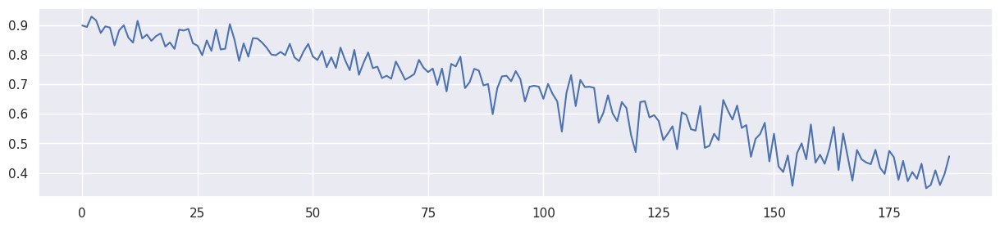

Mean F1 for all data: 0.6655959254281996
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 68.418030] [G loss: 0.667860]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 56.133026] [G loss: 0.605323]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 53.293415] [G loss: 0.472217]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 58.177727] [G loss: 0.376855]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 52.269886] [G loss: 0.321843]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 46.508186] [G loss: 0.286008]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 41.919704] [G loss: 0.263791]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 38.263611] [G loss: 0.249143]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 35.811050] [G loss: 0.239587]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 34.240463] [G loss: 0.233621]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 33.225628] [G loss: 0.229747]
[Lambda: 0.800000] [Epoch 2400/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 448.36it/s]


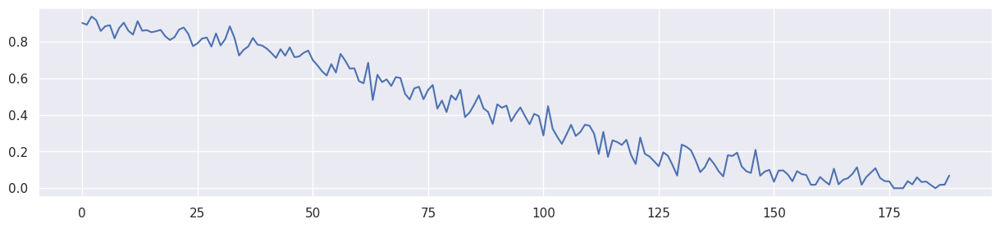

Mean F1 for all data: 0.41859533992093734
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 100.018715] [G loss: 0.686115]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 39.699104] [G loss: 0.677146]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 30.956942] [G loss: 0.650219]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 30.101604] [G loss: 0.624029]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 26.261021] [G loss: 0.569009]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 41.687260] [G loss: 0.403830]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 41.911880] [G loss: 0.318551]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 38.562252] [G loss: 0.282295]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 35.812893] [G loss: 0.263065]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 34.079105] [G loss: 0.251302]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 32.757549] [G loss: 0.243698]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 31.844347] [G loss: 0.238381]
[Lambda: 0.900000] [Epoch 2400/4000] [mi

100%|██████████| 189/189 [00:00<00:00, 450.82it/s]


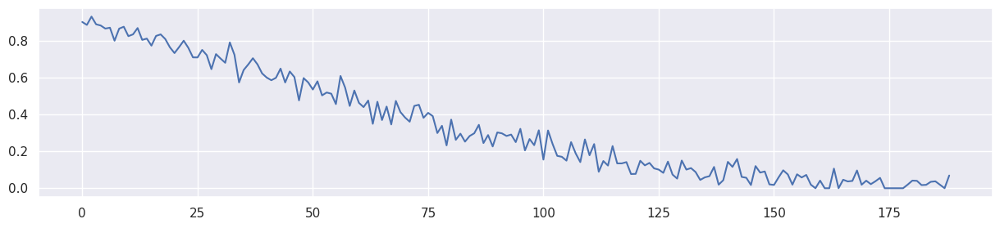

Mean F1 for all data: 0.3349122958530002


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


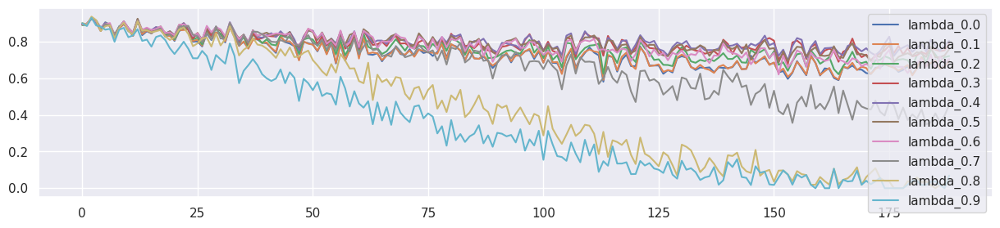

In [55]:
seed_everything()

train_result = []

avaible_range = 800

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.

result_table = {}
result_table2 = {}
result_table2['lambda']=[]
result_table2['test_f1']=[]
result_table2['init_f1']=[]
result_table2['mean_f1']=[]
result_table2['last_f1']=[]
result_table2['MI(y^,z)']=[]

for lambda_f in lambda_f_set:
    '''
    if lambda_f == 0.0:
        f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
        result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
    else:
    '''
    f1,mi,last_generator, last_adapter = train_model5(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 0.000153)
    result_table[f'lambda_{lambda_f}'] = test_all_data2(last_generator,last_adapter,2000)

    result_table2['lambda'].append(lambda_f)
    result_table2['test_f1'].append(f1)
    result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
    result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
    result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
    result_table2['MI(y^,z)'].append(mi)

result_df = pd.DataFrame(result_table)
result_df.plot(figsize=(15,3))

result4_df = pd.DataFrame(result_table2)

pd.concat([result3_df, result2_df,result4_df])



## D(G(x,b)) 구조

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 상기와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

In [56]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):
   
    def __init__(self,input_dim):
        """Initializes DiscriminatorF with torch components."""
        
        super(Sensitivity_Adapter, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        #self.fc3 = nn.ModuleList()
        
        for i in range(self.input_dim): 
            self.fc1.append(nn.Linear(2, 30))
            self.fc2.append(nn.Linear(30, 1))
            #self.fc3.append(nn.Linear(5, 1))

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1)))
            #h1 = F.relu(self.fc2[i](h0))
            #h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = self.fc2[i](h0)
            h2 = self.fc2[i](h0)
            pxy.append(h2)
            
        return torch.cat(pxy, dim=1)

In [57]:

def test_model6(model_,model2_, tX, ty, s1):
    model_.eval()
    model2_.eval()

    ax = model2_(tX[:,0:5],tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    
    f1 = f1_score(ty,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4],columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [58]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model6(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):

    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net()
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.001)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  MINE -> I(Z,B)의 측정
        # -------------------------------
        xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = torch.sum(mse_loss(xs, XS_train[:,0:5]))

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model6(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

In [59]:
def test_all_data6(generator,adapter,train_size):

    XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    yT = y[train_size:]
    print('XT.shape',XT.shape)
    bucket_size_array=[200]
    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32)
            xs = adapter(tmp_x[:,0:5],tmp_x[:,5].reshape(-1,1)/avaible_range)
            predicted_y = generator(xs)
            predicted_y = (predicted_y.data.numpy()> 0.5).astype(float)
            f1 = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)
        plt.figure(figsize=(15,3))
        plt.plot(f1s)
        plt.show()

    print('Mean F1 for all data:',np.mean(f1s))   
    return f1s

[Lambda: 0.000000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.000000] [Epoch 200/4000] [mi loss: 23.307766] [G loss: 0.613722]
[Lambda: 0.000000] [Epoch 400/4000] [mi loss: 125.971985] [G loss: 0.339406]
[Lambda: 0.000000] [Epoch 600/4000] [mi loss: 291.944916] [G loss: 0.235180]
[Lambda: 0.000000] [Epoch 800/4000] [mi loss: 355.579163] [G loss: 0.227342]
[Lambda: 0.000000] [Epoch 1000/4000] [mi loss: 378.128448] [G loss: 0.225178]
[Lambda: 0.000000] [Epoch 1200/4000] [mi loss: 389.175537] [G loss: 0.223740]
[Lambda: 0.000000] [Epoch 1400/4000] [mi loss: 404.774506] [G loss: 0.222447]
[Lambda: 0.000000] [Epoch 1600/4000] [mi loss: 425.943451] [G loss: 0.221149]
[Lambda: 0.000000] [Epoch 1800/4000] [mi loss: 449.250000] [G loss: 0.219839]
[Lambda: 0.000000] [Epoch 2000/4000] [mi loss: 475.193939] [G loss: 0.218683]
[Lambda: 0.000000] [Epoch 2200/4000] [mi loss: 508.239563] [G loss: 0.217532]
[Lambda: 0.000000] [Epoch 2400/4000] [mi loss: 553.405396] [G loss: 0.2164

100%|██████████| 189/189 [00:00<00:00, 375.75it/s]


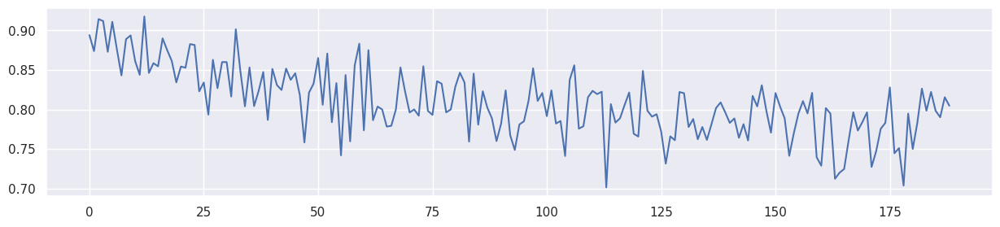

Mean F1 for all data: 0.8092665022978573
[Lambda: 0.100000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.100000] [Epoch 200/4000] [mi loss: 0.046312] [G loss: 0.675293]
[Lambda: 0.100000] [Epoch 400/4000] [mi loss: 0.045886] [G loss: 0.633281]
[Lambda: 0.100000] [Epoch 600/4000] [mi loss: 0.126463] [G loss: 0.575082]
[Lambda: 0.100000] [Epoch 800/4000] [mi loss: 0.225421] [G loss: 0.508246]
[Lambda: 0.100000] [Epoch 1000/4000] [mi loss: 0.305169] [G loss: 0.445880]
[Lambda: 0.100000] [Epoch 1200/4000] [mi loss: 0.351074] [G loss: 0.391965]
[Lambda: 0.100000] [Epoch 1400/4000] [mi loss: 0.362471] [G loss: 0.349318]
[Lambda: 0.100000] [Epoch 1600/4000] [mi loss: 0.349607] [G loss: 0.319109]
[Lambda: 0.100000] [Epoch 1800/4000] [mi loss: 0.322885] [G loss: 0.298522]
[Lambda: 0.100000] [Epoch 2000/4000] [mi loss: 0.295228] [G loss: 0.283997]
[Lambda: 0.100000] [Epoch 2200/4000] [mi loss: 0.268884] [G loss: 0.273486]
[Lambda: 0.100000] [Epoch 2400/4000] [mi loss: 0.24624

100%|██████████| 189/189 [00:00<00:00, 370.38it/s]


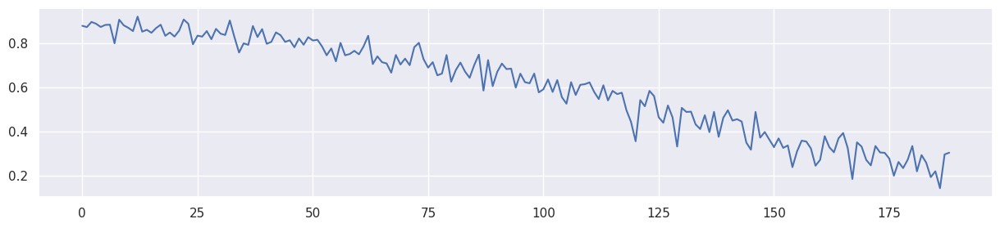

Mean F1 for all data: 0.6038722493054812
[Lambda: 0.200000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.200000] [Epoch 200/4000] [mi loss: 0.037821] [G loss: 0.676711]
[Lambda: 0.200000] [Epoch 400/4000] [mi loss: 0.011691] [G loss: 0.640221]
[Lambda: 0.200000] [Epoch 600/4000] [mi loss: 0.031525] [G loss: 0.593870]
[Lambda: 0.200000] [Epoch 800/4000] [mi loss: 0.060193] [G loss: 0.539695]
[Lambda: 0.200000] [Epoch 1000/4000] [mi loss: 0.087569] [G loss: 0.485400]
[Lambda: 0.200000] [Epoch 1200/4000] [mi loss: 0.107743] [G loss: 0.433172]
[Lambda: 0.200000] [Epoch 1400/4000] [mi loss: 0.120361] [G loss: 0.386296]
[Lambda: 0.200000] [Epoch 1600/4000] [mi loss: 0.122746] [G loss: 0.349278]
[Lambda: 0.200000] [Epoch 1800/4000] [mi loss: 0.119241] [G loss: 0.322670]
[Lambda: 0.200000] [Epoch 2000/4000] [mi loss: 0.112166] [G loss: 0.303677]
[Lambda: 0.200000] [Epoch 2200/4000] [mi loss: 0.103138] [G loss: 0.290022]
[Lambda: 0.200000] [Epoch 2400/4000] [mi loss: 0.09225

100%|██████████| 189/189 [00:00<00:00, 375.13it/s]


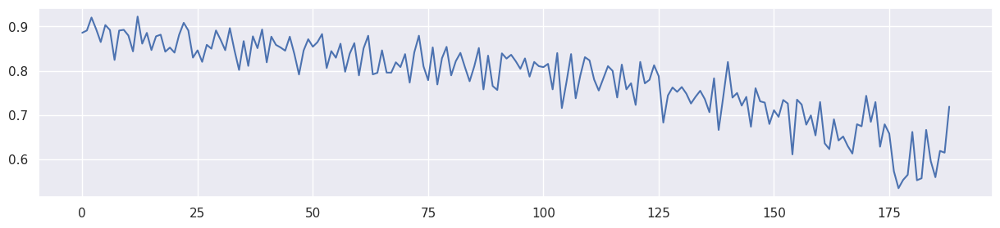

Mean F1 for all data: 0.7818995705341353
[Lambda: 0.300000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.300000] [Epoch 200/4000] [mi loss: 0.036050] [G loss: 0.677182]
[Lambda: 0.300000] [Epoch 400/4000] [mi loss: 0.005574] [G loss: 0.642862]
[Lambda: 0.300000] [Epoch 600/4000] [mi loss: 0.011685] [G loss: 0.601608]
[Lambda: 0.300000] [Epoch 800/4000] [mi loss: 0.023486] [G loss: 0.554085]
[Lambda: 0.300000] [Epoch 1000/4000] [mi loss: 0.035521] [G loss: 0.505491]
[Lambda: 0.300000] [Epoch 1200/4000] [mi loss: 0.046252] [G loss: 0.457105]
[Lambda: 0.300000] [Epoch 1400/4000] [mi loss: 0.053683] [G loss: 0.411005]
[Lambda: 0.300000] [Epoch 1600/4000] [mi loss: 0.057387] [G loss: 0.371794]
[Lambda: 0.300000] [Epoch 1800/4000] [mi loss: 0.057039] [G loss: 0.341455]
[Lambda: 0.300000] [Epoch 2000/4000] [mi loss: 0.053106] [G loss: 0.319118]
[Lambda: 0.300000] [Epoch 2200/4000] [mi loss: 0.047758] [G loss: 0.301716]
[Lambda: 0.300000] [Epoch 2400/4000] [mi loss: 0.04201

100%|██████████| 189/189 [00:00<00:00, 378.21it/s]


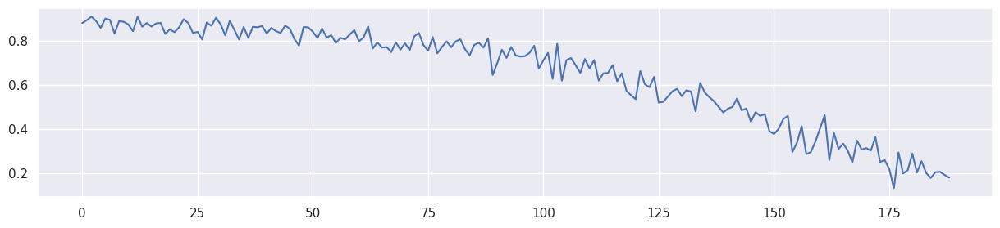

Mean F1 for all data: 0.6496903349303821
[Lambda: 0.400000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.400000] [Epoch 200/4000] [mi loss: 0.035375] [G loss: 0.677422]
[Lambda: 0.400000] [Epoch 400/4000] [mi loss: 0.003500] [G loss: 0.644237]
[Lambda: 0.400000] [Epoch 600/4000] [mi loss: 0.005452] [G loss: 0.605717]
[Lambda: 0.400000] [Epoch 800/4000] [mi loss: 0.010486] [G loss: 0.562516]
[Lambda: 0.400000] [Epoch 1000/4000] [mi loss: 0.016139] [G loss: 0.517772]
[Lambda: 0.400000] [Epoch 1200/4000] [mi loss: 0.021492] [G loss: 0.472624]
[Lambda: 0.400000] [Epoch 1400/4000] [mi loss: 0.026405] [G loss: 0.427901]
[Lambda: 0.400000] [Epoch 1600/4000] [mi loss: 0.028728] [G loss: 0.388345]
[Lambda: 0.400000] [Epoch 1800/4000] [mi loss: 0.029762] [G loss: 0.355488]
[Lambda: 0.400000] [Epoch 2000/4000] [mi loss: 0.027950] [G loss: 0.330217]
[Lambda: 0.400000] [Epoch 2200/4000] [mi loss: 0.025206] [G loss: 0.310437]
[Lambda: 0.400000] [Epoch 2400/4000] [mi loss: 0.02229

100%|██████████| 189/189 [00:00<00:00, 371.09it/s]


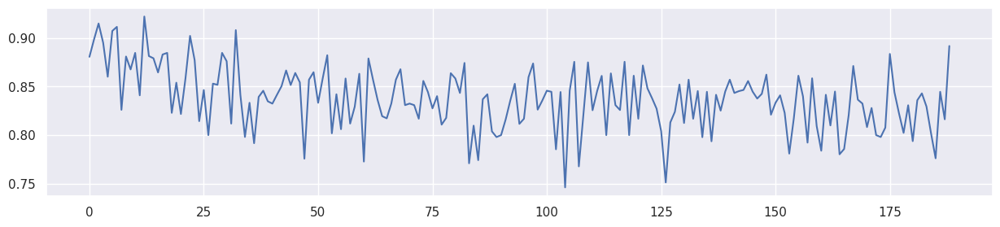

Mean F1 for all data: 0.8375673323589945
[Lambda: 0.500000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.500000] [Epoch 200/4000] [mi loss: 0.035031] [G loss: 0.677567]
[Lambda: 0.500000] [Epoch 400/4000] [mi loss: 0.002750] [G loss: 0.645017]
[Lambda: 0.500000] [Epoch 600/4000] [mi loss: 0.002744] [G loss: 0.608446]
[Lambda: 0.500000] [Epoch 800/4000] [mi loss: 0.004944] [G loss: 0.568062]
[Lambda: 0.500000] [Epoch 1000/4000] [mi loss: 0.007613] [G loss: 0.526155]
[Lambda: 0.500000] [Epoch 1200/4000] [mi loss: 0.010289] [G loss: 0.483610]
[Lambda: 0.500000] [Epoch 1400/4000] [mi loss: 0.012782] [G loss: 0.441014]
[Lambda: 0.500000] [Epoch 1600/4000] [mi loss: 0.014886] [G loss: 0.401071]
[Lambda: 0.500000] [Epoch 1800/4000] [mi loss: 0.015468] [G loss: 0.367313]
[Lambda: 0.500000] [Epoch 2000/4000] [mi loss: 0.014945] [G loss: 0.339602]
[Lambda: 0.500000] [Epoch 2200/4000] [mi loss: 0.013577] [G loss: 0.317695]
[Lambda: 0.500000] [Epoch 2400/4000] [mi loss: 0.01178

100%|██████████| 189/189 [00:00<00:00, 372.64it/s]


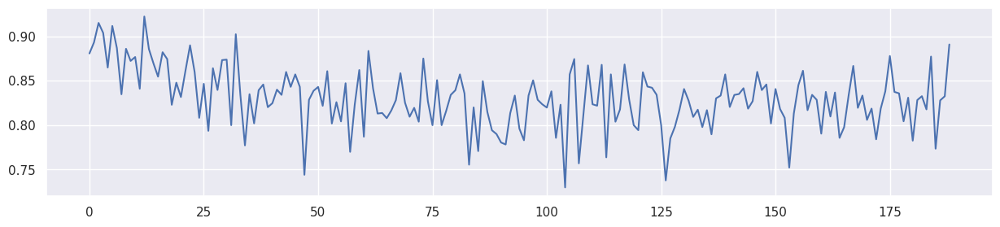

Mean F1 for all data: 0.8300343450996329
[Lambda: 0.600000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.600000] [Epoch 200/4000] [mi loss: 0.034826] [G loss: 0.677662]
[Lambda: 0.600000] [Epoch 400/4000] [mi loss: 0.002420] [G loss: 0.645533]
[Lambda: 0.600000] [Epoch 600/4000] [mi loss: 0.001522] [G loss: 0.610282]
[Lambda: 0.600000] [Epoch 800/4000] [mi loss: 0.002439] [G loss: 0.571849]
[Lambda: 0.600000] [Epoch 1000/4000] [mi loss: 0.003547] [G loss: 0.532102]
[Lambda: 0.600000] [Epoch 1200/4000] [mi loss: 0.004752] [G loss: 0.491796]
[Lambda: 0.600000] [Epoch 1400/4000] [mi loss: 0.006083] [G loss: 0.450949]
[Lambda: 0.600000] [Epoch 1600/4000] [mi loss: 0.007153] [G loss: 0.412137]
[Lambda: 0.600000] [Epoch 1800/4000] [mi loss: 0.007718] [G loss: 0.377288]
[Lambda: 0.600000] [Epoch 2000/4000] [mi loss: 0.007474] [G loss: 0.348055]
[Lambda: 0.600000] [Epoch 2200/4000] [mi loss: 0.006860] [G loss: 0.324490]
[Lambda: 0.600000] [Epoch 2400/4000] [mi loss: 0.00594

100%|██████████| 189/189 [00:00<00:00, 375.44it/s]


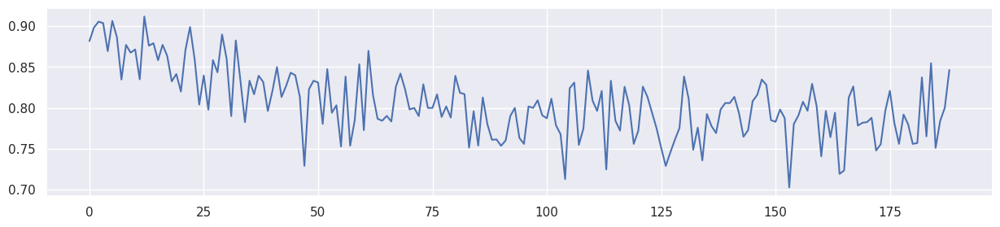

Mean F1 for all data: 0.8057508834459151
[Lambda: 0.700000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.700000] [Epoch 200/4000] [mi loss: 0.034691] [G loss: 0.677733]
[Lambda: 0.700000] [Epoch 400/4000] [mi loss: 0.002267] [G loss: 0.645895]
[Lambda: 0.700000] [Epoch 600/4000] [mi loss: 0.000973] [G loss: 0.611534]
[Lambda: 0.700000] [Epoch 800/4000] [mi loss: 0.001169] [G loss: 0.574654]
[Lambda: 0.700000] [Epoch 1000/4000] [mi loss: 0.001599] [G loss: 0.536476]
[Lambda: 0.700000] [Epoch 1200/4000] [mi loss: 0.002105] [G loss: 0.497676]
[Lambda: 0.700000] [Epoch 1400/4000] [mi loss: 0.002652] [G loss: 0.458395]
[Lambda: 0.700000] [Epoch 1600/4000] [mi loss: 0.003083] [G loss: 0.420745]
[Lambda: 0.700000] [Epoch 1800/4000] [mi loss: 0.003380] [G loss: 0.385835]
[Lambda: 0.700000] [Epoch 2000/4000] [mi loss: 0.003326] [G loss: 0.355385]
[Lambda: 0.700000] [Epoch 2200/4000] [mi loss: 0.003061] [G loss: 0.330704]
[Lambda: 0.700000] [Epoch 2400/4000] [mi loss: 0.00269

100%|██████████| 189/189 [00:00<00:00, 371.42it/s]


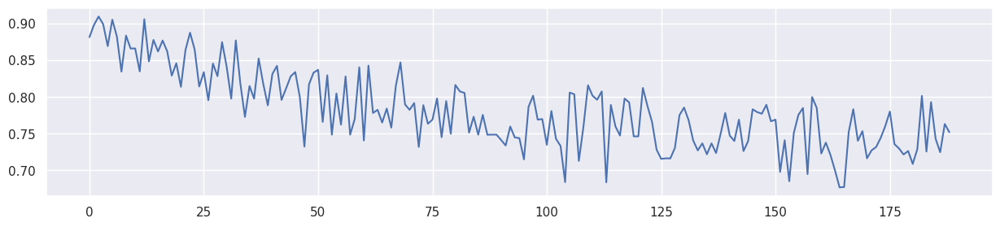

Mean F1 for all data: 0.7818952367373582
[Lambda: 0.800000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.800000] [Epoch 200/4000] [mi loss: 0.034596] [G loss: 0.677787]
[Lambda: 0.800000] [Epoch 400/4000] [mi loss: 0.002197] [G loss: 0.646171]
[Lambda: 0.800000] [Epoch 600/4000] [mi loss: 0.000716] [G loss: 0.612484]
[Lambda: 0.800000] [Epoch 800/4000] [mi loss: 0.000607] [G loss: 0.576670]
[Lambda: 0.800000] [Epoch 1000/4000] [mi loss: 0.000678] [G loss: 0.539773]
[Lambda: 0.800000] [Epoch 1200/4000] [mi loss: 0.000801] [G loss: 0.502348]
[Lambda: 0.800000] [Epoch 1400/4000] [mi loss: 0.000982] [G loss: 0.464360]
[Lambda: 0.800000] [Epoch 1600/4000] [mi loss: 0.001141] [G loss: 0.427376]
[Lambda: 0.800000] [Epoch 1800/4000] [mi loss: 0.001241] [G loss: 0.392798]
[Lambda: 0.800000] [Epoch 2000/4000] [mi loss: 0.001233] [G loss: 0.361728]
[Lambda: 0.800000] [Epoch 2200/4000] [mi loss: 0.001134] [G loss: 0.336083]
[Lambda: 0.800000] [Epoch 2400/4000] [mi loss: 0.00099

100%|██████████| 189/189 [00:00<00:00, 366.50it/s]


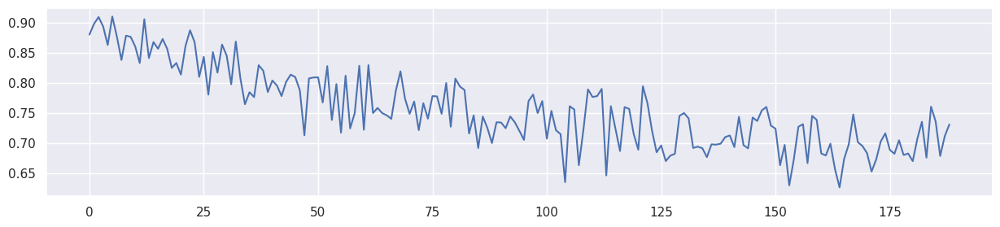

Mean F1 for all data: 0.7560504541332845
[Lambda: 0.900000] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.900000] [Epoch 200/4000] [mi loss: 0.034527] [G loss: 0.677832]
[Lambda: 0.900000] [Epoch 400/4000] [mi loss: 0.002169] [G loss: 0.646394]
[Lambda: 0.900000] [Epoch 600/4000] [mi loss: 0.000609] [G loss: 0.613235]
[Lambda: 0.900000] [Epoch 800/4000] [mi loss: 0.000380] [G loss: 0.578205]
[Lambda: 0.900000] [Epoch 1000/4000] [mi loss: 0.000306] [G loss: 0.542267]
[Lambda: 0.900000] [Epoch 1200/4000] [mi loss: 0.000281] [G loss: 0.505845]
[Lambda: 0.900000] [Epoch 1400/4000] [mi loss: 0.000289] [G loss: 0.468964]
[Lambda: 0.900000] [Epoch 1600/4000] [mi loss: 0.000306] [G loss: 0.432718]
[Lambda: 0.900000] [Epoch 1800/4000] [mi loss: 0.000315] [G loss: 0.398280]
[Lambda: 0.900000] [Epoch 2000/4000] [mi loss: 0.000307] [G loss: 0.366837]
[Lambda: 0.900000] [Epoch 2200/4000] [mi loss: 0.000282] [G loss: 0.340305]
[Lambda: 0.900000] [Epoch 2400/4000] [mi loss: 0.00024

100%|██████████| 189/189 [00:00<00:00, 375.55it/s]


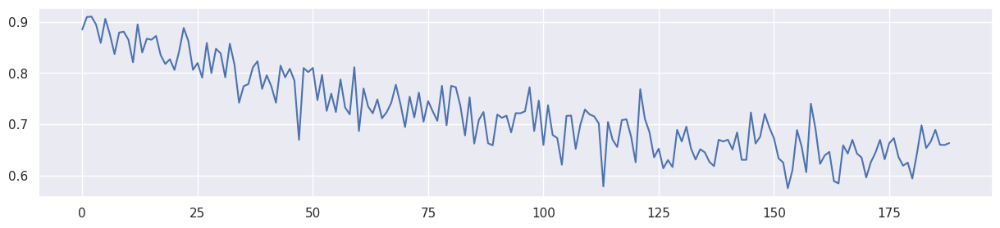

Mean F1 for all data: 0.7240031602283695


,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Feature 5,0.868571,0.889908,0.705877,0.623853,0.262262
1,Feature 6,0.875000,0.889908,0.299320,0.068966,0.230467
2,Feature 4,0.765714,0.871560,0.853043,0.904977,0.079596
0,0.0,0.875000,0.888889,0.716996,0.657407,0.261667
1,0.1,0.868571,0.883721,0.718557,0.651163,0.245552
2,0.2,0.868571,0.879630,0.721634,0.657407,0.245552
3,0.3,0.868571,0.895928,0.726968,0.663594,0.245552
4,0.4,0.875000,0.895928,0.732030,0.663594,0.243805
5,0.5,0.870056,0.900901,0.742320,0.663551,0.228285
6,0.6,0.868571,0.906667,0.752701,0.688073,0.230407


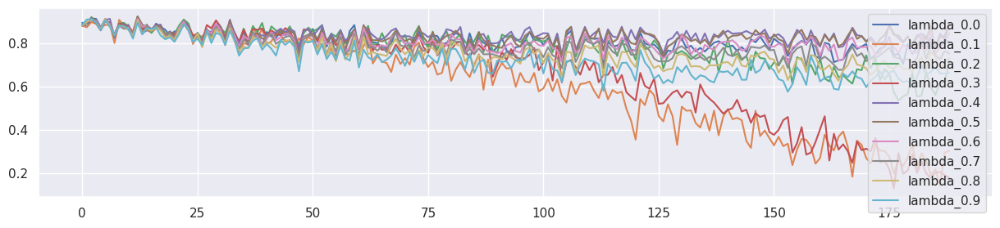

In [60]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091] 
lambda_f_set2 = [1.0] 
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]

    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter = train_model6(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        result_table[f'lambda_{lambda_f}'] = test_all_data6(last_generator,last_adapter,2000)

        result_table2['lambda'].append(lambda_f)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
        result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
        result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=(15,3))
    #plt.show()
    result4_df = pd.DataFrame(result_table2)

    #print(lambda_f2,result4_df)

pd.concat([result3_df, result2_df,result4_df])



<pre>
x0 ------>|                     |- x'0 --> |                | - x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                | - x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | MINE (I(x',y)) | - x'2 --> | Discriminator (D(x')   | -> y'
x3 ------>|                     |- x'3 --> | MI model       | - x'3 --> | predictive mode        |
z0 ------>|                     |- z'0 --> |                | - z'0 --> |                        |
                     ^
                     |
                     b
</pre>

In [61]:
class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()
        
        for i in range(self.input_dim): 
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H+1, 1))
            #self.fc4.append(nn.Linear(2, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y))
            h1 = self.fc3[i](torch.cat((h0, x[:,-1].reshape(-1,1)), 1) )
            #h2 = self.fc3[i](torch.cat((h0, x[:,-1].reshape(-1,1)), 1) )
            h.append(h1)

        return torch.cat(h, dim=1)  

In [62]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model7(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha):

    XS_train = train_tensors.XS_train
    y_train = train_tensors.y_train
    s1_train = train_tensors.s1_train
    
    XS_test = test_tensors.XS_test
    y_test = test_tensors.y_test
    s1_test = test_tensors.s1_test
    
    # Saves return values here
    #test_result = [] 
    
    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch
    

    # The loss values of each component will be saved in the following lists. 
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    mi_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator()

    # Initializes weights
    torch.manual_seed(seed)
    generator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(5)
    optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.01)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  Forwards Adapter
        # -------------------------------
        xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
        a_loss = torch.sum(mse_loss(xs, XS_train[:,0:5]))

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) 
        g_losses.append(g_loss)

        # -------------------------------
        #  I(x',y)의 MINE loss
        # -------------------------------
        
        s = np.random.choice(XS_train.shape[0],minibatch)
        x_sample = xs[s]
        y_sample = y_train[s].reshape(-1,1)
        y_shuffle = y_train[np.random.permutation(s)].reshape(-1,1)
        ret1 = torch.mean(mine(x_sample, y_sample)) - torch.log(torch.mean(torch.exp(mine(x_sample, y_shuffle))))
        mi_loss = - ret1



        optimizer_A.zero_grad()
        optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        #loss.backward()
        mi_losses.append(a_loss)
        #optimizer_D_F.step()

        loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha + mi_loss.mean() * lambda_a2 *5

        loss.backward()
        optimizer_G.step()
        optimizer_M.step()
        optimizer_A.step()            

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [a2: %1f] [Epoch %d/%d] [mi loss: %f] [G loss: %f]"
                    % (lambda_f, lambda_a2,epoch, n_epochs, mi_losses[-1], g_losses[-1])
                )

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    r2,mi = test_model6(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    return r2,mi,generator,adapter

[Lambda: 0.000000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 23.323299] [G loss: 0.613526]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 125.978516] [G loss: 0.339214]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 291.993286] [G loss: 0.235147]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 355.336517] [G loss: 0.227331]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 378.051697] [G loss: 0.225168]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 388.965912] [G loss: 0.223741]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 404.648743] [G loss: 0.222446]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 425.900970] [G loss: 0.221147]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 449.027802] [G loss: 0.219841]
[Lambda: 0.000000] [a2: 0.000150] [Epoch 2000/4000] [mi loss: 474.825012] [G los

100%|██████████| 189/189 [00:00<00:00, 381.54it/s]


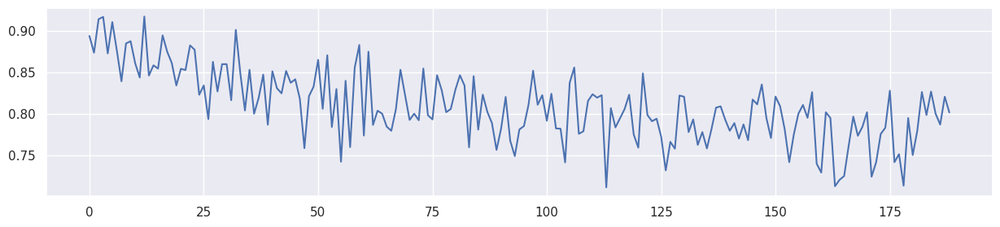

Mean F1 for all data: 0.8095105123071936
[Lambda: 0.100000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.046293] [G loss: 0.675294]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.045889] [G loss: 0.633282]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.126458] [G loss: 0.575083]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.225441] [G loss: 0.508242]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.305157] [G loss: 0.445876]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.351211] [G loss: 0.391945]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.362321] [G loss: 0.349332]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.350912] [G loss: 0.318991]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.324436] [G loss: 0.298391]
[Lambda: 0.100000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 373.71it/s]


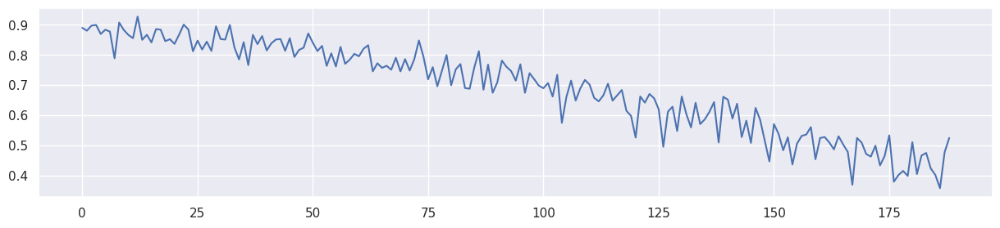

Mean F1 for all data: 0.6911741629185161
[Lambda: 0.200000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.037817] [G loss: 0.676711]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.011691] [G loss: 0.640221]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.031536] [G loss: 0.593867]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.060244] [G loss: 0.539681]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.087547] [G loss: 0.485403]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.107776] [G loss: 0.433165]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.119764] [G loss: 0.386442]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.122812] [G loss: 0.349255]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.118893] [G loss: 0.322741]
[Lambda: 0.200000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 378.63it/s]


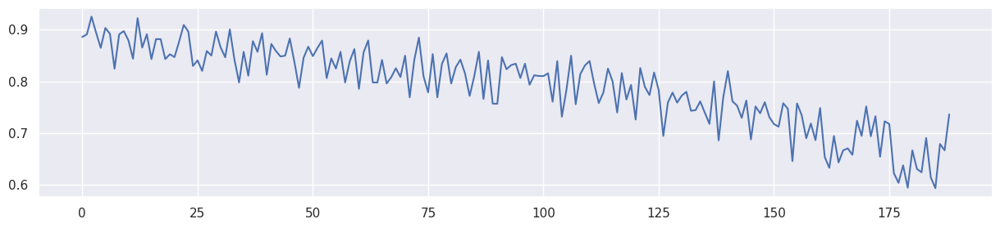

Mean F1 for all data: 0.7910813956935002
[Lambda: 0.300000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.036048] [G loss: 0.677182]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.005571] [G loss: 0.642862]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.011684] [G loss: 0.601608]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.023506] [G loss: 0.554075]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.035528] [G loss: 0.505486]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.046234] [G loss: 0.457110]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.053616] [G loss: 0.411032]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.057284] [G loss: 0.371827]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.057050] [G loss: 0.341449]
[Lambda: 0.300000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 369.18it/s]


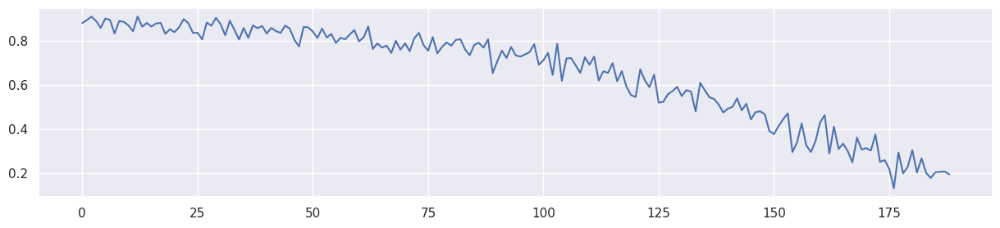

Mean F1 for all data: 0.6525789402550964
[Lambda: 0.400000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.035374] [G loss: 0.677422]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.003500] [G loss: 0.644237]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.005452] [G loss: 0.605717]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.010486] [G loss: 0.562516]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.016136] [G loss: 0.517772]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.021490] [G loss: 0.472624]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.026404] [G loss: 0.427899]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.028664] [G loss: 0.388386]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.029743] [G loss: 0.355501]
[Lambda: 0.400000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 372.39it/s]


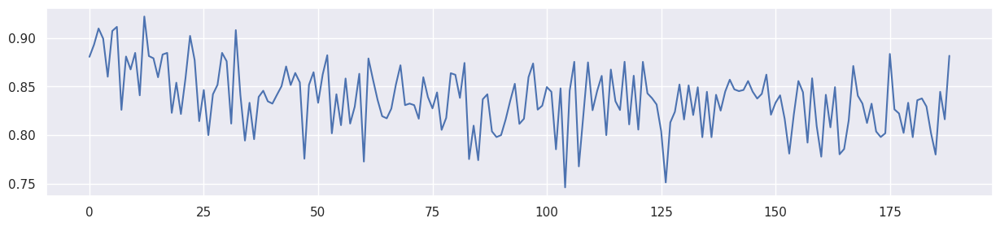

Mean F1 for all data: 0.8374686026975499
[Lambda: 0.500000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.035030] [G loss: 0.677567]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.002750] [G loss: 0.645017]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.002744] [G loss: 0.608447]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.004945] [G loss: 0.568062]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.007608] [G loss: 0.526162]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.010286] [G loss: 0.483616]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.012781] [G loss: 0.441021]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.014880] [G loss: 0.401087]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.015467] [G loss: 0.367320]
[Lambda: 0.500000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 367.46it/s]


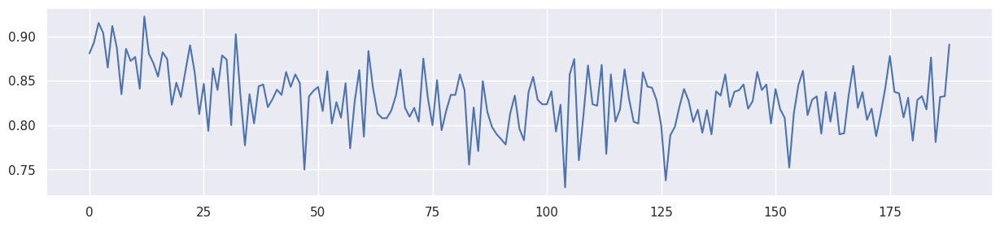

Mean F1 for all data: 0.8304513200152607
[Lambda: 0.600000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.034825] [G loss: 0.677662]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.002420] [G loss: 0.645533]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.001522] [G loss: 0.610282]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.002436] [G loss: 0.571853]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.003549] [G loss: 0.532100]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.004751] [G loss: 0.491799]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.006082] [G loss: 0.450954]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.007152] [G loss: 0.412141]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.007721] [G loss: 0.377285]
[Lambda: 0.600000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 376.99it/s]


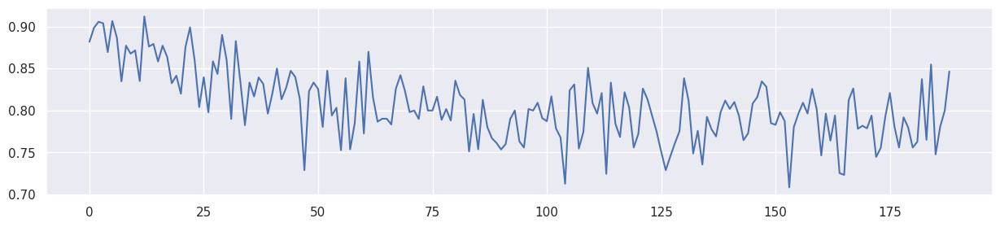

Mean F1 for all data: 0.8059082185231224
[Lambda: 0.700000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.034690] [G loss: 0.677733]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.002267] [G loss: 0.645895]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.000973] [G loss: 0.611533]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.001168] [G loss: 0.574654]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.001598] [G loss: 0.536480]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.002105] [G loss: 0.497676]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.002657] [G loss: 0.458384]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.003083] [G loss: 0.420746]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.003379] [G loss: 0.385837]
[Lambda: 0.700000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 374.33it/s]


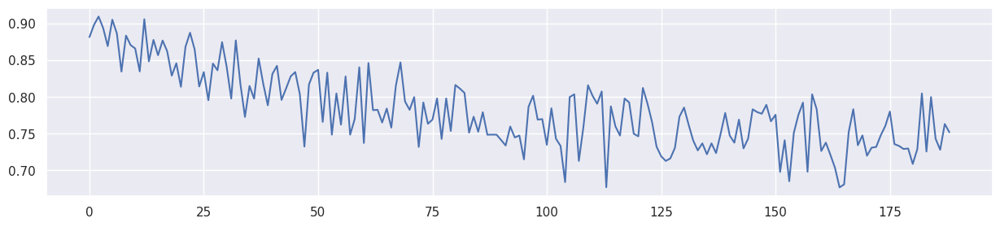

Mean F1 for all data: 0.782454363153566
[Lambda: 0.800000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.034595] [G loss: 0.677787]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.002197] [G loss: 0.646171]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.000716] [G loss: 0.612485]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.000607] [G loss: 0.576669]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.000678] [G loss: 0.539772]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.000801] [G loss: 0.502347]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.000982] [G loss: 0.464360]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.001141] [G loss: 0.427374]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.001241] [G loss: 0.392794]
[Lambda: 0.800000] [a2: 0.000150] [Epoch 2000/4000] [mi l

100%|██████████| 189/189 [00:00<00:00, 365.67it/s]


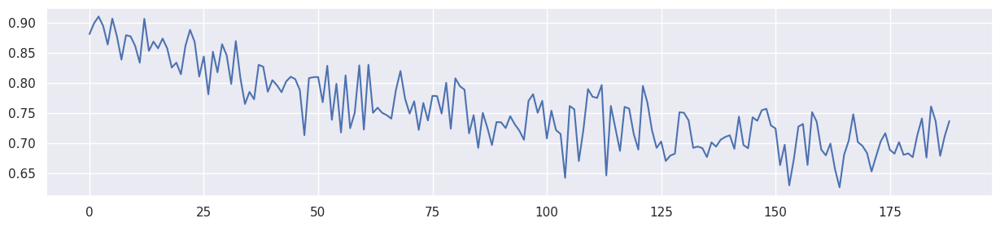

Mean F1 for all data: 0.7564404572868182
[Lambda: 0.900000] [a2: 0.000150] [Epoch 0/4000] [mi loss: 3.831744] [G loss: 0.692209]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 200/4000] [mi loss: 0.034526] [G loss: 0.677832]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 400/4000] [mi loss: 0.002169] [G loss: 0.646395]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 600/4000] [mi loss: 0.000609] [G loss: 0.613235]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 800/4000] [mi loss: 0.000380] [G loss: 0.578206]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 1000/4000] [mi loss: 0.000306] [G loss: 0.542267]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 1200/4000] [mi loss: 0.000281] [G loss: 0.505845]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 1400/4000] [mi loss: 0.000289] [G loss: 0.468962]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 1600/4000] [mi loss: 0.000306] [G loss: 0.432717]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 1800/4000] [mi loss: 0.000315] [G loss: 0.398278]
[Lambda: 0.900000] [a2: 0.000150] [Epoch 2000/4000] [mi 

100%|██████████| 189/189 [00:00<00:00, 372.43it/s]


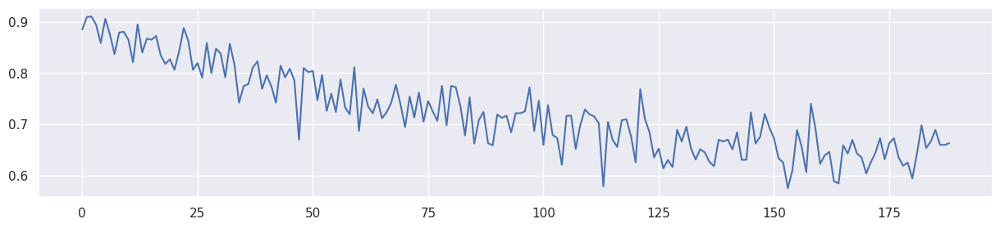

Mean F1 for all data: 0.7240293564493853
   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0     0.0  0.870056  0.894009  0.809511  0.801556  0.283244
1     0.1  0.875000  0.889908  0.691174  0.525641  0.238058
2     0.2  0.863636  0.885845  0.791081  0.736264  0.230132
3     0.3  0.865169  0.880734  0.652579  0.193548  0.231272
4     0.4  0.863636  0.880734  0.837469  0.881818  0.230132
5     0.5  0.863636  0.880734  0.830451  0.890830  0.230132
6     0.6  0.863636  0.881818  0.805908  0.846473  0.250217
7     0.7  0.868571  0.881818  0.782454  0.752066  0.245552
8     0.8  0.870056  0.880734  0.756440  0.736402  0.266231
9     0.9  0.881356  0.884793  0.724029  0.663636  0.259820


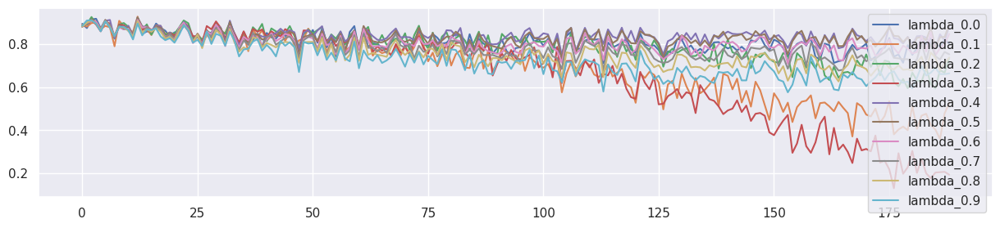

In [64]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.7]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



lambda_f_set2 = [0.00015] 
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]

    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter = train_model7(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= 1.0)
        result_table[f'lambda_{lambda_f}'] = test_all_data6(last_generator,last_adapter,2000)

        result_table2['lambda'].append(lambda_f)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(result_table[f'lambda_{lambda_f}'][0])
        result_table2['mean_f1'].append(np.mean(result_table[f'lambda_{lambda_f}']))
        result_table2['last_f1'].append(result_table[f'lambda_{lambda_f}'][-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=(15,3))

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

